# BL 1-5: SAXS data correction and reduction



#!/usr/bin/env python3

"""
Created on Fri Apr 21 23:41:02 2023

@author: akmaurya
"""

Global stuff

In [123]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
#from axis_plot_prop import axis_plot_prop 
import pyFAI
import shutil
import fabio
from pyFAI.gui.jupyter.calib import Calibration

import os
import fnmatch


import warnings
warnings.filterwarnings('ignore')


# Common functions for the project

In [124]:
# plot setting fucntion

def axis_plot_prop(ax):
    """
    Set axis properties for plotting.

    Parameters
    ----------
    ax : matplotlib axis object
        The axis object to set properties for.
    """

    co = [
        [0, 0, 0],
        [1, 0, 0],
        [0.44, 0.00, 0.99],
        [1.00, 0.50, 0.10],
        [0.75, 0.00, 0.75],
        [0.50, 0.50, 0.50],
        [0.50, 0.57, 0.00],
        [0.64, 0.08, 0.18],
        [0.93, 0.00, 0.00]
    ]

    plt.rcParams['axes.prop_cycle'] = plt.cycler(color=co)

    ax.set_facecolor('white')
    ax.spines['top'].set_linewidth(1)
    ax.spines['right'].set_linewidth(1)
    ax.spines['bottom'].set_linewidth(1)
    ax.spines['left'].set_linewidth(1)
    ax.tick_params(axis='both', which='both', direction='in', length=4, width=1)
    ax.minorticks_on()
    ax.set_xlabel('X Label', fontsize=20, fontname='Arial')
    ax.set_ylabel('Y Label', fontsize=20, fontname='Arial')
    ax.tick_params(axis='both', labelsize=20)
    ax.legend(frameon=False)
    #ax.set_box_aspect(1)
    plt.tight_layout()
#2D plot settings function
# import matplotlib.pyplot as plt

def set_pcolor_properties():
    """
    Sets the best figure properties for pcolormap plot
    """
    plt.rcParams["figure.figsize"] = (6, 6)  # Set the figure size to 8 inches by 6 inches
    plt.rcParams["font.size"] = 20  # Set the font size to 12 points
    plt.rcParams["axes.linewidth"] = 1.5  # Set the linewidth of the axes to 1.5
    #plt.rcParams["axes.grid"] = True  # Show the grid
    #plt.rcParams["grid.alpha"] = 0.5  # Set the transparency of the grid to 0.5
    #plt.rcParams["grid.linewidth"] = 0.5  # Set the linewidth of the grid to 0.5
    plt.rcParams["image.cmap"] = "viridis"  # Set the colormap to viridis
    plt.rcParams["image.interpolation"] = "nearest"  # Set the interpolation to nearest

# create and update folder to save data
def create_update_subfolder(base_folder, common_keyword):
    common_folder_path = os.path.join(base_folder, common_keyword)
    
    if os.path.exists(base_folder) and os.path.isdir(common_folder_path):
        print(f"Subfolder '{common_keyword}' already exists within the base folder. Doing nothing.")
    else:
        os.makedirs(common_folder_path)
        print(f"Subfolder '{common_keyword}' created within the base folder.")

    return common_folder_path

# Convert pixel by pixel to qx by qy 2D SAXS plot

def convert_saxs_to_q(data, pixel_size, wavelength, detector_distance, beam_x, beam_y):
    # Define grid of pixel coordinates (assumes data is square)
    #x_pixels,y_pixels = data.shape
    x_pixels = 981
    y_pixels = 1043
    x_coords = np.arange(x_pixels) - beam_x
    y_coords = np.arange(y_pixels) - beam_y
    xx, yy = np.meshgrid(x_coords, y_coords)

    # Convert to q-space coordinates
    qx = 1e-9*2 * np.pi / wavelength * np.sin(pixel_size * xx / detector_distance)
    qy = 1e-9*2 * np.pi / wavelength * np.sin(pixel_size * yy / detector_distance)

    #print (len(xx))
    
    return qx, qy


    #print (qx)
    

def convert_waxs_to_q(data, pixel_size, wavelength, detector_distance, beam_x, beam_y):
    # Define grid of pixel coordinates (assumes data is square)
    #x_pixels,y_pixels = data.shape
    x_pixels = 487
    y_pixels = 195
    x_coords = np.arange(x_pixels) - beam_x
    y_coords = np.arange(y_pixels) - beam_y
    xx, yy = np.meshgrid(x_coords, y_coords)

    # Convert to q-space coordinates
    qx = 1e-9*2 * np.pi / wavelength * np.sin(pixel_size * xx / detector_distance)
    qy = 1e-9*2 * np.pi / wavelength * np.sin(pixel_size * yy / detector_distance)

    print (len(xx))
    
    return qx, qy


def set_plot_style(axs, fonts, xlabel, ylabel):
    axs.set_xlabel(xlabel, fontsize=fonts)
    axs.set_ylabel(ylabel, fontsize=fonts)
    axs.tick_params(axis='both', which='major', direction='out', length=4, width=1)
    axs.tick_params(which='minor', width=1, size=2)  # Adjust size as needed
    #axs.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)
    axs.set_facecolor('white')
    axs.spines['top'].set_linewidth(1)
    axs.spines['right'].set_linewidth(1)
    axs.spines['bottom'].set_linewidth(1)
    axs.spines['left'].set_linewidth(1)
    axs.tick_params(axis='x', labelsize=fonts)
    axs.tick_params(axis='y', labelsize=fonts)

    return axs    #print (qx) 
 


# Read poni file for azimuthal integration

# poni inputs

In [125]:
#folder_path_poni_mask = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Python/Data_Reduction/Convert_and_calibrate'
#folder_path_poni_mask = r'C:\Users\b_tassone\Desktop\Python\Convert_and_calibrate\Convert_and_calibrate'
folder_path_poni_mask = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Python_library/Acetolysis/May2024/Python/Convert_and_calibrate/Convert_and_calibrate'


SAXS_poni_file = "SAXS.poni"
WAXS_poni_file = "WAXS_GUI.poni"

#SAXS

In [126]:
poni_file_path = os.path.join(folder_path_poni_mask,SAXS_poni_file)
ai = pyFAI.load(poni_file_path)

print(ai)

#Define detector parameters for 2D q conversion
pixel_size = ai.get_pixel1() # in meters 
wavelength = ai.get_wavelength() #1.54e-10  # in meters
detector_distance = ai.get_dist()  # in meters
beam_x=489.889
beam_y= 626.550 # beam center x-coordinate in pixels


Detector Pilatus 1M	 PixelSize= 1.720e-04, 1.720e-04 m	 BottomRight (3)
Wavelength= 1.103320e-10 m
SampleDetDist= 2.712491e+00 m	PONI= 1.077666e-01, 8.426093e-02 m	rot1=0.000000  rot2=0.000000  rot3=0.000000 rad
DirectBeamDist= 2712.491 mm	Center: x=489.889, y=626.550 pix	Tilt= 0.000° tiltPlanRotation= 0.000° 𝛌= 1.103Å


#mask for SAXS

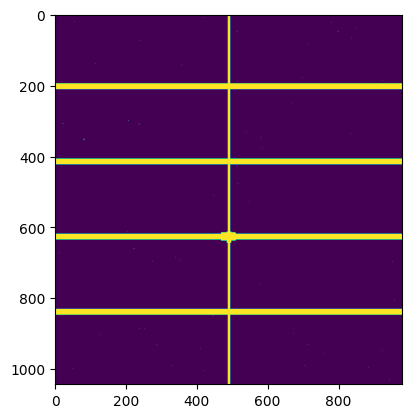

In [127]:
# Load the poni file and extract relevant parameters
mask = os.path.join(folder_path_poni_mask, "mask.edf")




#mask = "/Users/yuewu/Desktop/8091E/BL15_1M_gcarbon_mask_3.edf"
mask = fabio.open(mask).data
plt.imshow(mask)# display the mask

# WAXS

In [128]:

# Load the poni file and extract relevant parameters
poni_file_path = os.path.join(folder_path_poni_mask, WAXS_poni_file)
print
ai_w = pyFAI.load(poni_file_path)

print(ai_w)



#Define detector parameters for 2D q conversion
pixel_size = ai_w.get_pixel1() # in meters 
wavelength = ai_w.get_wavelength() #1.54e-10  # in meters
detector_distance = ai_w.get_dist()  # in meters
beam_x= 673.442
beam_y= 106.081 # beam center x-coordinate in pixels


Detector Pilatus 100k	 PixelSize= 1.720e-04, 1.720e-04 m	 BottomRight (3)
Wavelength= 1.033202e-10 m
SampleDetDist= 1.784010e-01 m	PONI= 1.787954e-02, 1.725575e-02 m	rot1=-0.504802  rot2=0.001798  rot3=0.000000 rad
DirectBeamDist= 203.824 mm	Center: x=673.442, y=106.081 pix	Tilt= 28.923° tiltPlanRotation= 0.213° 𝛌= 1.033Å


# Set the directory containing the raw and pdi files and list the keyword

In [129]:
import os
import fnmatch

def find_folders_with_keyword(folder_path, keyword, skip_folders=None):
    folder_names = []
    for item in os.listdir(folder_path):
        item_path = os.path.join(folder_path, item)
        if os.path.isdir(item_path) and fnmatch.fnmatch(item, keyword):
            if skip_folders is None or item not in skip_folders:
                folder_names.append(item)

    return folder_names

def get_keywords(raw_dir, common_keyword, keyword):
    data_folder = os.path.join(raw_dir, common_keyword)
    base_SAXS_folder = "OneD_integrated_SAXS_01/Reduction"
    base_SAXS_folder = os.path.join(raw_dir, base_SAXS_folder)
    base_WAXS_folder = "OneD_integrated_WAXS_01/Reduction"
    base_WAXS_folder = os.path.join(raw_dir, base_WAXS_folder)

    SAXS_folder_name = create_update_subfolder(base_SAXS_folder, common_keyword)
    WAXS_folder_name = create_update_subfolder(base_WAXS_folder, common_keyword)

    folder_names_with_keyword = find_folders_with_keyword(data_folder, keyword)

    ctr_values = [int(name.split('_ctr')[-1]) for name in folder_names_with_keyword]
    sorted_folder_names = [x for _, x in sorted(zip(ctr_values, folder_names_with_keyword))]

    keywords = sorted_folder_names
    return keywords, SAXS_folder_name, WAXS_folder_name,data_folder




# read parameters function

In [130]:
def process_and_store_selected_parameters_columns(data_folder, keywords):
    # Create an empty dictionary to store the selected columns for each file
    selected_columns_dict = {}

    for keyword in keywords:
        # Create a list of file paths that match the file types and current keyword
        #raw_file_pattern = f'*{keyword}/SAXS/*.raw'
        pdi_file_pattern = f'*{keyword}/*_scan1.csv'
        #raw_file_paths = sorted(glob.glob(os.path.join(raw_dir, raw_file_pattern)))
        pdi_file_paths = sorted(glob.glob(os.path.join(data_folder, pdi_file_pattern)))

        for pdi_file_path in pdi_file_paths:
            try:
                # Read the CSV file
                df = pd.read_csv(pdi_file_path)
                file_name = os.path.splitext(os.path.basename(pdi_file_path))[0]
                #print(f"Reading file: {file_name}")

                # Extract columns 4, 7, 9, and 15
                selected_columns = df.iloc[:, [2, 3, 6, 10, 29, 30]]

                # Store the selected columns in the dictionary with the file name as the key
                selected_columns_dict[file_name] = selected_columns

            except FileNotFoundError:
                print(f"File not found: {pdi_file_path}")
            except Exception as e:
                print(f"An error occurred: {e}")

    return selected_columns_dict

# Call the function and pass the raw_dir and keywords as arguments
#raw_dir = 'path_to_your_raw_files_directory'
#keywords = ['keyword1', 'keyword2', 'keyword3']  # Replace with your actual keywords
#
# To load the result_dict back from the file, you can use the following code:

#print(result_dict)


In [131]:
import pandas as pd
import os
import glob
import shutil
import matplotlib.pyplot as plt

def read_parameters(data_folder, keyword, result_dict):
    # Create lists to store averaged values
    bstop_dx_avg = []
    ctemp_dx_avg = []
    timer_dx_avg = []
    i0_dx_avg = []

    bstop_avg_all = []
    ctemp_avg_all = []
    timer_avg_all = []
    i0_avg_all = []

    avg_file_name = []

    # Call the function and pass the raw_dir and keywords as arguments


    i0_dx_avg_tmp = []
    bstop_dx_avg_tmp = []
    ctemp_dx_avg_tmp = []
    timer_dx_avg_tmp = []

    # Create a list of file paths that match the file types and current keyword
    pdi_file_pattern = f'*{keyword}/*_scan1.csv'
    pdi_file_paths = sorted(glob.glob(os.path.join(data_folder, pdi_file_pattern)))

    for pdi_file_path in pdi_file_paths:
        file_name = os.path.splitext(os.path.basename(pdi_file_path))[0]

        # Access the selected columns for the specified file
        selected_columns = result_dict.get(file_name)

        if selected_columns is not None:
            # Access individual columns by index or name
            i0 = selected_columns.iloc[:, 1]
            bstop = selected_columns.iloc[:, 2]
            ctemp = selected_columns.iloc[:, 4]
            timer = selected_columns.iloc[:, 5]

            try:
                # Convert the columns to numeric values, skipping non-numeric data
                i0 = pd.to_numeric(i0, errors='coerce')
                bstop = pd.to_numeric(bstop, errors='coerce')
                ctemp = pd.to_numeric(ctemp, errors='coerce')
                timer = pd.to_numeric(timer, errors='coerce')

                # Calculate the average values, excluding NaN values
                i0_average = i0.mean(skipna=True)
                bstop_average = bstop.mean(skipna=True)
                ctemp_average = ctemp.mean(skipna=True)
                timer_average = timer.mean(skipna=True)

                # Append the averages to the respective lists
                i0_dx_avg_tmp.append(i0_average)
                bstop_dx_avg_tmp.append(bstop_average)
                ctemp_dx_avg_tmp.append(ctemp_average)
                timer_dx_avg_tmp.append(timer_average)

                i0_dx_avg.append(i0_average)
                bstop_dx_avg.append(bstop_average)
                ctemp_dx_avg.append(ctemp_average)
                timer_dx_avg.append(timer_average)

            except ValueError as e:
                print(f"Error processing file '{file_name}': {str(e)}")
        else:
            print(f"File '{file_name}' not found in the selected_columns_dict.")

    avg_file_name_tmp = f'{file_name}'
    avg_file_name.append(avg_file_name_tmp)

    # Calculate the average values, excluding NaN values
    i0_average_tmp = sum(i0_dx_avg_tmp) / len(i0_dx_avg_tmp)
    bstop_average_tmp = sum(bstop_dx_avg_tmp) / len(bstop_dx_avg_tmp)
    ctemp_average_tmp = sum(ctemp_dx_avg_tmp) / len(ctemp_dx_avg_tmp)
    timer_average_tmp = sum(timer_dx_avg_tmp) / len(timer_dx_avg_tmp)

    # Append the averages to the respective lists
    i0_avg_all.append(i0_average_tmp)
    bstop_avg_all.append(bstop_average_tmp)
    ctemp_avg_all.append(ctemp_average_tmp)
    timer_avg_all.append(timer_average_tmp)

    return {
        'bstop_dx_avg': bstop_dx_avg,
        'ctemp_dx_avg': ctemp_dx_avg,
        'timer_dx_avg': timer_dx_avg,
        'i0_dx_avg': i0_dx_avg,
        'bstop_avg_all': bstop_avg_all,
        'ctemp_avg_all': ctemp_avg_all,
        'timer_avg_all': timer_avg_all,
        'i0_avg_all': i0_avg_all,
        'avg_file_name': avg_file_name
    }

'''
# Call the function
averages_dict = read_parameters(data_folder, keywords, result_dict)

# Access the averages from the returned dictionary
bstop_dx_avg = averages_dict['bstop_dx_avg']
ctemp_dx_avg = averages_dict['ctemp_dx_avg']
timer_dx_avg = averages_dict['timer_dx_avg']
i0_dx_avg = averages_dict['i0_dx_avg']
bstop_avg_all = averages_dict['bstop_avg_all']
ctemp_avg_all = averages_dict['ctemp_avg_all']
timer_avg_all = averages_dict['timer_avg_all']
i0_avg_all = averages_dict['i0_avg_all']
avg_file_name = averages_dict['avg_file_name']

plt.plot(bstop_avg_all, 'o-')

plt.plot(ctemp_dx_avg, 'o')
print(avg_file_name)
print(keyword)
'''


"\n# Call the function\naverages_dict = read_parameters(data_folder, keywords, result_dict)\n\n# Access the averages from the returned dictionary\nbstop_dx_avg = averages_dict['bstop_dx_avg']\nctemp_dx_avg = averages_dict['ctemp_dx_avg']\ntimer_dx_avg = averages_dict['timer_dx_avg']\ni0_dx_avg = averages_dict['i0_dx_avg']\nbstop_avg_all = averages_dict['bstop_avg_all']\nctemp_avg_all = averages_dict['ctemp_avg_all']\ntimer_avg_all = averages_dict['timer_avg_all']\ni0_avg_all = averages_dict['i0_avg_all']\navg_file_name = averages_dict['avg_file_name']\n\nplt.plot(bstop_avg_all, 'o-')\n\nplt.plot(ctemp_dx_avg, 'o')\nprint(avg_file_name)\nprint(keyword)\n"

# SAXS Data reduction function

Subfolder 'Run1' already exists within the base folder. Doing nothing.
Subfolder 'Run1' already exists within the base folder. Doing nothing.
['Run1_Nylon6_RampT_ctr0_scan1'] Run1_Nylon6_RampT_ctr0/SAXS/*.raw [7.06961] [28.749524] [23121.574500000002] [16.453755]
0.429665447188195
['Run1_Nylon6_RampT_ctr1_scan1'] Run1_Nylon6_RampT_ctr1/SAXS/*.raw [7.06428] [30.879773999999998] [23137.797] [16.451895]
0.42939004898827765
['Run1_Nylon6_RampT_ctr2_scan1'] Run1_Nylon6_RampT_ctr2/SAXS/*.raw [7.055985] [34.1483305] [23154.438000000002] [16.431894999999997]
0.42940786805173725
['Run1_Nylon6_RampT_ctr3_scan1'] Run1_Nylon6_RampT_ctr3/SAXS/*.raw [7.057005] [37.632259499999996] [23171.5505] [16.400785]
0.430284586987757


['Run1_Nylon6_RampT_ctr4_scan1'] Run1_Nylon6_RampT_ctr4/SAXS/*.raw [7.057779999999999] [40.973209] [23188.237999999998] [16.388115]
0.43066453951537437
['Run1_Nylon6_RampT_ctr5_scan1'] Run1_Nylon6_RampT_ctr5/SAXS/*.raw [7.05314] [64.42923] [24239.257] [16.40396]
0.42996569121114653
['Run1_Nylon6_RampT_ctr6_scan1'] Run1_Nylon6_RampT_ctr6/SAXS/*.raw [7.05058] [70.665558] [24256.313] [16.38232]
0.43037738244644225
['Run1_Nylon6_RampT_ctr7_scan1'] Run1_Nylon6_RampT_ctr7/SAXS/*.raw [7.08604] [76.633537] [24273.463] [16.46588]
0.43034687487094525
['Run1_Nylon6_RampT_ctr8_scan1'] Run1_Nylon6_RampT_ctr8/SAXS/*.raw [7.12547] [82.408913] [24290.553] [16.55476]
0.4304181999618236
['Run1_Nylon6_RampT_ctr9_scan1'] Run1_Nylon6_RampT_ctr9/SAXS/*.raw [7.12031] [87.923157] [24307.614] [16.53633]
0.43058586760181977
['Run1_Nylon6_RampT_ctr10_scan1'] Run1_Nylon6_RampT_ctr10/SAXS/*.raw [7.11431] [93.251678] [24324.734] [16.52391]
0.4305464021530013
['Run1_Nylon6_RampT_ctr11_scan1'] Run1_Nylon6_RampT_ctr11

['Run1_Nylon6_RampT_ctr14_scan1'] Run1_Nylon6_RampT_ctr14/SAXS/*.raw [7.09059] [112.9024] [24393.135] [16.50516]
0.4295983801429371
['Run1_Nylon6_RampT_ctr15_scan1'] Run1_Nylon6_RampT_ctr15/SAXS/*.raw [7.09503] [117.4144] [24410.316] [16.48371]
0.43042676678975794
['Run1_Nylon6_RampT_ctr16_scan1'] Run1_Nylon6_RampT_ctr16/SAXS/*.raw [7.08874] [121.7976] [24427.401] [16.47902]
0.43016757064437083
['Run1_Nylon6_RampT_ctr17_scan1'] Run1_Nylon6_RampT_ctr17/SAXS/*.raw [7.08265] [126.0207] [24444.516] [16.44142]
0.4307809179499094
['Run1_Nylon6_RampT_ctr18_scan1'] Run1_Nylon6_RampT_ctr18/SAXS/*.raw [7.0805] [130.09911] [24461.717] [16.45004]
0.4304244852900053
['Run1_Nylon6_RampT_ctr19_scan1'] Run1_Nylon6_RampT_ctr19/SAXS/*.raw [7.06671] [134.0645] [24478.877] [16.44412]
0.4297408435355616
['Run1_Nylon6_RampT_ctr20_scan1'] Run1_Nylon6_RampT_ctr20/SAXS/*.raw [7.06228] [137.87421] [24496.022] [16.44202]
0.4295262990800401
['Run1_Nylon6_RampT_ctr21_scan1'] Run1_Nylon6_RampT_ctr21/SAXS/*.raw [7.0

['Run1_Nylon6_RampT_ctr26_scan1'] Run1_Nylon6_RampT_ctr26/SAXS/*.raw [7.12841] [158.71291] [24602.044] [16.54494]
0.4308513660369877
['Run1_Nylon6_RampT_ctr27_scan1'] Run1_Nylon6_RampT_ctr27/SAXS/*.raw [7.1302] [161.6869] [24619.19] [16.52111]
0.43158117099880094
['Run1_Nylon6_RampT_ctr28_scan1'] Run1_Nylon6_RampT_ctr28/SAXS/*.raw [7.12544] [164.55949] [24636.225] [16.51333]
0.4314962518159572
['Run1_Nylon6_RampT_ctr29_scan1'] Run1_Nylon6_RampT_ctr29/SAXS/*.raw [7.1212] [167.32919] [24653.28] [16.47419]
0.4322640445448304
['Run1_Nylon6_RampT_ctr30_scan1'] Run1_Nylon6_RampT_ctr30/SAXS/*.raw [7.1178] [170.0063] [24670.336] [16.47644]
0.43199865990468816
['Run1_Nylon6_RampT_ctr31_scan1'] Run1_Nylon6_RampT_ctr31/SAXS/*.raw [7.11201] [172.6068] [24687.526] [16.47073]
0.43179689060533444
['Run1_Nylon6_RampT_ctr32_scan1'] Run1_Nylon6_RampT_ctr32/SAXS/*.raw [7.1078] [175.1398] [24704.606] [16.45218]
0.43202785284381773
['Run1_Nylon6_RampT_ctr33_scan1'] Run1_Nylon6_RampT_ctr33/SAXS/*.raw [7.105

['Run1_Nylon6_RampT_ctr38_scan1'] Run1_Nylon6_RampT_ctr38/SAXS/*.raw [7.07943] [188.89059] [24808.183] [16.36444]
0.4326105873467104
['Run1_Nylon6_RampT_ctr39_scan1'] Run1_Nylon6_RampT_ctr39/SAXS/*.raw [7.0852] [190.9446] [24825.358] [16.36861]
0.4328528812159371
['Run1_Nylon6_RampT_ctr40_scan1'] Run1_Nylon6_RampT_ctr40/SAXS/*.raw [7.08222] [192.9402] [24842.419] [16.34545]
0.43328388022354847
['Run1_Nylon6_RampT_ctr41_scan1'] Run1_Nylon6_RampT_ctr41/SAXS/*.raw [7.07849] [194.86681] [24859.479] [16.35246]
0.43287003912561167
['Run1_Nylon6_RampT_ctr42_scan1'] Run1_Nylon6_RampT_ctr42/SAXS/*.raw [7.13241] [196.7467] [24876.629] [16.44874]
0.4336143680306212
['Run1_Nylon6_RampT_ctr43_scan1'] Run1_Nylon6_RampT_ctr43/SAXS/*.raw [7.14788] [198.5865] [24892.815] [16.51152]
0.43290260375786116
['Run1_Nylon6_RampT_ctr44_scan1'] Run1_Nylon6_RampT_ctr44/SAXS/*.raw [7.15098] [200.2666] [24909.88] [16.46957]
0.4341934853186816
['Run1_Nylon6_RampT_ctr45_scan1'] Run1_Nylon6_RampT_ctr45/SAXS/*.raw [7.1

['Run1_Nylon6_RampT_ctr50_scan1'] Run1_Nylon6_RampT_ctr50/SAXS/*.raw [7.12685] [210.8389] [25022.512] [16.3827]
0.43502292051981667
['Run1_Nylon6_RampT_ctr51_scan1'] Run1_Nylon6_RampT_ctr51/SAXS/*.raw [7.11652] [212.2887] [25038.702] [16.38835]
0.43424261746911685
['Run1_Nylon6_RampT_ctr52_scan1'] Run1_Nylon6_RampT_ctr52/SAXS/*.raw [7.12062] [213.6299] [25055.863] [16.38826]
0.4344951813066183
['Run1_Nylon6_RampT_ctr53_scan1'] Run1_Nylon6_RampT_ctr53/SAXS/*.raw [7.12465] [214.9917] [25071.848] [16.35576]
0.4356049489598771
['Run1_Nylon6_RampT_ctr54_scan1'] Run1_Nylon6_RampT_ctr54/SAXS/*.raw [7.11908] [216.27119] [25088.883] [16.34218]
0.4356260915006444
['Run1_Nylon6_RampT_ctr55_scan1'] Run1_Nylon6_RampT_ctr55/SAXS/*.raw [7.1192] [217.5777] [25105.064] [16.33573]
0.4358054399772768
['Run1_Nylon6_RampT_ctr56_scan1'] Run1_Nylon6_RampT_ctr56/SAXS/*.raw [7.11312] [218.80499] [25121.479] [16.31551]
0.43597288714848637
['Run1_Nylon6_RampT_ctr57_scan1'] Run1_Nylon6_RampT_ctr57/SAXS/*.raw [7.1

['Run1_Nylon6_RampT_ctr60_scan1'] Run1_Nylon6_RampT_ctr60/SAXS/*.raw [7.17688] [223.4933] [25189.01] [16.44529]
0.43640945218965427
['Run1_Nylon6_RampT_ctr61_scan1'] Run1_Nylon6_RampT_ctr61/SAXS/*.raw [7.17706] [224.67599] [25205.8] [16.42971]
0.4368342472265183
['Run1_Nylon6_RampT_ctr62_scan1'] Run1_Nylon6_RampT_ctr62/SAXS/*.raw [7.17178] [225.7106] [25221.996] [16.41105]
0.4370092102577227
['Run1_Nylon6_RampT_ctr63_scan1'] Run1_Nylon6_RampT_ctr63/SAXS/*.raw [7.1664] [226.7294] [25239.121] [16.41467]
0.4365850790786534
['Run1_Nylon6_RampT_ctr64_scan1'] Run1_Nylon6_RampT_ctr64/SAXS/*.raw [7.15734] [227.77609] [25256.257] [16.38581]
0.4368011102289115
['Run1_Nylon6_RampT_ctr65_scan1'] Run1_Nylon6_RampT_ctr65/SAXS/*.raw [7.1583] [228.8869] [25274.752] [16.37443]
0.4371633088907522
['Run1_Nylon6_RampT_ctr66_scan1'] Run1_Nylon6_RampT_ctr66/SAXS/*.raw [7.15092] [230.01759] [25294.377] [16.36958]
0.43684199594613915
['Run1_Nylon6_RampT_ctr67_scan1'] Run1_Nylon6_RampT_ctr67/SAXS/*.raw [7.1268

['Run1_Nylon6_RampT_ctr72_scan1'] Run1_Nylon6_RampT_ctr72/SAXS/*.raw [6.85357] [235.4523] [25393.829] [16.31232]
0.42014685832548654
['Run1_Nylon6_RampT_ctr73_scan1'] Run1_Nylon6_RampT_ctr73/SAXS/*.raw [6.85946] [236.3166] [25410.954] [16.28361]
0.42124934212990855
['Run1_Nylon6_RampT_ctr74_scan1'] Run1_Nylon6_RampT_ctr74/SAXS/*.raw [6.9357] [237.1682] [25428.01] [16.28516]
0.42589081102058557
['Run1_Nylon6_RampT_ctr75_scan1'] Run1_Nylon6_RampT_ctr75/SAXS/*.raw [7.0485] [237.97749] [25443.86] [16.24505]
0.4338860145090351
['Run1_Nylon6_RampT_ctr76_scan1'] Run1_Nylon6_RampT_ctr76/SAXS/*.raw [7.13341] [238.7475] [25461.03] [16.23207]
0.43946397471178966
['Run1_Nylon6_RampT_ctr77_scan1'] Run1_Nylon6_RampT_ctr77/SAXS/*.raw [7.2312] [239.5332] [25477.796] [16.36251]
0.44193708666946574
['Run1_Nylon6_RampT_ctr78_scan1'] Run1_Nylon6_RampT_ctr78/SAXS/*.raw [7.27603] [240.3132] [25494.046] [16.39265]
0.4438592905967004
['Run1_Nylon6_RampT_ctr79_scan1'] Run1_Nylon6_RampT_ctr79/SAXS/*.raw [7.2831

['Run1_Nylon6_RampT_ctr83_scan1'] Run1_Nylon6_RampT_ctr83/SAXS/*.raw [7.29504] [243.84621] [25577.582] [16.32094]
0.44697425515932293
['Run1_Nylon6_RampT_ctr84_scan1'] Run1_Nylon6_RampT_ctr84/SAXS/*.raw [7.29394] [244.53419] [25594.663] [16.34801]
0.4461668423251515
['Run1_Nylon6_RampT_ctr85_scan1'] Run1_Nylon6_RampT_ctr85/SAXS/*.raw [7.3123] [245.2224] [25612.058] [16.29024]
0.44887613687705025
['Run1_Nylon6_RampT_ctr86_scan1'] Run1_Nylon6_RampT_ctr86/SAXS/*.raw [7.29584] [245.88139] [25628.329] [16.29316]
0.4477854510727201
['Run1_Nylon6_RampT_ctr87_scan1'] Run1_Nylon6_RampT_ctr87/SAXS/*.raw [7.30432] [246.50079] [25645.364] [16.26902]
0.4489711119661786
['Run1_Nylon6_RampT_ctr88_scan1'] Run1_Nylon6_RampT_ctr88/SAXS/*.raw [7.3079] [247.13071] [25662.434] [16.27356]
0.4490658466862813
['Run1_Nylon6_RampT_ctr89_scan1'] Run1_Nylon6_RampT_ctr89/SAXS/*.raw [7.31349] [247.80901] [25681.314] [16.25686]
0.4498710083004959
['Run1_Nylon6_RampT_ctr90_scan1'] Run1_Nylon6_RampT_ctr90/SAXS/*.raw [

['Run1_Nylon6_RampT_ctr94_scan1'] Run1_Nylon6_RampT_ctr94/SAXS/*.raw [7.08904] [250.6913] [25765.001] [16.2162]
0.4371579038245705
['Run1_Nylon6_RampT_ctr95_scan1'] Run1_Nylon6_RampT_ctr95/SAXS/*.raw [7.10421] [251.21561] [25782.146] [16.3779]
0.4337680655029033
['Run1_Nylon6_RampT_ctr96_scan1'] Run1_Nylon6_RampT_ctr96/SAXS/*.raw [7.07198] [251.7567] [25798.407] [16.33281]
0.4329922407717962
['Run1_Nylon6_RampT_ctr97_scan1'] Run1_Nylon6_RampT_ctr97/SAXS/*.raw [7.02412] [252.2681] [25815.562] [16.34694]
0.4296902050169634
['Run1_Nylon6_RampT_ctr98_scan1'] Run1_Nylon6_RampT_ctr98/SAXS/*.raw [6.98603] [252.7907] [25832.607] [16.33621]
0.42764080530306603
['Run1_Nylon6_RampT_ctr99_scan1'] Run1_Nylon6_RampT_ctr99/SAXS/*.raw [6.94765] [253.3] [25849.713] [16.33147]
0.42541485855223077
['Run1_Nylon6_RampT_ctr100_scan1'] Run1_Nylon6_RampT_ctr100/SAXS/*.raw [6.91229] [253.78909] [25865.593] [16.2886]
0.4243636653856071
['Run1_Nylon6_RampT_ctr101_scan1'] Run1_Nylon6_RampT_ctr101/SAXS/*.raw [6.84

['Run1_Nylon6_RampT_ctr104_scan1'] Run1_Nylon6_RampT_ctr104/SAXS/*.raw [6.82618] [255.6324] [25932.304] [16.22964]
0.4205995943224865
['Run1_Nylon6_RampT_ctr105_scan1'] Run1_Nylon6_RampT_ctr105/SAXS/*.raw [6.85251] [256.09131] [25949.48] [16.21371]
0.42263676851257365
['Run1_Nylon6_RampT_ctr106_scan1'] Run1_Nylon6_RampT_ctr106/SAXS/*.raw [6.86925] [256.54721] [25965.755] [16.21378]
0.42366739896557126
['Run1_Nylon6_RampT_ctr107_scan1'] Run1_Nylon6_RampT_ctr107/SAXS/*.raw [6.87101] [256.96271] [25982.91] [16.18897]
0.424425395809616
['Run1_Nylon6_RampT_ctr108_scan1'] Run1_Nylon6_RampT_ctr108/SAXS/*.raw [6.88637] [257.40359] [26000.235] [16.184]
0.4255048195748888
['Run1_Nylon6_RampT_ctr109_scan1'] Run1_Nylon6_RampT_ctr109/SAXS/*.raw [6.89003] [257.82761] [26017.401] [16.15287]
0.42655144256098143
['Run1_Nylon6_RampT_ctr110_scan1'] Run1_Nylon6_RampT_ctr110/SAXS/*.raw [6.87766] [258.25049] [26034.576] [16.1377]
0.4261858877039479
['Run1_Nylon6_RampT_ctr111_scan1'] Run1_Nylon6_RampT_ctr111

['Run1_Nylon6_RampT_ctr116_scan1'] Run1_Nylon6_RampT_ctr116/SAXS/*.raw [7.02368] [259.37509] [26135.978] [16.25165]
0.4321825783843486


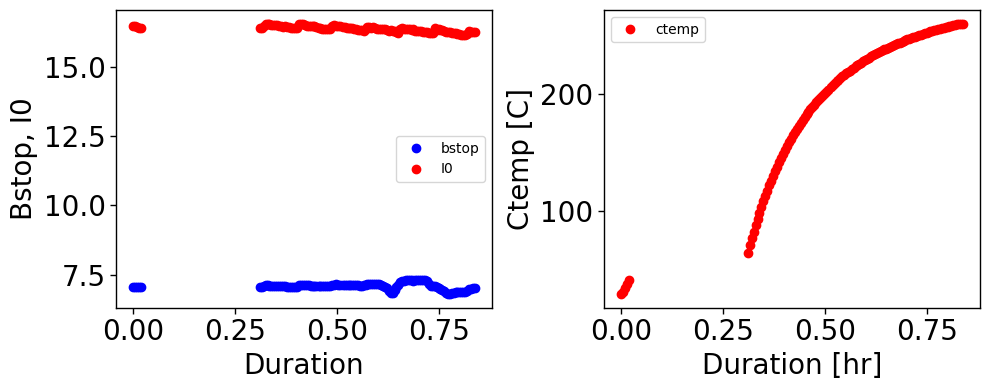

In [146]:
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import re
import warnings

# Filter warnings containing the substring "pyFAI.io"
warnings.filterwarnings("ignore", message="pyFAI.io")

# Your plotting code here...



def custom_sort(file_name):
    keywords = ['ctr', 'RampT', 'HoldT', 'Cooling', '']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
    return (keywords.index(keyword_found), ctr_value)



def process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai):
    result_dict = process_and_store_selected_parameters_columns(data_folder, keywords)
    warnings.filterwarnings('ignore')
    bstop = []
    ctemp = []
    timer = []
    i0 = []
    filename_p = []



    # Create a figure with 1 row and 2 columns
    #fig, axs = plt.subplots(figsize=(8,8))

    for keyword in keywords:
        # Create a list of file paths that match the file types and current keyword
        raw_file_pattern = f'{keyword}/SAXS/*.raw'
        #raw_file_paths = sorted(glob.glob(os.path.join(data_folder, raw_file_pattern)))
        raw_file_paths = sorted(glob.glob(os.path.join(data_folder, raw_file_pattern)), key=custom_sort)



        # read parameters
        # Call the function
        averages_dict = read_parameters(data_folder, keyword, result_dict)

        # Access the averages from the returned dictionary
        bstop_avg_all = averages_dict['bstop_avg_all']
        ctemp_avg_all = averages_dict['ctemp_avg_all']
        timer_avg_all = averages_dict['timer_avg_all']
        i0_avg_all = averages_dict['i0_avg_all']
        avg_file_name = averages_dict['avg_file_name']

        

        print(avg_file_name, raw_file_pattern, bstop_avg_all, ctemp_avg_all, timer_avg_all, i0_avg_all)

        bstop.append(bstop_avg_all[0])
        ctemp.append(ctemp_avg_all[0])
        timer.append(timer_avg_all[0])
        i0.append(i0_avg_all[0])
        filename_p.append(avg_file_name[0])  

        normfactor = bstop_avg_all[0]/i0_avg_all[0]
        normfactor = float(normfactor)
        #normfactor = 1.0
        print(normfactor)

        # Initialize the accumulators for the averaged image and pdi data
        avg_image = np.zeros((1043, 981))

        for i, raw_file_path in enumerate(raw_file_paths):
            # Read the raw file
            data = np.fromfile(raw_file_path, dtype=np.int32).reshape(1043, 981)
            avg_image += data

        avg_image /= len(raw_file_paths)

        # Assuming raw_file_paths[-1] contains the file path
        file_name, file_extension = os.path.splitext(os.path.basename(raw_file_paths[-1]))

        # Remove the last 10 characters from the file name and the ".raw" extension
        file_name = file_name[5:-11]

        q, I, error_avg = ai.integrate1d(avg_image, 1000, error_model='poisson', normalization_factor=normfactor, filename=os.path.join(SAXS_folder_name, f"{file_name}_all_SAXS.dat"))

        '''
        axs.loglog(q, I, '-', label=f"{file_name}")
        axs.set_xlabel("q (nm$^{-1}$)")
        axs.set_ylabel("Intensity (a.u.)")
        axs.set_xlim([0.05, 3])
        set_plot_style(axs,20, 'q (nm$^{-1}$)', 'Intensity (a.u.)')
        #axs.legend(fontsize=12)

        plt.tight_layout()
        '''
    #plt.show()

    # Initialize the result list with the first value as 0
    duration = [0]

    # Extracting the minimum timestamp from all the timer values
    min_timer = min(timer)
    #print(timer)

    # Subtract the minimum timestamp from each timer value and append to the result list
    for i in range(1, len(timer)):
        duration_avg = (timer[i] - min_timer) / 3600
        duration.append(duration_avg)



# Create a figure and subplots
    fig, (axs1,axs2) = plt.subplots(1,2, figsize=(10, 4))

    # Plot data on the first subplot
    axs1.plot(duration, bstop, 'o', color='b', label='bstop')
    axs1.plot(duration, i0, 'o', color='r', label='I0')
    #axs1.grid(True)
    axs1.legend()
    axs1.set_xlabel('Duration [hr]')
    axs1.set_ylabel('Bstop and I0')
    set_plot_style(axs1,20, 'Duration', 'Bstop, I0')
    

    # Plot data on the second subplot
    axs2.plot(duration, ctemp, 'o', color='r', label='ctemp')
    #axs2.grid(True)
    axs2.legend()
    axs2.set_xlabel('Duration')
    axs2.set_ylabel('Ctemp')
    set_plot_style(axs2,20, 'Duration [hr]', 'Ctemp [C]')

    # Show the plots
    plt.tight_layout()
    plt.show()


raw_dir_aceto = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Acetolysis/May2024/'
#raw_dir_meth = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/May2024/'


# Run1
common_keyword = "Run1"
keyword = "Run1*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)
"""
print("Keywords:")
for kw in keywords:
    print(f"    '{kw}',")
"""

process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
#process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# WAXS Data reduction function

In [145]:
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import re

import warnings

# Filter warnings containing the substring "pyFAI.io"
warnings.filterwarnings("ignore", message="pyFAI.io")

# Your plotting code here...
def custom_sort(file_name):
    keywords = ['ctr', 'RampT', 'HoldT', 'Cooling', '']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
    return (keywords.index(keyword_found), ctr_value)

def process_WAXS_data(SAXS_folder_name, keywords, data_folder, ai_w):
    result_dict = process_and_store_selected_parameters_columns(data_folder, keywords)
    warnings.filterwarnings('ignore')
            # Create a figure with 1 row and 2 columns
    #fig, axs = plt.subplots(figsize=(12,12))
    
    bstop = []
    ctemp = []
    timer = []
    i0 = []
    filename_p = []


    for keyword in keywords:
        # Create a list of file paths that match the file types and current keyword
        raw_file_pattern = f'{keyword}/WAXS/*.raw'
        #raw_file_paths = sorted(glob.glob(os.path.join(data_folder, raw_file_pattern)))
        raw_file_paths = sorted(glob.glob(os.path.join(data_folder, raw_file_pattern)), key=custom_sort)


# Call the function

        averages_dict = read_parameters(data_folder, keyword, result_dict)

        # Access the averages from the returned dictionary
        bstop_avg_all = averages_dict['bstop_avg_all']
        ctemp_avg_all = averages_dict['ctemp_avg_all']
        timer_avg_all = averages_dict['timer_avg_all']
        i0_avg_all = averages_dict['i0_avg_all']
        avg_file_name = averages_dict['avg_file_name']

        

        print(avg_file_name, raw_file_pattern, bstop_avg_all, ctemp_avg_all, timer_avg_all, i0_avg_all)

        bstop.append(bstop_avg_all[0])
        ctemp.append(ctemp_avg_all[0])
        timer.append(timer_avg_all[0])
        i0.append(i0_avg_all[0])
        filename_p.append(avg_file_name[0])  

        normfactor = bstop_avg_all[0]/i0_avg_all[0]
        normfactor = float(normfactor)
        #normfactor = 1.0
        print(normfactor)






        # Initialize the accumulators for the averaged image and pdi data
        avg_image = np.zeros((195, 487))

        for i, raw_file_path in enumerate(raw_file_paths):
            # Read the raw file
            data = np.fromfile(raw_file_path, dtype=np.int32).reshape(195, 487)
            avg_image += data

            file_name = os.path.splitext(os.path.basename(raw_file_path))[0]



        avg_image /= len(raw_file_paths)

        # Assuming raw_file_paths[-1] contains the file path
        file_name, file_extension = os.path.splitext(os.path.basename(raw_file_paths[-1]))

        # Remove the last 10 characters from the file name and the ".raw" extension
        file_name = file_name[10:-11]
        file_extension = ""


        q, I, error_avg = ai_w.integrate1d(avg_image, 1000,error_model='poisson', normalization_factor=normfactor,filename=os.path.join(WAXS_folder_name, f"{file_name}_all_WAXS.dat"))
   
        '''
        axs.plot(q, I, '-', label=f"{file_name}")
        axs.set_xlabel("q (nm$^{-1}$)")
        axs.set_ylabel("Intensity (a.u.)")
        set_plot_style(axs,20, 'q (nm$^{-1}$)', 'Intensity (a.u.)')
        #axs.set_xlim([0.05, 3])
        #axs.legend(fontsize=12)

        plt.tight_layout()
        '''
    #plt.show()


    # Initialize the result list with the first value as 0
    duration = [0]

    # Extracting the minimum timestamp from all the timer values
    min_timer = min(timer)
    print(timer)

    # Subtract the minimum timestamp from each timer value and append to the result list
    for i in range(1, len(timer)):
        duration_avg = (timer[i] - min_timer) / 3600
        duration.append(duration_avg)



# Create a figure and subplots
    fig, (axs1,axs2) = plt.subplots(1,2, figsize=(10, 4))

    # Plot data on the first subplot
    axs1.plot(duration, bstop, 'o', color='b', label='bstop')
    axs1.plot(duration, i0, 'o', color='r', label='I0')
    #axs1.grid(True)
    axs1.legend()
    axs1.set_xlabel('Duration [hr]')
    axs1.set_ylabel('Bstop and I0')
    set_plot_style(axs1,20, 'Duration', 'Bstop, I0')
    

    # Plot data on the second subplot
    axs2.plot(duration, ctemp, 'o', color='r', label='ctemp')
    #axs2.grid(True)
    axs2.legend()
    axs2.set_xlabel('Duration')
    axs2.set_ylabel('Ctemp')
    set_plot_style(axs2,20, 'Duration [hr]', 'Ctemp [C]')

    # Show the plots
    plt.tight_layout()
    plt.show()




# Ploting function

In [134]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import numpy as np
import matplotlib.pyplot as plt

def darken_colors(num_colors, darker_factor=0.7):
    """
    Darken a set of colors by reducing the value component in the HSV color space.

    Parameters:
    - num_colors (int): Number of colors to generate.
    - darker_factor (float): Factor to control the darkness of the colors. Default is 0.7.

    Returns:
    - darker_colors (numpy.ndarray): Darkened colors in RGB format.
    """
    colors = plt.cm.jet(np.linspace(0, 1, num_colors))

    # Make the colors darker by reducing the value component
    darker_colors = colors.copy()

    for i in range(num_colors):
        rgb = darker_colors[i, :3]  # Extract the RGB values
        hsv = plt.cm.colors.rgb_to_hsv(rgb)  # Convert RGB to HSV
        hsv[2] *= darker_factor  # Reduce the value component
        darker_colors[i, :3] = plt.cm.colors.hsv_to_rgb(hsv)  # Convert back to RGB

    return darker_colors

def read_data_files(folder_path, keywords):
    data_list = []
    m_key = 0  # Initialize m_key to 0
    m_keys = []  # Create a list to store m_key for each file
    legend = []  # Create a list to store legends

    def sort_key(filename):
        ctr_index = filename.find("ctr")
        if ctr_index != -1:
            numeric_part = filename[ctr_index + 3:]
            numeric_part = numeric_part.split('_')[0]  # Extract numeric part before the next underscore
            try:
                return int(numeric_part)
            except ValueError:
                return float('inf')
        else:
            return float('inf')

    for keyword in keywords:
        files = glob.glob(os.path.join(folder_path, f"*{keyword}*.dat"))
        files = sorted(files, key=lambda x: (sort_key(x), x))

        for file in files:
            try:
                with open(file, 'r') as f:
                    lines = f.readlines()

                start_index = None
                for i, line in enumerate(lines):
                    if line.strip().startswith("#"):
                        continue
                    else:
                        start_index = i
                        break

                if start_index is not None:
                    df = pd.read_csv(file, delim_whitespace=True, skiprows=start_index, header=None,
                                     names=["q_nm^-1", "I", 'sigma', ])
                    df["File"] = file
                    if not df.empty:
                        data_list.append(df)

                        # Extract temperature from the filename
                        # temperature = file.split('_T')[1].split('_')[0]

                        # Print only the file name (without path) just before plotting
                        file_name = os.path.basename(file)
                        #print(f" {file_name}")

                        # Check if temperature is present in the filename

                        legend.append(file_name)

                        m_keys.append(m_key)  # Append m_key for this file to the list
            except Exception as e:
                print(f"Error reading file {file}: {str(e)}")
            m_key += 1  # Increment m_key for each file
        m_key += 1  # Increment m_key by 2 when switching keywords

    # After the loop, concatenate the DataFrames
    data = pd.concat(data_list, ignore_index=True)

    # print(legend)
    return data, m_keys, legend



import matplotlib.pyplot as plt

def create_saxs_waxs_plot(folder_path_saxs, folder_path_waxs, keywords, m_keys, data_saxs, data_waxs, legend_saxs, legend_waxs):
    # Create a 1x2 grid of subplots
    fig = plt.figure(figsize=(10, 8))
    fonts = 14
    
    num_colors = max(m_keys) + 1  # Calculate the number of colors based on the maximum m_key
    darker_colors = darken_colors(num_colors, darker_factor=0.7)
    
    print(keywords)
    
    # SAXS plot
    plt.subplot(1, 2, 1)
    plt.title('SAXS',fontsize=fonts)
    for i, file in enumerate(data_saxs["File"].unique()):
        subset = data_saxs[data_saxs["File"] == file]
        qmin, qmax = 0, 2.5
        subset = subset[(subset["q_nm^-1"] >= qmin) & (subset["q_nm^-1"] <= qmax)]
        
        # Check if any data points are present before plotting
        if not subset.empty:
            plt.loglog(subset["q_nm^-1"], subset["I"] * (1.5 ** m_keys[i]), marker='o', markersize=0.5, color=darker_colors[m_keys[i]],label=legend_saxs[i] if legend_saxs is not None else None)

    plt.xlim(0.07, 2)
    plt.xlabel('q [$\\mathrm{nm^{-1}}$]', fontsize=fonts)
    plt.ylabel("Intensity [a.u.]", fontsize=fonts)
    plt.xticks(fontsize=fonts)  # Set x-axis tick to 20
    plt.yticks(fontsize=fonts)  # Set y-axis tick to 20
    
    plt.gca().set_facecolor('white')
    plt.gca().spines['top'].set_linewidth(1)
    plt.gca().spines['right'].set_linewidth(1)
    plt.gca().spines['bottom'].set_linewidth(1)
    plt.gca().spines['left'].set_linewidth(1)
    plt.tick_params(axis='both', which='both', direction='out', length=4, width=1)

    #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10, frameon=False)

    # WAXS plot
    plt.subplot(1, 2, 2)
    plt.title('WAXS',fontsize=fonts)
    for i, file in enumerate(data_waxs["File"].unique()):
        subset = data_waxs[data_waxs["File"] == file]
        
        qmin, qmax = 10, 35
        subset = subset[(subset["q_nm^-1"] >= qmin) & (subset["q_nm^-1"] <= qmax)]
        
        
        plt.plot(subset["q_nm^-1"], subset["I"] + (10* m_keys[i]), marker='o', markersize=0.5,color=darker_colors[m_keys[i]], label=legend_waxs[i].replace('_all_WAXS.dat', '') if legend_waxs is not None else None)

    plt.xlim(10, 25)
    plt.xlabel('q [$\\mathrm{nm^{-1}}$]', fontsize=fonts)
    plt.ylabel("Intensity [a.u.]", fontsize=fonts)
    plt.xticks(fontsize=fonts)  # Set x-axis tick to 20
    plt.yticks(fontsize=fonts)  # Set y-axis tick to 20
    plt.gca().set_facecolor('white')
    plt.gca().spines['top'].set_linewidth(1)
    plt.gca().spines['right'].set_linewidth(1)
    plt.gca().spines['bottom'].set_linewidth(1)
    plt.gca().spines['left'].set_linewidth(1)
    plt.tick_params(axis='both', which='both', direction='out', length=4, width=1)

    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize=6, frameon=False)

    # Adjust layout and show the plot
    plt.tight_layout()
    
    
    
    ###################### save figure
    # Use the first 30 characters of the first keyword as the figure name
    figure_name = keywords[0][:30].replace('*', '')
    
    
    # Save the figure to the specified folder path with the given name
    #plt.savefig(f"{folder_path}/{figure_name}.png", dpi=300)
    
    
    # Create the "Figure" folder if it doesn't exist
    #figure_folder = os.path.join(folder_path_saxs, 'Figure_SAXS_WAXS')
    #os.makedirs(figure_folder, exist_ok=True)
    figure_folder = os.path.join(os.path.dirname(folder_path_saxs), 'Figure_saxs_waxs_Reduced')
    os.makedirs(figure_folder, exist_ok=True)


    # Save the figure in the specified folder
    figure_path = os.path.join(figure_folder, f'{figure_name}_SAXS_WAXS.png')
    plt.savefig(figure_path, dpi=300)

    ###################
    plt.show()
    
    
def plot_saxs_waxs_data(all_keywords, Run_number):
    #folder_path_saxs_base = r'X:\bl1-5\Anjani\Acetolysis\May2024\OneD_integrated_SAXS_01\Reduction\Run{}'.format(Run_number)
    #folder_path_waxs_base = r'X:\bl1-5\Anjani\Acetolysis\May2024\OneD_integrated_WAXS_01\Reduction\Run{}'.format(Run_number)
    folder_path_saxs_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Acetolysis/May2024/OneD_integrated_SAXS_01/Reduction/Run{}'.format(Run_number)
    folder_path_waxs_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Acetolysis/May2024//OneD_integrated_WAXS_01/Reduction/Run{}'.format(Run_number)

    for keywords in all_keywords:
        # Read SAXS data
        result_data_saxs, m_keys_saxs, legend_saxs = read_data_files(folder_path_saxs_base, keywords)

        # Read WAXS data
        result_data_waxs, m_keys_waxs, legend_waxs = read_data_files(folder_path_waxs_base, keywords)

        # Create SAXS-WAXS combined plot
        create_saxs_waxs_plot(
            folder_path_saxs_base,
            folder_path_waxs_base,
            keywords,
            m_keys_saxs,
            result_data_saxs,
            result_data_waxs,
            legend_saxs,
            legend_waxs,
        )
        
        

        
def plot_saxs_waxs_data_meth(all_keywords, Run_number):
    #folder_path_saxs_base = r'X:\bl1-5\Anjani\Methanolysis\May2024\OneD_integrated_SAXS_01\Reduction\Run{}'.format(Run_number)
    #folder_path_waxs_base = r'X:\bl1-5\Anjani\Methanolysis\May2024\OneD_integrated_WAXS_01\Reduction\Run{}'.format(Run_number)
    folder_path_saxs_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/May2024/OneD_integrated_SAXS_01/Reduction/Run{}'.format(Run_number)
    folder_path_waxs_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/May2024//OneD_integrated_WAXS_01/Reduction/Run{}'.format(Run_number)

    for keywords in all_keywords:
        # Read SAXS data
        result_data_saxs, m_keys_saxs, legend_saxs = read_data_files(folder_path_saxs_base, keywords)

        # Read WAXS data
        result_data_waxs, m_keys_waxs, legend_waxs = read_data_files(folder_path_waxs_base, keywords)

        # Create SAXS-WAXS combined plot
        create_saxs_waxs_plot(
            folder_path_saxs_base,
            folder_path_waxs_base,
            keywords,
            m_keys_saxs,
            result_data_saxs,
            result_data_waxs,
            legend_saxs,
            legend_waxs,
        )
# https://pubs.rsc.org/en/content/articlelanding/2021/gc/d0gc03536j

# Data Reduction

## Acetolysis 

Subfolder 'Run15' already exists within the base folder. Doing nothing.
Subfolder 'Run15' already exists within the base folder. Doing nothing.


['Run15_AcOH_HoldT140_ctr0_scan1'] Run15_AcOH_HoldT140_ctr0/SAXS/*.raw [5.86021] [139.1299] [200184.26] [16.4488]
0.3562697582802393
['test_Run15_AcOH_RampT30_ctr0_scan1'] Run15_AcOH_RampT30_ctr0/SAXS/*.raw [5.6496675] [32.5561705] [197536.89500000002] [16.519235000000002]
0.3420053955283038
['Run15_Nylon6_AcOH_HoldT140_ctr0_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr0/SAXS/*.raw [5.73334] [141.88651] [200161.51] [16.35399]
0.35057744318053274
['test_Run15_Nylon6_AcOH_RampT30_ctr0_scan1'] Run15_Nylon6_AcOH_RampT30_ctr0/SAXS/*.raw [5.64834] [32.56781675] [197514.47749999998] [16.5380525]
0.3415359819422511
['Run15_Nylon6_HoldT140_ctr0_scan1'] Run15_Nylon6_HoldT140_ctr0/SAXS/*.raw [5.81019] [142.23289] [200207.07] [16.53371]
0.3514147762359447
['test_Run15_Nylon6_RampT30_ctr0_scan1'] Run15_Nylon6_RampT30_ctr0/SAXS/*.raw [5.7937125] [32.28643025] [197559.15749999997] [16.4889625]
0.3513691355656852
['Run15_AcOH_HoldT140_ctr1_scan1'] Run15_AcOH_HoldT140_ctr1/SAXS/*.raw [5.86446] [139.31419] [20

['Run15_Nylon6_RampT35_ctr1_scan1'] Run15_Nylon6_RampT35_ctr1/SAXS/*.raw [5.78414] [40.46143] [197973.11] [16.468]
0.35123512266213264
['Run15_AcOH_HoldT140_ctr2_scan1'] Run15_AcOH_HoldT140_ctr2/SAXS/*.raw [5.85201] [140.06911] [200332.67] [16.43118]
0.3561527534845336
['Run15_AcOH_RampT40_ctr2_scan1'] Run15_AcOH_RampT40_ctr2/SAXS/*.raw [5.64279] [41.900879] [198025.69] [16.45686]
0.3428837578979222
['Run15_Nylon6_AcOH_HoldT140_ctr2_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr2/SAXS/*.raw [5.76994] [140.40961] [200310.02] [16.47456]
0.35023332944855584
['Run15_Nylon6_AcOH_RampT40_ctr2_scan1'] Run15_Nylon6_AcOH_RampT40_ctr2/SAXS/*.raw [5.6308] [40.11581] [198003.11] [16.44784]
0.34234282434654034
['Run15_Nylon6_HoldT140_ctr2_scan1'] Run15_Nylon6_HoldT140_ctr2/SAXS/*.raw [5.78603] [142.9454] [200355.49] [16.42574]
0.35225384061844395
['Run15_Nylon6_RampT40_ctr2_scan1'] Run15_Nylon6_RampT40_ctr2/SAXS/*.raw [5.76341] [41.98053] [198048.55] [16.43064]
0.35077209408763144
['Run15_AcOH_HoldT140_ctr

['Run15_AcOH_RampT45_ctr3_scan1'] Run15_AcOH_RampT45_ctr3/SAXS/*.raw [5.70605] [50.373379] [198128.87] [16.55333]
0.3447070770654606
['Run15_Nylon6_AcOH_HoldT140_ctr3_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr3/SAXS/*.raw [5.74692] [139.6855] [200384.26] [16.40135]
0.35039310788441197
['Run15_Nylon6_AcOH_RampT45_ctr3_scan1'] Run15_Nylon6_AcOH_RampT45_ctr3/SAXS/*.raw [5.68248] [50.578701] [198106.21] [16.58937]
0.3425374200466926
['Run15_Nylon6_HoldT140_ctr3_scan1'] Run15_Nylon6_HoldT140_ctr3/SAXS/*.raw [5.77942] [142.7244] [200429.6] [16.35215]
0.3534348694208406
['Run15_Nylon6_RampT45_ctr3_scan1'] Run15_Nylon6_RampT45_ctr3/SAXS/*.raw [5.80216] [49.365479] [198151.64] [16.55189]
0.3505436539271346
['Run15_AcOH_HoldT140_ctr4_scan1'] Run15_AcOH_HoldT140_ctr4/SAXS/*.raw [5.83395] [142.10609] [200481.06] [16.36582]
0.3564715975123764
['Run15_AcOH_RampT50_ctr4_scan1'] Run15_AcOH_RampT50_ctr4/SAXS/*.raw [5.689] [55.03064] [198226.77] [16.48647]
0.34507083687411555
['Run15_Nylon6_AcOH_HoldT140_ct

['Run15_Nylon6_RampT50_ctr4_scan1'] Run15_Nylon6_RampT50_ctr4/SAXS/*.raw [5.7861] [53.933319] [198249.48] [16.48439]
0.35100479908568044
['Run15_AcOH_HoldT140_ctr5_scan1'] Run15_AcOH_HoldT140_ctr5/SAXS/*.raw [5.85914] [142.71671] [200555.13] [16.46532]
0.35584732030716687
['Run15_AcOH_RampT55_ctr5_scan1'] Run15_AcOH_RampT55_ctr5/SAXS/*.raw [5.67918] [59.733891] [198326.97] [16.45823]
0.345066267757833
['Run15_Nylon6_AcOH_HoldT140_ctr5_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr5/SAXS/*.raw [5.77381] [139.21989] [200532.58] [16.47707]
0.3504148492420072
['Run15_Nylon6_AcOH_RampT55_ctr5_scan1'] Run15_Nylon6_AcOH_RampT55_ctr5/SAXS/*.raw [5.65158] [60.142361] [198304.38] [16.46008]
0.34335070060412826
['Run15_Nylon6_HoldT140_ctr5_scan1'] Run15_Nylon6_HoldT140_ctr5/SAXS/*.raw [5.80655] [141.7565] [200578.09] [16.48363]
0.35226160742506346
['Run15_Nylon6_RampT55_ctr5_scan1'] Run15_Nylon6_RampT55_ctr5/SAXS/*.raw [5.76272] [58.4473] [198349.58] [16.42669]
0.3508144367489737
['Run15_AcOH_HoldT140_ct

['Run15_Nylon6_HoldT140_ctr6_scan1'] Run15_Nylon6_HoldT140_ctr6/SAXS/*.raw [5.78003] [141.1368] [200652.2] [16.3928]
0.35259565174954854
['Run15_Nylon6_RampT60_ctr6_scan1'] Run15_Nylon6_RampT60_ctr6/SAXS/*.raw [5.79945] [62.977051] [198451.68] [16.54825]
0.35045699696342514
['Run15_AcOH_HoldT140_ctr7_scan1'] Run15_AcOH_HoldT140_ctr7/SAXS/*.raw [5.84444] [142.99181] [200703.37] [16.39046]
0.35657571538565724
['Run15_AcOH_RampT65_ctr7_scan1'] Run15_AcOH_RampT65_ctr7/SAXS/*.raw [5.71556] [69.070618] [198532.96] [16.48278]
0.3467594665462986
['Run15_Nylon6_AcOH_HoldT140_ctr7_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr7/SAXS/*.raw [5.74642] [140.3849] [200680.77] [16.38546]
0.3507023910222844
['Run15_Nylon6_AcOH_RampT65_ctr7_scan1'] Run15_Nylon6_AcOH_RampT65_ctr7/SAXS/*.raw [5.67816] [69.911903] [198510.36] [16.52015]
0.3437111648501981
['Run15_Nylon6_HoldT140_ctr7_scan1'] Run15_Nylon6_HoldT140_ctr7/SAXS/*.raw [5.78011] [140.53169] [200726.19] [16.37202]
0.35304806615188594
['Run15_Nylon6_RampT6

['Run15_Nylon6_AcOH_RampT70_ctr8_scan1'] Run15_Nylon6_AcOH_RampT70_ctr8/SAXS/*.raw [5.66904] [74.73938] [198616.37] [16.44959]
0.34463108199049336
['Run15_Nylon6_HoldT140_ctr8_scan1'] Run15_Nylon6_HoldT140_ctr8/SAXS/*.raw [5.81642] [139.95979] [200800.07] [16.51291]
0.3522347060572606
['Run15_Nylon6_RampT70_ctr8_scan1'] Run15_Nylon6_RampT70_ctr8/SAXS/*.raw [5.76336] [71.923309] [198661.67] [16.42167]
0.3509606513832028
['Run15_AcOH_HoldT140_ctr9_scan1'] Run15_AcOH_HoldT140_ctr9/SAXS/*.raw [5.87391] [142.47321] [200851.39] [16.45878]
0.3568861118503316
['Run15_AcOH_RampT75_ctr9_scan1'] Run15_AcOH_RampT75_ctr9/SAXS/*.raw [5.74785] [78.288673] [198747.26] [16.55083]
0.3472846981087957
['Run15_Nylon6_AcOH_HoldT140_ctr9_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr9/SAXS/*.raw [5.78499] [142.03571] [200828.76] [16.47749]
0.35108441880407754
['Run15_Nylon6_AcOH_RampT75_ctr9_scan1'] Run15_Nylon6_AcOH_RampT75_ctr9/SAXS/*.raw [5.70963] [79.557831] [198724.16] [16.54505]
0.3450959652584912
['Run15_Nylo

['Run15_Nylon6_AcOH_HoldT140_ctr10_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr10/SAXS/*.raw [5.7749] [142.63251] [200903.06] [16.43953]
0.3512813322521994
['Run15_Nylon6_AcOH_RampT80_ctr10_scan1'] Run15_Nylon6_AcOH_RampT80_ctr10/SAXS/*.raw [5.69592] [84.339203] [198834.99] [16.47286]
0.34577602189298035
['Run15_Nylon6_HoldT140_ctr10_scan1'] Run15_Nylon6_HoldT140_ctr10/SAXS/*.raw [5.78002] [139.23579] [200948.64] [16.40728]
0.3522838642358758
['Run15_Nylon6_RampT80_ctr10_scan1'] Run15_Nylon6_RampT80_ctr10/SAXS/*.raw [5.77489] [80.76358] [198880.35] [16.45933]
0.3508581455016698
['Run15_AcOH_HoldT140_ctr11_scan1'] Run15_AcOH_HoldT140_ctr11/SAXS/*.raw [5.8404] [141.5289] [200998.96] [16.36577]
0.3568668018675564
['Run15_AcOH_RampT85_ctr11_scan1'] Run15_AcOH_RampT85_ctr11/SAXS/*.raw [5.73192] [87.507782] [198967.92] [16.39003]
0.3497199211959954
['Run15_Nylon6_AcOH_HoldT140_ctr11_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr11/SAXS/*.raw [5.76797] [142.9671] [200977.28] [16.36761]
0.3524014807293185
[

['Run15_AcOH_HoldT140_ctr12_scan1'] Run15_AcOH_HoldT140_ctr12/SAXS/*.raw [5.82676] [141.1819] [201072.75] [16.32732]
0.3568717952486997
['Run15_AcOH_RampT90_ctr12_scan1'] Run15_AcOH_RampT90_ctr12/SAXS/*.raw [5.76297] [92.157013] [199074.54] [16.54123]
0.3484003305679203
['Run15_Nylon6_AcOH_HoldT140_ctr12_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr12/SAXS/*.raw [5.75141] [143.06219] [201050.14] [16.31645]
0.35249150397298434
['Run15_Nylon6_AcOH_RampT90_ctr12_scan1'] Run15_Nylon6_AcOH_RampT90_ctr12/SAXS/*.raw [5.72824] [93.92868] [199051.95] [16.53661]
0.34639747808045307
['Run15_Nylon6_HoldT140_ctr12_scan1'] Run15_Nylon6_HoldT140_ctr12/SAXS/*.raw [5.83546] [139.49969] [201095.72] [16.49093]
0.353858757510947
['Run15_Nylon6_RampT90_ctr12_scan1'] Run15_Nylon6_RampT90_ctr12/SAXS/*.raw [5.7952] [89.82605] [199096.52] [16.51238]
0.35096091538591045
['Run15_AcOH_HoldT140_ctr13_scan1'] Run15_AcOH_HoldT140_ctr13/SAXS/*.raw [5.88296] [140.70641] [201145.69] [16.44009]
0.35784232324762205
['Run15_AcOH

['Run15_Nylon6_RampT95_ctr13_scan1'] Run15_Nylon6_RampT95_ctr13/SAXS/*.raw [5.77246] [94.597198] [199200.02] [16.42315]
0.35148311986433783
['Run15_AcOH_HoldT140_ctr14_scan1'] Run15_AcOH_HoldT140_ctr14/SAXS/*.raw [5.85606] [140.37309] [201219.54] [16.39742]
0.3571330123885343
['Run15_AcOH_RampT100_ctr14_scan1'] Run15_AcOH_RampT100_ctr14/SAXS/*.raw [5.75285] [101.3598] [199275.01] [16.36654]
0.3515006837120124
['Run15_Nylon6_AcOH_HoldT140_ctr14_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr14/SAXS/*.raw [5.77177] [142.9758] [201196.87] [16.41448]
0.3516267344442224
['Run15_Nylon6_AcOH_RampT100_ctr14_scan1'] Run15_Nylon6_AcOH_RampT100_ctr14/SAXS/*.raw [5.68933] [103.4948] [199252.42] [16.39402]
0.34703690736012277
['Run15_Nylon6_HoldT140_ctr14_scan1'] Run15_Nylon6_HoldT140_ctr14/SAXS/*.raw [5.8049] [140.3166] [201241.26] [16.37627]
0.35447021818765806
['Run15_Nylon6_RampT100_ctr14_scan1'] Run15_Nylon6_RampT100_ctr14/SAXS/*.raw [5.81228] [99.678558] [199297.61] [16.58489]
0.350456349122605
['Run1

['Run15_Nylon6_AcOH_HoldT140_ctr15_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr15/SAXS/*.raw [5.76059] [142.8147] [201269.04] [16.3633]
0.35204329200100226
['Run15_Nylon6_AcOH_RampT105_ctr15_scan1'] Run15_Nylon6_AcOH_RampT105_ctr15/SAXS/*.raw [5.74207] [108.0825] [199347.69] [16.52252]
0.34752991674393496
['Run15_Nylon6_CoolingT65_ctr15_scan1'] Run15_Nylon6_CoolingT65_ctr15/SAXS/*.raw [5.81288] [66.604057] [203899.33] [16.38182]
0.35483725251528825
['Run15_Nylon6_HoldT140_ctr15_scan1'] Run15_Nylon6_HoldT140_ctr15/SAXS/*.raw [5.77813] [140.6696] [201314.43] [16.34012]
0.35361613011409954
['Run15_Nylon6_RampT105_ctr15_scan1'] Run15_Nylon6_RampT105_ctr15/SAXS/*.raw [5.7994] [105.0154] [199392.03] [16.5012]
0.3514532276440501
['Run15_AcOH_CoolingT60_ctr16_scan1'] Run15_AcOH_CoolingT60_ctr16/SAXS/*.raw [5.72172] [62.010929] [204145.65] [16.43643]
0.3481120900341497
['Run15_AcOH_HoldT140_ctr16_scan1'] Run15_AcOH_HoldT140_ctr16/SAXS/*.raw [5.83007] [139.69859] [201365.63] [16.28417]
0.3580207035421

['Run15_Nylon6_HoldT140_ctr16_scan1'] Run15_Nylon6_HoldT140_ctr16/SAXS/*.raw [5.81196] [141.4426] [201388.79] [16.43614]
0.3536085723290261
['Run15_Nylon6_RampT110_ctr16_scan1'] Run15_Nylon6_RampT110_ctr16/SAXS/*.raw [5.77228] [113.3277] [199491.81] [16.44792]
0.3509428547804221
['Run15_AcOH_CoolingT55_ctr17_scan1'] Run15_AcOH_CoolingT55_ctr17/SAXS/*.raw [5.70733] [56.780731] [204435.15] [16.41644]
0.34765941946000467
['Run15_AcOH_HoldT140_ctr17_scan1'] Run15_AcOH_HoldT140_ctr17/SAXS/*.raw [5.86894] [139.4106] [201439.18] [16.42117]
0.3574008429362829
['Run15_AcOH_RampT115_ctr17_scan1'] Run15_AcOH_RampT115_ctr17/SAXS/*.raw [5.7751] [115.787] [199577.01] [16.37988]
0.3525727905210539
['Run15_Nylon6_AcOH_CoolingT55_ctr17_scan1'] Run15_Nylon6_AcOH_CoolingT55_ctr17/SAXS/*.raw [5.6903] [56.179169] [204412.58] [16.44909]
0.3459340303931706
['Run15_Nylon6_AcOH_HoldT140_ctr17_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr17/SAXS/*.raw [5.78204] [142.2502] [201416.59] [16.45305]
0.3514266351831423
['Ru

['Run15_Nylon6_HoldT140_ctr17_scan1'] Run15_Nylon6_HoldT140_ctr17/SAXS/*.raw [5.81165] [141.8922] [201460.92] [16.40262]
0.3543122988888361
['Run15_Nylon6_RampT115_ctr17_scan1'] Run15_Nylon6_RampT115_ctr17/SAXS/*.raw [5.80601] [115.0904] [199599.73] [16.53488]
0.3511371113670011
['Run15_AcOH_CoolingT50_ctr18_scan1'] Run15_AcOH_CoolingT50_ctr18/SAXS/*.raw [5.68997] [51.496368] [204758.31] [16.39519]
0.3470511778149567
['Run15_AcOH_HoldT140_ctr18_scan1'] Run15_AcOH_HoldT140_ctr18/SAXS/*.raw [5.85729] [139.2885] [201511.37] [16.39548]
0.35725029093384275
['Run15_AcOH_RampT120_ctr18_scan1'] Run15_AcOH_RampT120_ctr18/SAXS/*.raw [5.82404] [121.0684] [199681.25] [16.4898]
0.353190457131075
['Run15_Nylon6_AcOH_CoolingT50_ctr18_scan1'] Run15_Nylon6_AcOH_CoolingT50_ctr18/SAXS/*.raw [5.6707] [50.919891] [204735.74] [16.43537]
0.3450302609554881
['Run15_Nylon6_AcOH_HoldT140_ctr18_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr18/SAXS/*.raw [5.77567] [142.106] [201489.55] [16.39143]
0.35235912913028333
['Ru

['Run15_AcOH_CoolingT45_ctr19_scan1'] Run15_AcOH_CoolingT45_ctr19/SAXS/*.raw [5.67706] [46.15033] [205132.21] [16.40443]
0.34606871436557074
['Run15_AcOH_HoldT140_ctr19_scan1'] Run15_AcOH_HoldT140_ctr19/SAXS/*.raw [5.83837] [139.25281] [201583.16] [16.3447]
0.35720264061132967
['Run15_AcOH_RampT125_ctr19_scan1'] Run15_AcOH_RampT125_ctr19/SAXS/*.raw [5.80992] [124.9633] [199791.63] [16.41732]
0.3538896726140442
['Run15_Nylon6_AcOH_CoolingT45_ctr19_scan1'] Run15_Nylon6_AcOH_CoolingT45_ctr19/SAXS/*.raw [5.66267] [45.743561] [205109.54] [16.39954]
0.34529444118554553
['Run15_Nylon6_AcOH_HoldT140_ctr19_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr19/SAXS/*.raw [5.75091] [141.9648] [201561.49] [16.34233]
0.35190269686146347
['Run15_Nylon6_AcOH_RampT125_ctr19_scan1'] Run15_Nylon6_AcOH_RampT125_ctr19/SAXS/*.raw [5.72595] [127.756] [199769.01] [16.42356]
0.3486424380584965
['Run15_Nylon6_CoolingT45_ctr19_scan1'] Run15_Nylon6_CoolingT45_ctr19/SAXS/*.raw [5.78838] [45.811771] [205156.44] [16.38025]
0.35

['Run15_AcOH_RampT130_ctr20_scan1'] Run15_AcOH_RampT130_ctr20/SAXS/*.raw [5.85906] [129.85899] [199898.33] [16.52005]
0.35466357547343985
['Run15_Nylon6_AcOH_CoolingT40_ctr20_scan1'] Run15_Nylon6_AcOH_CoolingT40_ctr20/SAXS/*.raw [5.62203] [40.549412] [205566.88] [16.32645]
0.34435103773324877
['Run15_Nylon6_AcOH_HoldT140_ctr20_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr20/SAXS/*.raw [5.74468] [141.8326] [201632.41] [16.31296]
0.35215436070461764
['Run15_Nylon6_AcOH_RampT130_ctr20_scan1'] Run15_Nylon6_AcOH_RampT130_ctr20/SAXS/*.raw [5.7236] [132.58701] [199875.69] [16.36243]
0.3498013436879486
['Run15_Nylon6_CoolingT40_ctr20_scan1'] Run15_Nylon6_CoolingT40_ctr20/SAXS/*.raw [5.8217] [40.611721] [205612.17] [16.49016]
0.35304084375166767
['Run15_Nylon6_HoldT140_ctr20_scan1'] Run15_Nylon6_HoldT140_ctr20/SAXS/*.raw [5.76753] [142.47009] [201677.67] [16.25297]
0.35486006557570704
['Run15_Nylon6_RampT130_ctr20_scan1'] Run15_Nylon6_RampT130_ctr20/SAXS/*.raw [5.80279] [130.95531] [199920.95] [16.533

['Run15_Nylon6_HoldT140_ctr21_scan1'] Run15_Nylon6_HoldT140_ctr21/SAXS/*.raw [5.81206] [142.7184] [201749.56] [16.38996]
0.3546109935594718
['Run15_Nylon6_RampT135_ctr21_scan1'] Run15_Nylon6_RampT135_ctr21/SAXS/*.raw [5.78964] [136.35381] [200027.97] [16.46394]
0.35165580049489975
['Run15_AcOH_HoldT140_ctr22_scan1'] Run15_AcOH_HoldT140_ctr22/SAXS/*.raw [5.86314] [139.312] [201798.88] [16.35443]
0.3585046987268892
['Run15_AcOH_RampT140_ctr22_scan1'] Run15_AcOH_RampT140_ctr22/SAXS/*.raw [5.850075] [140.829005] [201296.49] [16.336129999999997]
0.3581065405331619
['Run15_Nylon6_AcOH_HoldT140_ctr22_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr22/SAXS/*.raw [5.77791] [141.4407] [201777.1] [16.39028]
0.35252051825838243
['Run15_Nylon6_AcOH_RampT140_ctr22_scan1'] Run15_Nylon6_AcOH_RampT140_ctr22/SAXS/*.raw [5.76371] [142.50215] [201274.175] [16.3691]
0.35210915688706157
['Run15_Nylon6_HoldT140_ctr22_scan1'] Run15_Nylon6_HoldT140_ctr22/SAXS/*.raw [5.8046] [142.7533] [201821.52] [16.34868]
0.3550500713

['Run15_Nylon6_AcOH_HoldT140_ctr23_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr23/SAXS/*.raw [5.76099] [141.2832] [201849.99] [16.32926]
0.3528016578828434
['Run15_Nylon6_HoldT140_ctr23_scan1'] Run15_Nylon6_HoldT140_ctr23/SAXS/*.raw [5.78065] [142.9843] [201895.26] [16.3083]
0.3544606120809649
['Run15_AcOH_HoldT140_ctr24_scan1'] Run15_AcOH_HoldT140_ctr24/SAXS/*.raw [5.82868] [139.6593] [201945.48] [16.2703]
0.35824047497587636
['Run15_Nylon6_AcOH_HoldT140_ctr24_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr24/SAXS/*.raw [5.74502] [140.88969] [201922.85] [16.27788]
0.3529341658741802
['Run15_Nylon6_HoldT140_ctr24_scan1'] Run15_Nylon6_HoldT140_ctr24/SAXS/*.raw [5.77001] [143.0802] [201968.06] [16.25611]
0.3549440794876511
['Run15_AcOH_HoldT140_ctr25_scan1'] Run15_AcOH_HoldT140_ctr25/SAXS/*.raw [5.86211] [140.09579] [202018.53] [16.40823]
0.357266444948663
['Run15_Nylon6_AcOH_HoldT140_ctr25_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr25/SAXS/*.raw [5.79015] [140.6021] [201996.72] [16.42041]
0.352619088073927

['Run15_AcOH_HoldT140_ctr27_scan1'] Run15_AcOH_HoldT140_ctr27/SAXS/*.raw [5.85435] [140.8259] [202164.29] [16.30336]
0.35908855597864486
['Run15_Nylon6_AcOH_HoldT140_ctr27_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr27/SAXS/*.raw [5.7711] [140.05] [202142.52] [16.3421]
0.3531431089027726
['Run15_Nylon6_HoldT140_ctr27_scan1'] Run15_Nylon6_HoldT140_ctr27/SAXS/*.raw [5.79177] [143.07179] [202186.0] [16.30093]
0.35530304099213966
['Run15_AcOH_HoldT140_ctr28_scan1'] Run15_AcOH_HoldT140_ctr28/SAXS/*.raw [5.82602] [140.9543] [202235.95] [16.2571]
0.35836772856167454
['Run15_Nylon6_AcOH_HoldT140_ctr28_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr28/SAXS/*.raw [5.74681] [139.9278] [202214.43] [16.2751]
0.3531044356102267
['Run15_Nylon6_HoldT140_ctr28_scan1'] Run15_Nylon6_HoldT140_ctr28/SAXS/*.raw [5.78303] [143.0442] [202258.58] [16.26906]
0.3554618398358602
['Run15_AcOH_HoldT140_ctr29_scan1'] Run15_AcOH_HoldT140_ctr29/SAXS/*.raw [5.88824] [141.35609] [202309.85] [16.4281]
0.3584248939317389
['Run15_Nylon6_

['Run15_AcOH_HoldT140_ctr32_scan1'] Run15_AcOH_HoldT140_ctr32/SAXS/*.raw [5.82956] [142.0264] [202554.79] [16.26938]
0.35831482207680926
['Run15_Nylon6_AcOH_HoldT140_ctr32_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr32/SAXS/*.raw [5.74615] [142.79739] [202532.22] [16.28956]
0.35275047330928516
['Run15_Nylon6_HoldT140_ctr32_scan1'] Run15_Nylon6_HoldT140_ctr32/SAXS/*.raw [5.78199] [139.26961] [202577.65] [16.26082]
0.3555780089810969
['Run15_AcOH_HoldT140_ctr33_scan1'] Run15_AcOH_HoldT140_ctr33/SAXS/*.raw [5.87714] [141.7114] [202628.66] [16.40033]
0.35835498432043744
['Run15_Nylon6_AcOH_HoldT140_ctr33_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr33/SAXS/*.raw [5.7942] [143.015] [202606.09] [16.4153]
0.35297557766230286
['Run15_Nylon6_HoldT140_ctr33_scan1'] Run15_Nylon6_HoldT140_ctr33/SAXS/*.raw [5.82608] [139.2935] [202652.07] [16.38565]
0.3555598953962767
['Run15_AcOH_HoldT140_ctr34_scan1'] Run15_AcOH_HoldT140_ctr34/SAXS/*.raw [5.86992] [141.2749] [202703.14] [16.36101]
0.35877491670746486
['Run15_

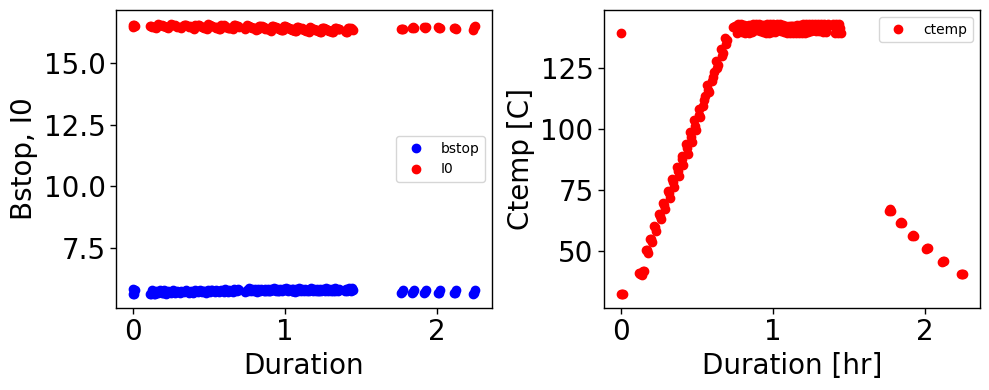

['Run15_AcOH_HoldT140_ctr0_scan1'] Run15_AcOH_HoldT140_ctr0/WAXS/*.raw [5.86021] [139.1299] [200184.26] [16.4488]
0.3562697582802393
['test_Run15_AcOH_RampT30_ctr0_scan1'] Run15_AcOH_RampT30_ctr0/WAXS/*.raw [5.6496675] [32.5561705] [197536.89500000002] [16.519235000000002]
0.3420053955283038
['Run15_Nylon6_AcOH_HoldT140_ctr0_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr0/WAXS/*.raw [5.73334] [141.88651] [200161.51] [16.35399]
0.35057744318053274
['test_Run15_Nylon6_AcOH_RampT30_ctr0_scan1'] Run15_Nylon6_AcOH_RampT30_ctr0/WAXS/*.raw [5.64834] [32.56781675] [197514.47749999998] [16.5380525]
0.3415359819422511
['Run15_Nylon6_HoldT140_ctr0_scan1'] Run15_Nylon6_HoldT140_ctr0/WAXS/*.raw [5.81019] [142.23289] [200207.07] [16.53371]
0.3514147762359447
['test_Run15_Nylon6_RampT30_ctr0_scan1'] Run15_Nylon6_RampT30_ctr0/WAXS/*.raw [5.7937125] [32.28643025] [197559.15749999997] [16.4889625]
0.3513691355656852
['Run15_AcOH_HoldT140_ctr1_scan1'] Run15_AcOH_HoldT140_ctr1/WAXS/*.raw [5.86446] [139.31419] [20

['Run15_AcOH_HoldT140_ctr3_scan1'] Run15_AcOH_HoldT140_ctr3/WAXS/*.raw [5.8418] [141.1129] [200406.83] [16.40792]
0.356035378036948
['Run15_AcOH_RampT45_ctr3_scan1'] Run15_AcOH_RampT45_ctr3/WAXS/*.raw [5.70605] [50.373379] [198128.87] [16.55333]
0.3447070770654606
['Run15_Nylon6_AcOH_HoldT140_ctr3_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr3/WAXS/*.raw [5.74692] [139.6855] [200384.26] [16.40135]
0.35039310788441197
['Run15_Nylon6_AcOH_RampT45_ctr3_scan1'] Run15_Nylon6_AcOH_RampT45_ctr3/WAXS/*.raw [5.68248] [50.578701] [198106.21] [16.58937]
0.3425374200466926
['Run15_Nylon6_HoldT140_ctr3_scan1'] Run15_Nylon6_HoldT140_ctr3/WAXS/*.raw [5.77942] [142.7244] [200429.6] [16.35215]
0.3534348694208406
['Run15_Nylon6_RampT45_ctr3_scan1'] Run15_Nylon6_RampT45_ctr3/WAXS/*.raw [5.80216] [49.365479] [198151.64] [16.55189]
0.3505436539271346
['Run15_AcOH_HoldT140_ctr4_scan1'] Run15_AcOH_HoldT140_ctr4/WAXS/*.raw [5.83395] [142.10609] [200481.06] [16.36582]
0.3564715975123764
['Run15_AcOH_RampT50_ctr4_scan

['Run15_Nylon6_AcOH_RampT60_ctr6_scan1'] Run15_Nylon6_AcOH_RampT60_ctr6/WAXS/*.raw [5.68892] [65.047997] [198406.11] [16.5944]
0.34282167478185416
['Run15_Nylon6_HoldT140_ctr6_scan1'] Run15_Nylon6_HoldT140_ctr6/WAXS/*.raw [5.78003] [141.1368] [200652.2] [16.3928]
0.35259565174954854
['Run15_Nylon6_RampT60_ctr6_scan1'] Run15_Nylon6_RampT60_ctr6/WAXS/*.raw [5.79945] [62.977051] [198451.68] [16.54825]
0.35045699696342514
['Run15_AcOH_HoldT140_ctr7_scan1'] Run15_AcOH_HoldT140_ctr7/WAXS/*.raw [5.84444] [142.99181] [200703.37] [16.39046]
0.35657571538565724
['Run15_AcOH_RampT65_ctr7_scan1'] Run15_AcOH_RampT65_ctr7/WAXS/*.raw [5.71556] [69.070618] [198532.96] [16.48278]
0.3467594665462986
['Run15_Nylon6_AcOH_HoldT140_ctr7_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr7/WAXS/*.raw [5.74642] [140.3849] [200680.77] [16.38546]
0.3507023910222844
['Run15_Nylon6_AcOH_RampT65_ctr7_scan1'] Run15_Nylon6_AcOH_RampT65_ctr7/WAXS/*.raw [5.67816] [69.911903] [198510.36] [16.52015]
0.3437111648501981
['Run15_Nylon6

['Run15_Nylon6_RampT100_ctr14_scan1'] Run15_Nylon6_RampT100_ctr14/WAXS/*.raw [5.81228] [99.678558] [199297.61] [16.58489]
0.350456349122605
['Run15_AcOH_CoolingT65_ctr15_scan1'] Run15_AcOH_CoolingT65_ctr15/WAXS/*.raw [5.72589] [67.238831] [203876.53] [16.38151]
0.3495337120936959
['Run15_AcOH_HoldT140_ctr15_scan1'] Run15_AcOH_HoldT140_ctr15/WAXS/*.raw [5.84081] [140.13271] [201291.82] [16.33937]
0.3574684948073274
['Run15_AcOH_RampT105_ctr15_scan1'] Run15_AcOH_RampT105_ctr15/WAXS/*.raw [5.80279] [105.7992] [199369.44] [16.51192]
0.3514303606122123
['Run15_Nylon6_AcOH_CoolingT65_ctr15_scan1'] Run15_Nylon6_AcOH_CoolingT65_ctr15/WAXS/*.raw [5.70106] [66.403809] [203853.87] [16.37234]
0.34821290053834697
['Run15_Nylon6_AcOH_HoldT140_ctr15_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr15/WAXS/*.raw [5.76059] [142.8147] [201269.04] [16.3633]
0.35204329200100226
['Run15_Nylon6_AcOH_RampT105_ctr15_scan1'] Run15_Nylon6_AcOH_RampT105_ctr15/WAXS/*.raw [5.74207] [108.0825] [199347.69] [16.52252]
0.3475299

['Run15_AcOH_RampT125_ctr19_scan1'] Run15_AcOH_RampT125_ctr19/WAXS/*.raw [5.80992] [124.9633] [199791.63] [16.41732]
0.3538896726140442
['Run15_Nylon6_AcOH_CoolingT45_ctr19_scan1'] Run15_Nylon6_AcOH_CoolingT45_ctr19/WAXS/*.raw [5.66267] [45.743561] [205109.54] [16.39954]
0.34529444118554553
['Run15_Nylon6_AcOH_HoldT140_ctr19_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr19/WAXS/*.raw [5.75091] [141.9648] [201561.49] [16.34233]
0.35190269686146347
['Run15_Nylon6_AcOH_RampT125_ctr19_scan1'] Run15_Nylon6_AcOH_RampT125_ctr19/WAXS/*.raw [5.72595] [127.756] [199769.01] [16.42356]
0.3486424380584965
['Run15_Nylon6_CoolingT45_ctr19_scan1'] Run15_Nylon6_CoolingT45_ctr19/WAXS/*.raw [5.78838] [45.811771] [205156.44] [16.38025]
0.35337555898109
['Run15_Nylon6_HoldT140_ctr19_scan1'] Run15_Nylon6_HoldT140_ctr19/WAXS/*.raw [5.7862] [142.3049] [201604.89] [16.28422]
0.35532558513702217
['Run15_Nylon6_RampT125_ctr19_scan1'] Run15_Nylon6_RampT125_ctr19/WAXS/*.raw [5.77953] [125.9915] [199814.35] [16.41088]
0.35

['Run15_AcOH_HoldT140_ctr32_scan1'] Run15_AcOH_HoldT140_ctr32/WAXS/*.raw [5.82956] [142.0264] [202554.79] [16.26938]
0.35831482207680926
['Run15_Nylon6_AcOH_HoldT140_ctr32_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr32/WAXS/*.raw [5.74615] [142.79739] [202532.22] [16.28956]
0.35275047330928516
['Run15_Nylon6_HoldT140_ctr32_scan1'] Run15_Nylon6_HoldT140_ctr32/WAXS/*.raw [5.78199] [139.26961] [202577.65] [16.26082]
0.3555780089810969
['Run15_AcOH_HoldT140_ctr33_scan1'] Run15_AcOH_HoldT140_ctr33/WAXS/*.raw [5.87714] [141.7114] [202628.66] [16.40033]
0.35835498432043744
['Run15_Nylon6_AcOH_HoldT140_ctr33_scan1'] Run15_Nylon6_AcOH_HoldT140_ctr33/WAXS/*.raw [5.7942] [143.015] [202606.09] [16.4153]
0.35297557766230286
['Run15_Nylon6_HoldT140_ctr33_scan1'] Run15_Nylon6_HoldT140_ctr33/WAXS/*.raw [5.82608] [139.2935] [202652.07] [16.38565]
0.3555598953962767
['Run15_AcOH_HoldT140_ctr34_scan1'] Run15_AcOH_HoldT140_ctr34/WAXS/*.raw [5.86992] [141.2749] [202703.14] [16.36101]
0.35877491670746486
['Run15_

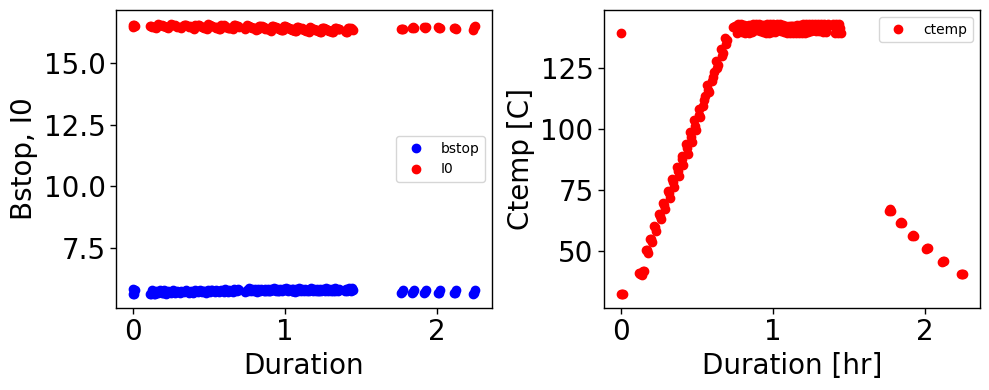

'\n\n'

In [157]:

#raw_dir = r'X:\bl1-5\Anjani\Acetolysis\May2024'
#raw_dir = r'X:\bl1-5\Anjani\Methanolysis\May2024'

raw_dir_aceto = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Acetolysis/May2024/'
#raw_dir_meth = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/May2024/'

'''
# Run1
common_keyword = "Run1"
keyword = "Run1*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)
"""
print("Keywords:")
for kw in keywords:
    print(f"    '{kw}',")
"""

process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run2
common_keyword = "Run2"
keyword = "Run2*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)




# Run3
common_keyword = "Run3"
keyword = "Run3*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run4
common_keyword = "Run4"
keyword = "Run4*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run5
common_keyword = "Run5"
keyword = "test_Nylon66*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# Run6
common_keyword = "Run6"
keyword = "Run6*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# Run7
common_keyword = "Run7"
keyword = "Run7*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)

# Run8
common_keyword = "Run8a"
keyword = "Run8a*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)

# Run9
common_keyword = "Run9"
keyword = "Run9*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# Run11
common_keyword = "Run11"
keyword = "Run11*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)

# Run12
common_keyword = "Run12"
keyword = "Run12*"

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# Run13
common_keyword = "Run13"  # folder name
keyword = "Run13*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run17
common_keyword = "Run17"  # folder name
keyword = "Run17*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)


process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# Run8b
common_keyword = "Run8b"  # folder name
keyword = "Run8b*" # file name
keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



common_keyword = "Run8c"  # folder name
keyword = "Run8c*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run 26
common_keyword = "Run13b"  # folder name
keyword = "Run13b*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)

'''


common_keyword = "Run15"  # folder name
keyword = "Run15*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_aceto, common_keyword, keyword)

   
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)
'''

'''

## Methanolysis

Subfolder 'Run23rep' already exists within the base folder. Doing nothing.
Subfolder 'Run23rep' already exists within the base folder. Doing nothing.
Subfolder 'Run23c' already exists within the base folder. Doing nothing.
Subfolder 'Run23c' already exists within the base folder. Doing nothing.
Subfolder 'Run24' already exists within the base folder. Doing nothing.
Subfolder 'Run24' already exists within the base folder. Doing nothing.
Subfolder 'Run25' already exists within the base folder. Doing nothing.
Subfolder 'Run25' already exists within the base folder. Doing nothing.
Subfolder 'Run27' already exists within the base folder. Doing nothing.
Subfolder 'Run27' already exists within the base folder. Doing nothing.
Subfolder 'Run26' already exists within the base folder. Doing nothing.
Subfolder 'Run26' already exists within the base folder. Doing nothing.


['Run26_Mix3_MeOH_DMEA_CoolingT190_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT190_ctr0/SAXS/*.raw [5.25921] [188.56841] [187954.17] [15.9906]
0.3288938501369555
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr0/SAXS/*.raw [5.12165] [35.501949] [194080.96] [16.32996]
0.3136351834297206
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr0/SAXS/*.raw [6.54226] [191.106] [173172.02] [16.23667]
0.40293114290060705
['Run26_Mix3_MeOH_DMEA_RampT30_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_RampT30_ctr0/SAXS/*.raw [5.35831] [36.110989] [169699.21] [16.53712]
0.3240171202724537
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT190_ctr0_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT190_ctr0/SAXS/*.raw [5.50441] [189.9469] [187908.6] [16.04816]
0.34299321542158107
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr0_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr0/SAXS/*.raw [5.60702] [188.5009] [173126.59] [16.27106]
0.3446007820019102
['Run26_PET_BiaxFi

['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr1_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr1/SAXS/*.raw [5.12462] [40.39468] [194098.01] [16.30803]
0.31423905891760073
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr1_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr1/SAXS/*.raw [6.60317] [189.3476] [173245.99] [16.36606]
0.40346729756581606
['Run26_Mix3_MeOH_DMEA_RampT35_ctr1_scan1'] Run26_Mix3_MeOH_DMEA_RampT35_ctr1/SAXS/*.raw [5.33949] [36.17255] [169775.8] [16.49418]
0.3237196392909499
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT185_ctr1_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT185_ctr1/SAXS/*.raw [5.47514] [185.8663] [188039.63] [15.94603]
0.3433544274029335
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr1_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr1/SAXS/*.raw [5.66003] [188.6002] [173200.62] [16.39806]
0.34516461093568385
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT35_ctr1_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT35_ctr1/SAXS/*.raw [5.15279] [35.31049] [169729.94] [16.50955]
0.31210965774354843
['Run26_P

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr2_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr2/SAXS/*.raw [6.58874] [188.3242] [173320.11] [16.31179]
0.4039250137477248
['Run26_Mix3_MeOH_DMEA_RampT40_ctr2_scan1'] Run26_Mix3_MeOH_DMEA_RampT40_ctr2/SAXS/*.raw [5.39104] [44.612549] [169879.23] [16.46974]
0.327330000352161
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT180_ctr2_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT180_ctr2/SAXS/*.raw [5.43922] [181.11681] [188175.36] [15.88459]
0.3424211767505488
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr2_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr2/SAXS/*.raw [5.65379] [190.23669] [173274.62] [16.36103]
0.34556442962331835
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT40_ctr2_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT40_ctr2/SAXS/*.raw [5.13411] [45.649811] [169833.76] [16.43058]
0.3124728402770931
['Run26_PET_Fiber1_CoolingT180_ctr2_scan1'] Run26_PET_Fiber1_CoolingT180_ctr2/SAXS/*.raw [6.27146] [181.6003] [188197.91] [16.03201]
0.3911836382337586
['Run26_PET_Fiber1_HoldT

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr3_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr3/SAXS/*.raw [6.57708] [189.2558] [173394.13] [16.26207]
0.40444297681660446
['Run26_Mix3_MeOH_DMEA_RampT45_ctr3_scan1'] Run26_Mix3_MeOH_DMEA_RampT45_ctr3/SAXS/*.raw [5.4998] [49.152248] [169976.15] [16.54536]
0.33240739397631724
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT175_ctr3_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT175_ctr3/SAXS/*.raw [5.46002] [176.3838] [188313.51] [15.96095]
0.3420861540196542
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr3_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr3/SAXS/*.raw [5.63535] [191.7037] [173348.74] [16.28418]
0.3460628659226317
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT45_ctr3_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT45_ctr3/SAXS/*.raw [5.17836] [50.017849] [169930.61] [16.58843]
0.3121669742103382
['Run26_PET_Fiber1_CoolingT175_ctr3_scan1'] Run26_PET_Fiber1_CoolingT175_ctr3/SAXS/*.raw [6.23242] [176.6983] [188336.18] [15.97054]
0.3902447882163033
['Run26_PET_Fiber1_HoldT1

['Run26_Mix3_MeOH_DMEA_RampT50_ctr4_scan1'] Run26_Mix3_MeOH_DMEA_RampT50_ctr4/SAXS/*.raw [5.53812] [53.7132] [170075.89] [16.45554]
0.33655048694846845
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT170_ctr4_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT170_ctr4/SAXS/*.raw [5.4301] [171.4926] [188454.34] [15.87473]
0.3420593610096046
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr4_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr4/SAXS/*.raw [5.61814] [191.2229] [173422.97] [16.22285]
0.34631029689604476
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT50_ctr4_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT50_ctr4/SAXS/*.raw [5.16399] [55.139648] [170030.17] [16.51008]
0.31277801197813704
['Run26_PET_Fiber1_CoolingT170_ctr4_scan1'] Run26_PET_Fiber1_CoolingT170_ctr4/SAXS/*.raw [6.21177] [171.88451] [188476.9] [15.88267]
0.3911036368570272
['Run26_PET_Fiber1_HoldT190_ctr4_scan1'] Run26_PET_Fiber1_HoldT190_ctr4/SAXS/*.raw [6.19586] [188.354] [173445.62] [16.21718]
0.382055326511761
['Run26_PET_Fiber1_RampT50_ctr4_scan

['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT165_ctr5_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT165_ctr5/SAXS/*.raw [5.47586] [166.66319] [188596.55] [15.99571]
0.34233303804582604
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr5_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr5/SAXS/*.raw [5.65241] [189.4415] [173497.26] [16.39292]
0.344808002479119
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT55_ctr5_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT55_ctr5/SAXS/*.raw [5.15937] [60.069851] [170130.42] [16.43544]
0.313917363940363
['Run26_PET_Fiber1_CoolingT165_ctr5_scan1'] Run26_PET_Fiber1_CoolingT165_ctr5/SAXS/*.raw [6.2473] [167.0081] [188619.09] [15.98461]
0.3908321817047773
['Run26_PET_Fiber1_HoldT190_ctr5_scan1'] Run26_PET_Fiber1_HoldT190_ctr5/SAXS/*.raw [6.24158] [189.26199] [173519.83] [16.3503]
0.3817410078102542
['Run26_PET_Fiber1_RampT55_ctr5_scan1'] Run26_PET_Fiber1_RampT55_ctr5/SAXS/*.raw [6.17762] [59.66782] [170153.02] [16.43525]
0.3758762416148218
['Run26_Mix3_MeOH_DMEA_CoolingT160_ctr6_scan

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr6_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr6/SAXS/*.raw [5.64562] [188.3772] [173571.23] [16.33306]
0.34565598852878765
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT60_ctr6_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT60_ctr6/SAXS/*.raw [5.19776] [64.945923] [170232.4] [16.55131]
0.31403919085558785
['Run26_PET_Fiber1_CoolingT160_ctr6_scan1'] Run26_PET_Fiber1_CoolingT160_ctr6/SAXS/*.raw [6.21126] [162.06599] [188763.6] [15.89683]
0.3907231819174012
['Run26_PET_Fiber1_HoldT190_ctr6_scan1'] Run26_PET_Fiber1_HoldT190_ctr6/SAXS/*.raw [6.21796] [191.15961] [173593.96] [16.29968]
0.38147742777772325
['Run26_PET_Fiber1_RampT60_ctr6_scan1'] Run26_PET_Fiber1_RampT60_ctr6/SAXS/*.raw [6.23206] [64.314636] [170255.03] [16.5269]
0.3770858418699211
['Run26_Mix3_MeOH_DMEA_CoolingT155_ctr7_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT155_ctr7/SAXS/*.raw [5.20609] [154.2934] [188933.61] [15.99748]
0.32543188052118205
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr7_scan1'] Run

['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT155_ctr7_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT155_ctr7/SAXS/*.raw [5.44328] [157.1039] [188888.02] [16.01519]
0.3398823242184451
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr7_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr7/SAXS/*.raw [5.60288] [189.2702] [173645.57] [16.25909]
0.3445998515292061
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT65_ctr7_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT65_ctr7/SAXS/*.raw [5.17654] [69.825233] [170336.09] [16.5015]
0.313701178680726
['Run26_PET_Fiber1_CoolingT155_ctr7_scan1'] Run26_PET_Fiber1_CoolingT155_ctr7/SAXS/*.raw [6.2431] [157.2357] [188910.63] [16.0176]
0.38976500849066026
['Run26_PET_Fiber1_HoldT190_ctr7_scan1'] Run26_PET_Fiber1_HoldT190_ctr7/SAXS/*.raw [6.19891] [191.774] [173668.28] [16.27024]
0.38099683839943355
['Run26_PET_Fiber1_RampT65_ctr7_scan1'] Run26_PET_Fiber1_RampT65_ctr7/SAXS/*.raw [6.20215] [68.91745] [170359.01] [16.48063]
0.3763296670090888
['Run26_Mix3_MeOH_DMEA_CoolingT150_ctr8_scan1'

['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT150_ctr8_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT150_ctr8/SAXS/*.raw [5.41032] [152.2012] [189036.33] [15.92542]
0.3397285597491306
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr8_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr8/SAXS/*.raw [5.61293] [191.2076] [173720.0] [16.20477]
0.3463751722486651
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT70_ctr8_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT70_ctr8/SAXS/*.raw [5.21485] [74.656517] [170443.57] [16.4252]
0.3174908068090495
['Run26_PET_Fiber1_CoolingT150_ctr8_scan1'] Run26_PET_Fiber1_CoolingT150_ctr8/SAXS/*.raw [6.21922] [152.4062] [189058.97] [15.91899]
0.39067930817218927
['Run26_PET_Fiber1_HoldT190_ctr8_scan1'] Run26_PET_Fiber1_HoldT190_ctr8/SAXS/*.raw [6.17108] [190.57651] [173742.58] [16.18902]
0.3811892257838955
['Run26_PET_Fiber1_RampT70_ctr8_scan1'] Run26_PET_Fiber1_RampT70_ctr8/SAXS/*.raw [6.18552] [73.452972] [170467.35] [16.40073]
0.37714906592572406
['Run26_Mix3_MeOH_DMEA_CoolingT145_ctr9_s

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr9_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr9/SAXS/*.raw [5.66922] [191.7558] [173794.46] [16.33622]
0.34703376913386325
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT75_ctr9_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT75_ctr9/SAXS/*.raw [5.20241] [79.45636] [170557.3] [16.52311]
0.3148565857154011
['Run26_PET_Fiber1_CoolingT145_ctr9_scan1'] Run26_PET_Fiber1_CoolingT145_ctr9/SAXS/*.raw [6.24653] [147.5056] [189208.66] [16.02461]
0.3898085507229193
['Run26_PET_Fiber1_HoldT190_ctr9_scan1'] Run26_PET_Fiber1_HoldT190_ctr9/SAXS/*.raw [6.23402] [188.757] [173816.17] [16.32033]
0.38197879577189925
['Run26_PET_Fiber1_RampT75_ctr9_scan1'] Run26_PET_Fiber1_RampT75_ctr9/SAXS/*.raw [6.21491] [78.131737] [170580.4] [16.52164]
0.37616786227033144
['Run26_Mix3_MeOH_DMEA_CoolingT140_ctr10_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT140_ctr10/SAXS/*.raw [5.21712] [139.8152] [189382.36] [15.98614]
0.3263527030289989
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr10_scan1'] Run2

['Run26_PET_BiaxFilm_MeOH_DMEA_RampT80_ctr10_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT80_ctr10/SAXS/*.raw [5.21916] [84.255676] [170669.06] [16.4536]
0.3172047454660378
['Run26_PET_Fiber1_CoolingT140_ctr10_scan1'] Run26_PET_Fiber1_CoolingT140_ctr10/SAXS/*.raw [6.22488] [142.645] [189359.46] [15.9454]
0.390387196307399
['Run26_PET_Fiber1_HoldT190_ctr10_scan1'] Run26_PET_Fiber1_HoldT190_ctr10/SAXS/*.raw [6.22195] [188.5519] [173890.69] [16.26598]
0.38251307329776624
['Run26_PET_Fiber1_RampT80_ctr10_scan1'] Run26_PET_Fiber1_RampT80_ctr10/SAXS/*.raw [6.20104] [82.794456] [170691.81] [16.45261]
0.3769031174992904
['Run26_Mix3_MeOH_DMEA_CoolingT135_ctr11_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT135_ctr11/SAXS/*.raw [5.23824] [135.16319] [189533.2] [16.0571]
0.32622578174141037
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr11_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr11/SAXS/*.raw [5.16018] [42.334438] [194554.05] [16.40776]
0.3144963115013872
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr11_scan1'] Run2

['Run26_PET_BiaxFilm_MeOH_DMEA_RampT85_ctr11_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT85_ctr11/SAXS/*.raw [5.18111] [89.049187] [170778.37] [16.38536]
0.31620361102838146
['Run26_PET_Fiber1_CoolingT135_ctr11_scan1'] Run26_PET_Fiber1_CoolingT135_ctr11/SAXS/*.raw [6.25088] [137.873] [189510.27] [16.04185]
0.3896607934870355
['Run26_PET_Fiber1_HoldT190_ctr11_scan1'] Run26_PET_Fiber1_HoldT190_ctr11/SAXS/*.raw [6.1947] [190.0979] [173965.23] [16.21416]
0.3820549445669711
['Run26_PET_Fiber1_RampT85_ctr11_scan1'] Run26_PET_Fiber1_RampT85_ctr11/SAXS/*.raw [6.23397] [87.471008] [170801.18] [16.5605]
0.37643609794390265
['Run26_Mix3_MeOH_DMEA_CoolingT130_ctr12_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT130_ctr12/SAXS/*.raw [5.25518] [130.3891] [189681.59] [15.99506]
0.3285501898711227
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr12_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr12/SAXS/*.raw [5.15693] [45.423069] [194571.4] [16.4109]
0.31423809784959994
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr12_scan1'] Run

['Run26_PET_Fiber1_CoolingT130_ctr12_scan1'] Run26_PET_Fiber1_CoolingT130_ctr12/SAXS/*.raw [6.22026] [132.9838] [189658.7] [15.97224]
0.389441931751589
['Run26_PET_Fiber1_HoldT190_ctr12_scan1'] Run26_PET_Fiber1_HoldT190_ctr12/SAXS/*.raw [6.19383] [191.672] [174038.67] [16.17985]
0.3828113363226483
['Run26_PET_Fiber1_RampT90_ctr12_scan1'] Run26_PET_Fiber1_RampT90_ctr12/SAXS/*.raw [6.22354] [92.154449] [170907.25] [16.47849]
0.3776765953676581
['Run26_Mix3_MeOH_DMEA_CoolingT125_ctr13_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT125_ctr13/SAXS/*.raw [5.29079] [125.8184] [189827.95] [16.05863]
0.3294670840538701
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr13_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr13/SAXS/*.raw [5.15432] [45.982391] [194588.54] [16.38554]
0.3145651592806829
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr13_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr13/SAXS/*.raw [5.27585] [188.53709] [174133.99] [16.27503]
0.3241683732687436
['Run26_Mix3_MeOH_DMEA_RampT95_ctr13_scan1'] Run26_Mix3_MeOH_DME

['Run26_PET_Fiber1_HoldT190_ctr13_scan1'] Run26_PET_Fiber1_HoldT190_ctr13/SAXS/*.raw [6.2448] [191.55009] [174111.9] [16.28824]
0.3833931720063064
['Run26_PET_Fiber1_RampT95_ctr13_scan1'] Run26_PET_Fiber1_RampT95_ctr13/SAXS/*.raw [6.19704] [96.70929] [171009.93] [16.42966]
0.37718613775330717
['Run26_Mix3_MeOH_DMEA_CoolingT120_ctr14_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT120_ctr14/SAXS/*.raw [5.29355] [121.123] [189962.56] [15.9871]
0.331113835529896
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr14_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr14/SAXS/*.raw [5.14978] [45.63327] [194605.65] [16.3924]
0.3141565603572387
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr14_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr14/SAXS/*.raw [5.24465] [188.84309] [174207.52] [16.21772]
0.32339009429192267
['Run26_Mix3_MeOH_DMEA_RampT100_ctr14_scan1'] Run26_Mix3_MeOH_DMEA_RampT100_ctr14/SAXS/*.raw [5.75972] [99.650673] [171129.15] [16.52344]
0.3485787463143268
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT120_ctr14_scan1'] Run26_

['Run26_PET_Fiber1_HoldT190_ctr14_scan1'] Run26_PET_Fiber1_HoldT190_ctr14/SAXS/*.raw [6.21942] [190.26579] [174185.47] [16.25521]
0.3826108675310869
['Run26_PET_Fiber1_RampT100_ctr14_scan1'] Run26_PET_Fiber1_RampT100_ctr14/SAXS/*.raw [6.23026] [101.4429] [171107.11] [16.51648]
0.3772147576239005
['Run26_Mix3_MeOH_DMEA_CoolingT115_ctr15_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT115_ctr15/SAXS/*.raw [5.34386] [116.5607] [190093.41] [16.11284]
0.3316522723492569
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr15_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr15/SAXS/*.raw [5.24118] [190.4566] [174281.65] [16.18351]
0.3238592863970795
['Run26_Mix3_MeOH_DMEA_RampT105_ctr15_scan1'] Run26_Mix3_MeOH_DMEA_RampT105_ctr15/SAXS/*.raw [5.74739] [104.8721] [171224.26] [16.46705]
0.34902365633188703
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT115_ctr15_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT115_ctr15/SAXS/*.raw [5.40355] [117.8126] [190048.17] [16.13437]
0.3349092651277986
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr15_scan

['Run26_PET_Fiber1_HoldT190_ctr15_scan1'] Run26_PET_Fiber1_HoldT190_ctr15/SAXS/*.raw [6.20482] [188.68629] [174258.76] [16.19213]
0.38319973962659637
['Run26_PET_Fiber1_RampT105_ctr15_scan1'] Run26_PET_Fiber1_RampT105_ctr15/SAXS/*.raw [6.22232] [105.9905] [171201.22] [16.48809]
0.3773827047280795
['Run26_Mix3_MeOH_DMEA_CoolingT110_ctr16_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT110_ctr16/SAXS/*.raw [5.37857] [111.7709] [190229.28] [16.0462]
0.33519275591728886
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr16_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr16/SAXS/*.raw [5.21773] [191.8111] [174355.63] [16.13326]
0.3234144865947738
['Run26_Mix3_MeOH_DMEA_RampT110_ctr16_scan1'] Run26_Mix3_MeOH_DMEA_RampT110_ctr16/SAXS/*.raw [5.73005] [113.4565] [171325.22] [16.3933]
0.3495360909639914
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT110_ctr16_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT110_ctr16/SAXS/*.raw [5.37531] [113.031] [190184.92] [16.0523]
0.3348622938768899
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr16_scan1']

['Run26_Mix3_MeOH_DMEA_CoolingT105_ctr17_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT105_ctr17/SAXS/*.raw [5.44135] [106.9729] [190371.78] [16.13534]
0.33723181538164054
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr17_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr17/SAXS/*.raw [5.26111] [191.43539] [174428.09] [16.27156]
0.3233316289280192
['Run26_Mix3_MeOH_DMEA_RampT115_ctr17_scan1'] Run26_Mix3_MeOH_DMEA_RampT115_ctr17/SAXS/*.raw [5.78656] [114.9568] [171430.1] [16.51732]
0.35033286271622754
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT105_ctr17_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT105_ctr17/SAXS/*.raw [5.39178] [107.9921] [190327.18] [16.14342]
0.333992425396849
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr17_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr17/SAXS/*.raw [5.53417] [188.7326] [174384.33] [16.20777]
0.34145166176469677
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT115_ctr17_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT115_ctr17/SAXS/*.raw [5.21698] [118.1665] [171385.42] [16.4274]
0.3175779490363661
['R

['Run26_Mix3_MeOH_DMEA_RampT120_ctr18_scan1'] Run26_Mix3_MeOH_DMEA_RampT120_ctr18/SAXS/*.raw [5.76682] [123.2276] [171530.98] [16.44442]
0.35068552128928837
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT100_ctr18_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT100_ctr18/SAXS/*.raw [5.36099] [103.0558] [190477.49] [16.07528]
0.33349279141638594
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr18_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr18/SAXS/*.raw [5.50857] [188.55859] [174456.89] [16.239]
0.33921854794014406
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT120_ctr18_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT120_ctr18/SAXS/*.raw [5.23812] [120.0215] [171485.49] [16.48142]
0.3178197024285529
['Run26_PET_Fiber1_CoolingT100_ctr18_scan1'] Run26_PET_Fiber1_CoolingT100_ctr18/SAXS/*.raw [6.23999] [103.9586] [190500.06] [16.05748]
0.38860331758158806
['Run26_PET_Fiber1_HoldT190_ctr18_scan1'] Run26_PET_Fiber1_HoldT190_ctr18/SAXS/*.raw [6.23401] [191.6971] [174479.46] [16.24529]
0.38374261093523104
['Run26_PET_Fibe

['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT95_ctr19_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT95_ctr19/SAXS/*.raw [5.37591] [98.006012] [190638.6] [16.15831]
0.33270249178286593
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr19_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr19/SAXS/*.raw [5.46763] [189.8817] [174529.49] [16.20343]
0.3374365797858848
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT125_ctr19_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT125_ctr19/SAXS/*.raw [5.23077] [127.7824] [171592.9] [16.37941]
0.3193503306895669
['Run26_PET_Fiber1_CoolingT95_ctr19_scan1'] Run26_PET_Fiber1_CoolingT95_ctr19/SAXS/*.raw [6.27692] [99.066071] [190661.26] [16.16736]
0.388246442214437
['Run26_PET_Fiber1_HoldT190_ctr19_scan1'] Run26_PET_Fiber1_HoldT190_ctr19/SAXS/*.raw [6.21935] [191.6855] [174551.22] [16.15188]
0.38505424755508344
['Run26_PET_Fiber1_RampT125_ctr19_scan1'] Run26_PET_Fiber1_RampT125_ctr19/SAXS/*.raw [6.19066] [125.0915] [171616.47] [16.37707]
0.37800778771782745
['Run26_Mix3_MeOH_DMEA_Cooling

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr20_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr20/SAXS/*.raw [5.40417] [191.4532] [174601.94] [16.13028]
0.3350326218763716
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT130_ctr20_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT130_ctr20/SAXS/*.raw [5.25963] [132.5291] [171699.34] [16.52329]
0.3183161464817237
['Run26_PET_Fiber1_CoolingT90_ctr20_scan1'] Run26_PET_Fiber1_CoolingT90_ctr20/SAXS/*.raw [6.23445] [94.130127] [190833.28] [16.06401]
0.3881004805151391
['Run26_PET_Fiber1_HoldT190_ctr20_scan1'] Run26_PET_Fiber1_HoldT190_ctr20/SAXS/*.raw [6.21319] [190.5683] [174624.64] [16.11339]
0.3855917345760265
['Run26_PET_Fiber1_RampT130_ctr20_scan1'] Run26_PET_Fiber1_RampT130_ctr20/SAXS/*.raw [6.22313] [129.7776] [171722.4] [16.48183]
0.377575184309024
['Run26_Mix3_MeOH_DMEA_CoolingT85_ctr21_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT85_ctr21/SAXS/*.raw [5.44971] [87.793404] [191038.51] [16.15501]
0.33733869555017293
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr21_scan1'] R

['Run26_PET_Fiber1_CoolingT85_ctr21_scan1'] Run26_PET_Fiber1_CoolingT85_ctr21/SAXS/*.raw [6.26527] [88.995209] [191015.89] [16.15165]
0.38790278392610045
['Run26_PET_Fiber1_HoldT190_ctr21_scan1'] Run26_PET_Fiber1_HoldT190_ctr21/SAXS/*.raw [6.23992] [188.8873] [174697.18] [16.27992]
0.3832893527732323
['Run26_PET_Fiber1_RampT135_ctr21_scan1'] Run26_PET_Fiber1_RampT135_ctr21/SAXS/*.raw [6.20535] [134.6201] [171826.13] [16.41632]
0.3779988450517534
['Run26_Mix3_MeOH_DMEA_CoolingT80_ctr22_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT80_ctr22/SAXS/*.raw [5.46543] [82.522133] [191233.02] [16.23357]
0.33667455772205374
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr22_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr22/SAXS/*.raw [5.24379] [191.62041] [174793.54] [16.17562]
0.3241786095370688
['Run26_Mix3_MeOH_DMEA_RampT140_ctr22_scan1'] Run26_Mix3_MeOH_DMEA_RampT140_ctr22/SAXS/*.raw [5.73273] [141.55299] [171955.65] [16.3165]
0.3513455704348359
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT80_ctr22_scan1'] Run26_PET_BiaxFilm_

['Run26_PET_Fiber1_HoldT190_ctr22_scan1'] Run26_PET_Fiber1_HoldT190_ctr22/SAXS/*.raw [6.22848] [188.50661] [174770.77] [16.19322]
0.38463505096577455
['Run26_PET_Fiber1_RampT140_ctr22_scan1'] Run26_PET_Fiber1_RampT140_ctr22/SAXS/*.raw [6.18702] [139.35789] [171932.15] [16.36295]
0.37811152634457723
['Run26_Mix3_MeOH_DMEA_CoolingT75_ctr23_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT75_ctr23/SAXS/*.raw [5.42135] [77.279327] [191436.15] [16.09262]
0.33688423637667453
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr23_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr23/SAXS/*.raw [5.22311] [191.6709] [174867.57] [16.14864]
0.32343962092163797
['Run26_Mix3_MeOH_DMEA_RampT145_ctr23_scan1'] Run26_Mix3_MeOH_DMEA_RampT145_ctr23/SAXS/*.raw [5.76565] [146.70441] [172063.61] [16.4205]
0.3511251179927529
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT75_ctr23_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT75_ctr23/SAXS/*.raw [5.38239] [77.22171] [191391.31] [16.13496]
0.33358558062740784
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr23_sc

['Run26_Mix3_MeOH_DMEA_CoolingT70_ctr24_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT70_ctr24/SAXS/*.raw [5.4235] [71.940193] [191653.21] [16.16014]
0.3356097162524582
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr24_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr24/SAXS/*.raw [5.22292] [190.2511] [174941.71] [16.07577]
0.3248939242101623
['Run26_Mix3_MeOH_DMEA_RampT150_ctr24_scan1'] Run26_Mix3_MeOH_DMEA_RampT150_ctr24/SAXS/*.raw [5.74323] [151.7511] [172172.18] [16.35198]
0.35122535619539647
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT70_ctr24_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT70_ctr24/SAXS/*.raw [5.40062] [72.022491] [191607.95] [16.21112]
0.33314292905116977
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr24_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr24/SAXS/*.raw [5.38542] [188.5018] [174896.27] [16.1337]
0.3337994384425147
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT150_ctr24_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT150_ctr24/SAXS/*.raw [5.35026] [151.9223] [172126.5] [16.39887]
0.326257845814986
['Run26_

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr25_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr25/SAXS/*.raw [5.25888] [188.7164] [175014.94] [16.22203]
0.32418137557383386
['Run26_Mix3_MeOH_DMEA_RampT155_ctr25_scan1'] Run26_Mix3_MeOH_DMEA_RampT155_ctr25/SAXS/*.raw [5.7276] [156.7567] [172281.7] [16.34903]
0.35033271087030854
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT65_ctr25_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT65_ctr25/SAXS/*.raw [5.43111] [66.645599] [191837.14] [16.25697]
0.33407885971371054
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr25_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr25/SAXS/*.raw [5.34984] [189.7211] [174970.43] [16.07249]
0.3328569499809924
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT155_ctr25_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT155_ctr25/SAXS/*.raw [5.34257] [156.7422] [172236.33] [16.34182]
0.3269262542360643
['Run26_PET_Fiber1_CoolingT65_ctr25_scan1'] Run26_PET_Fiber1_CoolingT65_ctr25/SAXS/*.raw [6.27808] [67.450378] [191859.91] [16.25519]
0.38622003187904913
['Run26_PET_

['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT60_ctr26_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT60_ctr26/SAXS/*.raw [5.40636] [61.5285] [192087.05] [16.26553]
0.33238142255432196
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr26_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr26/SAXS/*.raw [5.39708] [191.4342] [175042.86] [16.21237]
0.332898891402059
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT160_ctr26_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT160_ctr26/SAXS/*.raw [5.34244] [161.43671] [172348.37] [16.45598]
0.3246503702605375
['Run26_PET_Fiber1_CoolingT60_ctr26_scan1'] Run26_PET_Fiber1_CoolingT60_ctr26/SAXS/*.raw [6.28652] [62.146271] [192108.84] [16.28834]
0.385952159643033
['Run26_PET_Fiber1_HoldT190_ctr26_scan1'] Run26_PET_Fiber1_HoldT190_ctr26/SAXS/*.raw [6.24919] [190.621] [175064.65] [16.2036]
0.3856667654101557
['Run26_PET_Fiber1_RampT160_ctr26_scan1'] Run26_PET_Fiber1_RampT160_ctr26/SAXS/*.raw [6.2131] [158.7478] [172370.55] [16.42523]
0.3782656315923735
['Run26_Mix3_MeOH_DMEA_CoolingT55_c

['Run26_PET_BiaxFilm_MeOH_DMEA_RampT165_ctr27_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT165_ctr27/SAXS/*.raw [5.34082] [166.3446] [172459.78] [16.35707]
0.3265144674443528
['Run26_PET_Fiber1_CoolingT55_ctr27_scan1'] Run26_PET_Fiber1_CoolingT55_ctr27/SAXS/*.raw [6.26326] [56.76379] [192384.19] [16.23116]
0.3858787665206923
['Run26_PET_Fiber1_HoldT190_ctr27_scan1'] Run26_PET_Fiber1_HoldT190_ctr27/SAXS/*.raw [6.20554] [188.9529] [175138.83] [16.14732]
0.3843077365160287
['Run26_PET_Fiber1_RampT165_ctr27_scan1'] Run26_PET_Fiber1_RampT165_ctr27/SAXS/*.raw [6.19305] [163.6673] [172482.44] [16.36879]
0.37834500900799634
['Run26_Mix3_MeOH_DMEA_CoolingT50_ctr28_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT50_ctr28/SAXS/*.raw [5.43383] [51.058472] [192715.87] [16.36236]
0.33209329216567784
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr28_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr28/SAXS/*.raw [5.21348] [191.5574] [175233.02] [16.07237]
0.32437530992628966
['Run26_Mix3_MeOH_DMEA_RampT170_ctr28_scan1'] Run26_Mix3_MeO

['Run26_PET_Fiber1_CoolingT50_ctr28_scan1'] Run26_PET_Fiber1_CoolingT50_ctr28/SAXS/*.raw [6.29743] [51.46899] [192693.24] [16.35976]
0.38493413106304736
['Run26_PET_Fiber1_HoldT190_ctr28_scan1'] Run26_PET_Fiber1_HoldT190_ctr28/SAXS/*.raw [6.20279] [188.49969] [175210.6] [16.07138]
0.3859525442121336
['Run26_PET_Fiber1_RampT170_ctr28_scan1'] Run26_PET_Fiber1_RampT170_ctr28/SAXS/*.raw [6.24175] [168.6432] [172596.52] [16.45948]
0.37921914908611937
['Run26_Mix3_MeOH_DMEA_CoolingT45_ctr29_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT45_ctr29/SAXS/*.raw [5.41821] [45.786221] [193082.18] [16.33313]
0.33173127257298507
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr29_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr29/SAXS/*.raw [5.25659] [191.7666] [175307.41] [16.20817]
0.32431730417437626
['Run26_Mix3_MeOH_DMEA_RampT175_ctr29_scan1'] Run26_Mix3_MeOH_DMEA_RampT175_ctr29/SAXS/*.raw [6.55761] [176.85249] [172736.26] [16.3432]
0.4012439424347741
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT45_ctr29_scan1'] Run26_PET_BiaxFilm_

['Run26_PET_Fiber1_HoldT190_ctr29_scan1'] Run26_PET_Fiber1_HoldT190_ctr29/SAXS/*.raw [6.21997] [189.5063] [175284.47] [16.11433]
0.3859899853112106
['Run26_PET_Fiber1_RampT175_ctr29_scan1'] Run26_PET_Fiber1_RampT175_ctr29/SAXS/*.raw [6.21019] [173.6329] [172713.48] [16.39073]
0.37888428398247054
['Run26_Mix3_MeOH_DMEA_CoolingT40_ctr30_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT40_ctr30/SAXS/*.raw [5.37138] [40.53183] [193531.25] [16.25499]
0.3304449895078373
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr30_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr30/SAXS/*.raw [5.24309] [190.74631] [175378.88] [16.18185]
0.3240105426758992
['Run26_Mix3_MeOH_DMEA_RampT180_ctr30_scan1'] Run26_Mix3_MeOH_DMEA_RampT180_ctr30/SAXS/*.raw [6.53824] [181.7932] [172855.48] [16.28739]
0.4014295722027901
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT40_ctr30_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT40_ctr30/SAXS/*.raw [5.37647] [40.513149] [193486.39] [16.27785]
0.3302936198576593
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr30_scan1']

['Run26_PET_Fiber1_RampT180_ctr30_scan1'] Run26_PET_Fiber1_RampT180_ctr30/SAXS/*.raw [6.18591] [178.6049] [172832.8] [16.29028]
0.37973012127477246
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr31_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr31/SAXS/*.raw [5.2149] [189.1109] [175452.82] [16.13148]
0.3232747398254841
['Run26_Mix3_MeOH_DMEA_RampT185_ctr31_scan1'] Run26_Mix3_MeOH_DMEA_RampT185_ctr31/SAXS/*.raw [6.57767] [186.6454] [172975.61] [16.36712]
0.4018831657616001
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr31_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr31/SAXS/*.raw [5.34293] [189.0791] [175407.44] [16.13451]
0.3311491951103566
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT185_ctr31_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT185_ctr31/SAXS/*.raw [5.53299] [185.326] [172929.95] [16.41432]
0.3370831079204012
['Run26_PET_Fiber1_HoldT190_ctr31_scan1'] Run26_PET_Fiber1_HoldT190_ctr31/SAXS/*.raw [6.21029] [191.88341] [175430.17] [16.10588]
0.38559147342461264
['Run26_PET_Fiber1_RampT185_ctr31_scan1'] Run26_

['Run26_PET_Fiber1_HoldT190_ctr32_scan1'] Run26_PET_Fiber1_HoldT190_ctr32/SAXS/*.raw [6.1911] [191.13341] [175502.18] [16.06478]
0.385383428842474
['Run26_PET_Fiber1_RampT190_ctr32_scan1'] Run26_PET_Fiber1_RampT190_ctr32/SAXS/*.raw [6.19233] [188.46899] [173074.71] [16.30946]
0.37967719348157447
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr33_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr33/SAXS/*.raw [5.24111] [189.18159] [175597.24] [16.1931]
0.3236631651752907
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr33_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr33/SAXS/*.raw [5.33894] [191.83791] [175552.68] [16.03301]
0.33299673610881547
['Run26_PET_Fiber1_HoldT190_ctr33_scan1'] Run26_PET_Fiber1_HoldT190_ctr33/SAXS/*.raw [6.1758] [189.6725] [175574.48] [16.00495]
0.3858681220497408
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr34_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr34/SAXS/*.raw [5.23988] [190.9377] [175670.63] [16.14251]
0.32460131664778274
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr34_scan1'] Run26_PET_BiaxF

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr35_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr35/SAXS/*.raw [5.33728] [190.0641] [175699.2] [16.14393]
0.3306059924689961
['Run26_PET_Fiber1_HoldT190_ctr35_scan1'] Run26_PET_Fiber1_HoldT190_ctr35/SAXS/*.raw [6.21896] [189.0014] [175721.98] [16.10245]
0.3862120360566249
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr36_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr36/SAXS/*.raw [5.21499] [191.18491] [175817.8] [16.03482]
0.325229095181611
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr36_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr36/SAXS/*.raw [5.30947] [188.5685] [175772.47] [16.0822]
0.3301457512031936
['Run26_PET_Fiber1_HoldT190_ctr36_scan1'] Run26_PET_Fiber1_HoldT190_ctr36/SAXS/*.raw [6.20676] [190.6931] [175795.08] [16.06115]
0.38644555340059705
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr37_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr37/SAXS/*.raw [5.25502] [189.4579] [175891.77] [16.18127]
0.32475942864806034
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr37_sca

['Run26_PET_Fiber1_HoldT190_ctr38_scan1'] Run26_PET_Fiber1_HoldT190_ctr38/SAXS/*.raw [6.23934] [191.29939] [175942.95] [16.17017]
0.38585494153741123
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr39_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr39/SAXS/*.raw [5.22333] [189.3817] [176039.65] [16.09972]
0.3244360771491678
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr39_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr39/SAXS/*.raw [5.27596] [191.8624] [175994.22] [16.14363]
0.3268137339619404
['Run26_PET_Fiber1_HoldT190_ctr39_scan1'] Run26_PET_Fiber1_HoldT190_ctr39/SAXS/*.raw [6.22348] [189.62131] [176016.98] [16.10055]
0.38653834806885484
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr40_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr40/SAXS/*.raw [5.20875] [191.0988] [176112.82] [16.04699]
0.3245935842173517
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr40_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr40/SAXS/*.raw [5.2547] [191.3781] [176067.39] [16.06834]
0.3270219574641811
['Run26_PET_Fiber1_HoldT190_ctr40_scan1'] Run

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr42_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr42/SAXS/*.raw [5.28834] [188.51489] [176215.64] [16.16817]
0.32708339904887196
['Run26_PET_Fiber1_HoldT190_ctr42_scan1'] Run26_PET_Fiber1_HoldT190_ctr42/SAXS/*.raw [6.24134] [191.0314] [176238.39] [16.12403]
0.3870831299619264
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr43_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr43/SAXS/*.raw [5.22133] [189.2336] [176334.51] [16.0914]
0.3244795356525846
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr43_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr43/SAXS/*.raw [5.27357] [189.0737] [176288.89] [16.11042]
0.32733907620037217
['Run26_PET_Fiber1_HoldT190_ctr43_scan1'] Run26_PET_Fiber1_HoldT190_ctr43/SAXS/*.raw [6.223] [191.901] [176311.56] [16.08802]
0.38680956388666843
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr44_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr44/SAXS/*.raw [5.21825] [188.5784] [176410.33] [16.03391]
0.3254508725569746
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr44_sc

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr46_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr46/SAXS/*.raw [5.24095] [191.54829] [176557.15] [16.11551]
0.32521155086000997
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr46_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr46/SAXS/*.raw [5.29947] [191.09979] [176511.77] [16.13269]
0.32849264443809434
['Run26_PET_Fiber1_HoldT190_ctr46_scan1'] Run26_PET_Fiber1_HoldT190_ctr46/SAXS/*.raw [6.24237] [188.48981] [176534.19] [16.13657]
0.38684615131964234
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr47_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr47/SAXS/*.raw [5.22562] [191.72659] [176631.73] [16.07307]
0.3251164836586912
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr47_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr47/SAXS/*.raw [5.29798] [189.3656] [176585.66] [16.08788]
0.3293149874315323
['Run26_PET_Fiber1_HoldT190_ctr47_scan1'] Run26_PET_Fiber1_HoldT190_ctr47/SAXS/*.raw [6.22292] [189.59911] [176608.34] [16.09709]
0.3865866439213547
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr48_sc

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr49_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr49/SAXS/*.raw [5.20972] [188.8006] [176778.7] [15.99472]
0.32571498594536197
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr49_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr49/SAXS/*.raw [5.28123] [189.60139] [176733.27] [16.01087]
0.3298527812667269
['Run26_PET_Fiber1_HoldT190_ctr49_scan1'] Run26_PET_Fiber1_HoldT190_ctr49/SAXS/*.raw [6.19692] [191.8197] [176756.01] [16.00951]
0.3870774308520374
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr50_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr50/SAXS/*.raw [5.2399] [188.60921] [176851.73] [16.10127]
0.32543395645188233
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr50_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr50/SAXS/*.raw [5.3352] [191.3195] [176807.23] [16.1367]
0.3306252207700459
['Run26_PET_Fiber1_HoldT190_ctr50_scan1'] Run26_PET_Fiber1_HoldT190_ctr50/SAXS/*.raw [6.24038] [190.6433] [176829.05] [16.13354]
0.3867954584052849
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr51_scan1'] Ru

['Run26_PET_Fiber1_HoldT190_ctr52_scan1'] Run26_PET_Fiber1_HoldT190_ctr52/SAXS/*.raw [6.21358] [188.582] [176977.48] [15.98907]
0.3886142220904656
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr53_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr53/SAXS/*.raw [5.20524] [191.6371] [177074.07] [15.97416]
0.32585375381240705
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr53_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr53/SAXS/*.raw [5.29894] [189.0891] [177028.67] [15.96865]
0.33183393712054554
['Run26_PET_Fiber1_HoldT190_ctr53_scan1'] Run26_PET_Fiber1_HoldT190_ctr53/SAXS/*.raw [6.19797] [189.95419] [177051.4] [15.95972]
0.38835079813430307
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr54_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr54/SAXS/*.raw [5.24519] [190.3513] [177147.14] [16.09043]
0.32598196567773513
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr54_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr54/SAXS/*.raw [5.34178] [188.5407] [177101.73] [16.10778]
0.33162732542907836
['Run26_PET_Fiber1_HoldT190_ctr54_scan1'] Ru

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr56_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr56/SAXS/*.raw [5.32714] [191.4996] [177249.83] [15.99224]
0.33310780728653394
['Run26_PET_Fiber1_HoldT190_ctr56_scan1'] Run26_PET_Fiber1_HoldT190_ctr56/SAXS/*.raw [6.20654] [190.4599] [177271.71] [15.99312]
0.38807562251768263
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr57_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr57/SAXS/*.raw [5.20291] [190.6492] [177370.63] [15.93502]
0.3265079052301158
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr57_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr57/SAXS/*.raw [5.31991] [191.8455] [177323.17] [15.96221]
0.33328154434755586
['Run26_PET_Fiber1_HoldT190_ctr57_scan1'] Run26_PET_Fiber1_HoldT190_ctr57/SAXS/*.raw [6.19873] [188.6588] [177347.86] [15.93626]
0.38897018497439173
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr58_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr58/SAXS/*.raw [5.23646] [191.2225] [177456.46] [16.06708]
0.3259123624205518
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr5

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr59_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr59/SAXS/*.raw [5.35117] [188.83] [177484.05] [16.05025]
0.3334010373670192
['Run26_PET_Fiber1_HoldT190_ctr59_scan1'] Run26_PET_Fiber1_HoldT190_ctr59/SAXS/*.raw [6.23108] [191.85941] [177505.81] [16.04321]
0.3883935945487219
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr60_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr60/SAXS/*.raw [5.20826] [188.5154] [177601.48] [15.95687]
0.3263960914640528
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr60_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr60/SAXS/*.raw [5.34377] [190.3389] [177557.04] [16.00846]
0.3338091234259885
['Run26_PET_Fiber1_HoldT190_ctr60_scan1'] Run26_PET_Fiber1_HoldT190_ctr60/SAXS/*.raw [6.20651] [191.5289] [177579.7] [15.98795]
0.38819923755078045
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr61_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr61/SAXS/*.raw [5.19206] [188.9473] [177674.97] [15.91909]
0.3261530652819979
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr61_sca

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr62_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr62/SAXS/*.raw [5.38839] [191.7077] [177703.52] [16.05366]
0.33564869319519663
['Run26_PET_Fiber1_HoldT190_ctr62_scan1'] Run26_PET_Fiber1_HoldT190_ctr62/SAXS/*.raw [6.23955] [188.6404] [177725.29] [16.05181]
0.3887131731561737
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr63_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr63/SAXS/*.raw [5.22555] [191.8647] [177821.76] [15.99665]
0.3266652705410195
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr63_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr63/SAXS/*.raw [5.3742] [190.41769] [177777.0] [16.03055]
0.3352473870204079
['Run26_PET_Fiber1_HoldT190_ctr63_scan1'] Run26_PET_Fiber1_HoldT190_ctr63/SAXS/*.raw [6.22486] [188.80409] [177798.83] [16.00462]
0.38894144315828805
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr64_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr64/SAXS/*.raw [5.20657] [191.50729] [177894.27] [15.96565]
0.32611074400353257
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr6

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr66_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr66/SAXS/*.raw [5.2482] [188.71851] [178040.26] [16.05455]
0.32689798219196425
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr66_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr66/SAXS/*.raw [5.40444] [189.8645] [177995.42] [16.09775]
0.3357264213942942
['Run26_PET_Fiber1_HoldT190_ctr66_scan1'] Run26_PET_Fiber1_HoldT190_ctr66/SAXS/*.raw [6.2446] [191.7343] [178017.2] [16.04175]
0.3892717440428881
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr67_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr67/SAXS/*.raw [5.22801] [188.7198] [178113.78] [16.00613]
0.32662548661044244
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr67_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr67/SAXS/*.raw [5.39892] [191.589] [178069.1] [16.05581]
0.33625958453668797
['Run26_PET_Fiber1_HoldT190_ctr67_scan1'] Run26_PET_Fiber1_HoldT190_ctr67/SAXS/*.raw [6.2346] [190.44099] [178090.96] [16.01144]
0.38938409037538163
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr68_scan1'] Ru

['Run26_PET_Fiber1_HoldT190_ctr69_scan1'] Run26_PET_Fiber1_HoldT190_ctr69/SAXS/*.raw [6.20716] [188.64259] [178238.62] [15.93994]
0.38940924495324325
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr70_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr70/SAXS/*.raw [5.24964] [191.51849] [178334.57] [16.06445]
0.3267861644811992


['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr70_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr70/SAXS/*.raw [5.42065] [189.0014] [178289.63] [16.03833]
0.3379809493881221
['Run26_PET_Fiber1_HoldT190_ctr70_scan1'] Run26_PET_Fiber1_HoldT190_ctr70/SAXS/*.raw [6.2514] [190.118] [178312.5] [16.05778]
0.38930661648123216
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr71_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr71/SAXS/*.raw [5.2395] [190.1703] [178408.12] [16.01361]
0.3271904336373872
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr71_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr71/SAXS/*.raw [5.41867] [188.5753] [178363.32] [16.01838]
0.33827827782834463
['Run26_PET_Fiber1_HoldT190_ctr71_scan1'] Run26_PET_Fiber1_HoldT190_ctr71/SAXS/*.raw [6.24143] [191.70509] [178385.15] [16.03017]
0.3893551971064562
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr72_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr72/SAXS/*.raw [5.2123] [188.59801] [178482.42] [15.96024]
0.32658030205059574
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr72_sc

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr74_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr74/SAXS/*.raw [5.24817] [190.83299] [178630.92] [16.05268]
0.3269341941657094
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr74_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr74/SAXS/*.raw [5.41477] [191.6673] [178585.37] [15.98258]
0.33879198477342204


['Run26_PET_Fiber1_HoldT190_ctr74_scan1'] Run26_PET_Fiber1_HoldT190_ctr74/SAXS/*.raw [6.25083] [188.6172] [178608.03] [16.0637]
0.38912766050162784
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr75_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr75/SAXS/*.raw [5.23498] [191.9024] [178704.41] [16.0095]
0.32699209844155036
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr75_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr75/SAXS/*.raw [5.43328] [190.1689] [178658.8] [16.01248]
0.33931533403944925
['Run26_PET_Fiber1_HoldT190_ctr75_scan1'] Run26_PET_Fiber1_HoldT190_ctr75/SAXS/*.raw [6.2337] [188.8466] [178681.49] [16.01009]
0.3893607094026329
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr76_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr76/SAXS/*.raw [5.2154] [191.2332] [178778.66] [15.92304]
0.32753795757594023
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr76_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr76/SAXS/*.raw [5.41217] [188.6749] [178733.06] [15.97391]
0.33881310211463567
['Run26_PET_Fiber1_HoldT190_ctr76_scan1'] Run26_

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr78_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr78/SAXS/*.raw [5.4035] [190.2849] [178879.65] [15.89809]
0.3398835960797807
['Run26_PET_Fiber1_HoldT190_ctr78_scan1'] Run26_PET_Fiber1_HoldT190_ctr78/SAXS/*.raw [6.25085] [191.4474] [178901.46] [16.05676]
0.3892970935605938
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr79_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr79/SAXS/*.raw [5.23557] [189.0192] [178996.56] [16.02035]
0.32680746675322325
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr79_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr79/SAXS/*.raw [5.44787] [191.7735] [178952.16] [16.03856]
0.33967326243752555
['Run26_PET_Fiber1_HoldT190_ctr79_scan1'] Run26_PET_Fiber1_HoldT190_ctr79/SAXS/*.raw [6.2319] [190.0914] [178974.69] [15.99525]
0.3896094152951658
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr80_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr80/SAXS/*.raw [5.22154] [190.743] [179070.78] [15.96017]
0.32716067560683876
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr80_sc

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr81_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr81/SAXS/*.raw [5.41871] [190.2943] [179098.47] [15.94424]
0.33985376537232254
['Run26_PET_Fiber1_HoldT190_ctr81_scan1'] Run26_PET_Fiber1_HoldT190_ctr81/SAXS/*.raw [6.20374] [188.79559] [179120.23] [15.90491]
0.3900518770618633
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr82_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr82/SAXS/*.raw [5.24241] [191.6561] [179214.58] [16.0399]
0.32683557877542874
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr82_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr82/SAXS/*.raw [5.40496] [188.9352] [179169.96] [15.86597]
0.3406636972085539
['Run26_PET_Fiber1_HoldT190_ctr82_scan1'] Run26_PET_Fiber1_HoldT190_ctr82/SAXS/*.raw [6.25002] [190.00391] [179191.62] [16.05545]
0.3892771613377389
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr83_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr83/SAXS/*.raw [5.22794] [190.1123] [179289.1] [15.98706]
0.3270107199197351
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr83_

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr85_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr85/SAXS/*.raw [5.20207] [188.7989] [179435.58] [15.9103]
0.32696240799984916
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr85_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr85/SAXS/*.raw [5.42793] [191.4911] [179390.19] [15.91854]
0.34098164781443524
['Run26_PET_Fiber1_HoldT190_ctr85_scan1'] Run26_PET_Fiber1_HoldT190_ctr85/SAXS/*.raw [6.19854] [190.4489] [179412.7] [15.89817]
0.3898901571690327
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr86_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr86/SAXS/*.raw [5.24452] [190.3849] [179508.01] [16.02399]
0.3272917669069938
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr86_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr86/SAXS/*.raw [5.41524] [191.7673] [179463.49] [15.85371]
0.34157556811623274
['Run26_PET_Fiber1_HoldT190_ctr86_scan1'] Run26_PET_Fiber1_HoldT190_ctr86/SAXS/*.raw [6.21835] [188.82961] [179486.03] [15.99893]
0.38867286749801394
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr87_scan1']

['Run26_PET_Fiber1_HoldT190_ctr88_scan1'] Run26_PET_Fiber1_HoldT190_ctr88/SAXS/*.raw [6.22907] [189.9976] [179631.64] [15.96006]
0.3902911392563687
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr89_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr89/SAXS/*.raw [5.20742] [190.2043] [179727.62] [15.89199]
0.3276757662193344
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr89_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr89/SAXS/*.raw [5.43084] [188.53] [179683.19] [15.94401]
0.3406194552060617
['Run26_PET_Fiber1_HoldT190_ctr89_scan1'] Run26_PET_Fiber1_HoldT190_ctr89/SAXS/*.raw [6.20002] [191.617] [179705.68] [15.91712]
0.3895189582034941
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr90_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr90/SAXS/*.raw [5.25149] [188.694] [179801.69] [16.07206]
0.3267465402692623


['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr90_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr90/SAXS/*.raw [5.417] [189.64529] [179756.24] [15.89122]
0.3408800582963422
['Run26_PET_Fiber1_HoldT190_ctr90_scan1'] Run26_PET_Fiber1_HoldT190_ctr90/SAXS/*.raw [6.1937] [191.7644] [179778.89] [15.89556]
0.38964968834064356
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr91_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr91/SAXS/*.raw [5.23965] [188.7305] [179874.83] [16.03356]
0.326792677359239
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr91_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr91/SAXS/*.raw [5.46146] [191.5] [179829.4] [16.05093]
0.3402581657262227
['Run26_PET_Fiber1_HoldT190_ctr91_scan1'] Run26_PET_Fiber1_HoldT190_ctr91/SAXS/*.raw [6.23924] [190.6035] [179852.0] [16.05101]
0.3887132336220586
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr92_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr92/SAXS/*.raw [5.21871] [190.6069] [179950.34] [15.97904]
0.3265972173547347
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr92_scan1'] R

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr94_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr94/SAXS/*.raw [5.2619] [191.37531] [180097.63] [16.03735]
0.328102834944676
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr94_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr94/SAXS/*.raw [5.41792] [188.7133] [180053.19] [15.89644]
0.340825996260798
['Run26_PET_Fiber1_HoldT190_ctr94_scan1'] Run26_PET_Fiber1_HoldT190_ctr94/SAXS/*.raw [6.18949] [190.56129] [180074.89] [15.86461]
0.39014447881164427
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr95_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr95/SAXS/*.raw [5.23711] [189.65221] [180171.81] [15.99102]
0.32750318616323415
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr95_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr95/SAXS/*.raw [5.47409] [188.7433] [180126.52] [16.02178]
0.3416655327934849
['Run26_PET_Fiber1_HoldT190_ctr95_scan1'] Run26_PET_Fiber1_HoldT190_ctr95/SAXS/*.raw [6.24136] [191.8506] [180149.09] [16.02447]
0.38948932476393916
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr96_scan1']

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr97_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr97/SAXS/*.raw [5.42879] [191.8212] [180273.04] [15.94087]
0.3405579494720175
['Run26_PET_Fiber1_HoldT190_ctr97_scan1'] Run26_PET_Fiber1_HoldT190_ctr97/SAXS/*.raw [6.20625] [190.015] [180295.6] [15.93821]
0.389394417566339
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr98_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr98/SAXS/*.raw [5.2525] [190.87531] [180391.75] [16.02894]
0.32768854334722075
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr98_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr98/SAXS/*.raw [5.42133] [191.64481] [180346.21] [15.89137]
0.3411493156348383
['Run26_PET_Fiber1_HoldT190_ctr98_scan1'] Run26_PET_Fiber1_HoldT190_ctr98/SAXS/*.raw [6.18841] [188.5905] [180368.96] [15.87925]
0.38971676873907773
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr99_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr99/SAXS/*.raw [5.24749] [191.90649] [180464.78] [16.00516]
0.32786238937942513
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr99_

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr101_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr101/SAXS/*.raw [5.21503] [189.4178] [180612.21] [15.90788]
0.32782683801989954
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr101_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr101/SAXS/*.raw [5.44434] [188.8586] [180567.4] [15.92274]
0.3419223073415757
['Run26_PET_Fiber1_HoldT190_ctr101_scan1'] Run26_PET_Fiber1_HoldT190_ctr101/SAXS/*.raw [6.19711] [191.89079] [180590.2] [15.89865]
0.3897884411569536
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr102_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr102/SAXS/*.raw [5.23353] [188.48531] [180685.43] [15.96614]
0.32778930912543675
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr102_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr102/SAXS/*.raw [5.42667] [190.51109] [180640.89] [15.88708]
0.34157755861996036
['Run26_PET_Fiber1_HoldT190_ctr102_scan1'] Run26_PET_Fiber1_HoldT190_ctr102/SAXS/*.raw [6.19485] [191.33479] [180663.44] [15.86838]
0.3903895671769897
['Run26_Mix3_MeOH_DMEA_HoldT190

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr104_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr104/SAXS/*.raw [5.22804] [191.0587] [180831.63] [15.94709]
0.32783661470525344
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr104_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr104/SAXS/*.raw [5.46747] [191.4622] [180787.92] [15.96552]
0.3424548652345805
['Run26_PET_Fiber1_HoldT190_ctr104_scan1'] Run26_PET_Fiber1_HoldT190_ctr104/SAXS/*.raw [6.2302] [188.5139] [180809.76] [15.9597]
0.3903707463172867
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr105_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr105/SAXS/*.raw [5.2237] [191.9015] [180905.56] [15.92127]
0.3280956858341075
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr105_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr105/SAXS/*.raw [5.45259] [190.0986] [180860.22] [15.92816]
0.34232390935299495
['Run26_PET_Fiber1_HoldT190_ctr105_scan1'] Run26_PET_Fiber1_HoldT190_ctr105/SAXS/*.raw [6.21802] [189.01559] [180882.83] [15.94665]
0.38992641087626556
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr

['Run26_PET_Fiber1_HoldT190_ctr107_scan1'] Run26_PET_Fiber1_HoldT190_ctr107/SAXS/*.raw [6.24348] [191.8963] [181031.29] [15.9998]
0.39022237777972224
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr108_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr108/SAXS/*.raw [5.22499] [188.5519] [181128.38] [15.9546]
0.32749113108445216
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr108_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr108/SAXS/*.raw [5.4611] [190.9438] [181082.83] [15.96292]
0.3421115936182102
['Run26_PET_Fiber1_HoldT190_ctr108_scan1'] Run26_PET_Fiber1_HoldT190_ctr108/SAXS/*.raw [6.2266] [190.99789] [181105.55] [15.97669]
0.3897302883137872
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr109_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr109/SAXS/*.raw [5.20754] [189.8717] [181202.43] [15.89346]
0.327653009476854
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr109_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr109/SAXS/*.raw [5.4514] [191.89571] [181157.16] [15.91973]
0.34243043066685175
['Run26_PET_Fiber1_HoldT190_ctr109_sc

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr111_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr111/SAXS/*.raw [5.48624] [189.3091] [181304.32] [16.00709]
0.3427381241687277
['Run26_PET_Fiber1_HoldT190_ctr111_scan1'] Run26_PET_Fiber1_HoldT190_ctr111/SAXS/*.raw [6.24983] [189.7309] [181327.15] [16.00262]
0.3905504223683372
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr112_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr112/SAXS/*.raw [5.23129] [190.3448] [181422.58] [15.94428]
0.3280982270757915
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr112_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr112/SAXS/*.raw [5.46302] [188.53709] [181377.83] [15.98154]
0.341833139985258
['Run26_PET_Fiber1_HoldT190_ctr112_scan1'] Run26_PET_Fiber1_HoldT190_ctr112/SAXS/*.raw [6.23238] [191.5103] [181400.65] [15.95722]
0.39056803127361783
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr113_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr113/SAXS/*.raw [5.21925] [188.8539] [181494.88] [15.88131]
0.3286410252050996
['Run26_PET_BiaxFilm_MeOH_DMEA_Hold

['Run26_PET_Fiber1_HoldT190_ctr114_scan1'] Run26_PET_Fiber1_HoldT190_ctr114/SAXS/*.raw [6.2015] [190.7536] [181545.63] [15.88077]
0.3905037350204052
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr115_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr115/SAXS/*.raw [5.23981] [189.8864] [181641.63] [15.97554]
0.3279895390077581
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr115_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr115/SAXS/*.raw [5.48618] [191.875] [181596.31] [16.01535]
0.34255760879406316
['Run26_PET_Fiber1_HoldT190_ctr115_scan1'] Run26_PET_Fiber1_HoldT190_ctr115/SAXS/*.raw [6.24385] [189.175] [181618.82] [15.99879]
0.39027013917927544
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr116_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr116/SAXS/*.raw [5.23361] [191.5818] [181714.87] [15.94178]
0.32829520919244903
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr116_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr116/SAXS/*.raw [5.47178] [190.976] [181669.42] [15.98486]
0.34231016098983663
['Run26_PET_Fiber1_HoldT190_ctr116_s

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr118_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr118/SAXS/*.raw [5.43895] [188.5114] [181816.85] [15.87832]
0.34253938703842723
['Run26_PET_Fiber1_HoldT190_ctr118_scan1'] Run26_PET_Fiber1_HoldT190_ctr118/SAXS/*.raw [6.19968] [191.47929] [181839.47] [15.86453]
0.39078875957875836
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr119_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr119/SAXS/*.raw [5.26497] [188.8134] [181935.45] [15.99815]
0.3290986770345321
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr119_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr119/SAXS/*.raw [5.48406] [189.5025] [181890.16] [16.00386]
0.34267108060180484
['Run26_PET_Fiber1_HoldT190_ctr119_scan1'] Run26_PET_Fiber1_HoldT190_ctr119/SAXS/*.raw [6.26462] [191.82561] [181912.64] [16.03245]
0.39074626772576865
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr120_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr120/SAXS/*.raw [5.23754] [188.6757] [182007.87] [15.96924]
0.3279767853698736
['Run26_PET_BiaxFilm_MeOH_DMEA

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr122_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr122/SAXS/*.raw [5.20424] [191.71581] [182154.87] [15.83402]
0.3286745880073412
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr122_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr122/SAXS/*.raw [5.45682] [190.888] [182110.19] [15.87391]
0.3437602959825273
['Run26_PET_Fiber1_HoldT190_ctr122_scan1'] Run26_PET_Fiber1_HoldT190_ctr122/SAXS/*.raw [6.20029] [188.5793] [182132.84] [15.87845]
0.3904845876014346
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr123_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr123/SAXS/*.raw [5.24967] [191.7574] [182226.5] [15.99501]
0.32820673447531445
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr123_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr123/SAXS/*.raw [5.45461] [189.1701] [182182.71] [15.91456]
0.34274337462047333
['Run26_PET_Fiber1_HoldT190_ctr123_scan1'] Run26_PET_Fiber1_HoldT190_ctr123/SAXS/*.raw [6.25758] [189.7263] [182204.48] [15.99525]
0.39121489192103903
['Run26_Mix3_MeOH_DMEA_HoldT190_ct

['Run26_PET_Fiber1_HoldT190_ctr125_scan1'] Run26_PET_Fiber1_HoldT190_ctr125/SAXS/*.raw [6.22369] [191.8466] [182351.14] [15.94062]
0.39042960687852796
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr126_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr126/SAXS/*.raw [5.22028] [188.5363] [182445.48] [15.85219]
0.32930970421121625
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr126_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr126/SAXS/*.raw [5.44916] [191.1689] [182400.94] [15.89765]
0.3427651256632269
['Run26_PET_Fiber1_HoldT190_ctr126_scan1'] Run26_PET_Fiber1_HoldT190_ctr126/SAXS/*.raw [6.21135] [190.9272] [182422.63] [15.88988]
0.3908997424776021
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr127_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr127/SAXS/*.raw [5.25718] [189.7403] [182518.99] [16.0034]
0.3285039429121312
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr127_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr127/SAXS/*.raw [5.44084] [191.8963] [182474.47] [15.84573]
0.3433631647137746
['Run26_PET_Fiber1_HoldT190_ctr127_

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr129_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr129/SAXS/*.raw [5.22778] [191.8329] [182664.84] [15.9218]
0.3283410167192152
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr129_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr129/SAXS/*.raw [5.48289] [189.53081] [182620.26] [15.94697]
0.34382017398916537
['Run26_PET_Fiber1_HoldT190_ctr129_scan1'] Run26_PET_Fiber1_HoldT190_ctr129/SAXS/*.raw [6.22504] [189.4868] [182641.9] [15.95647]
0.3901263876032732
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr130_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr130/SAXS/*.raw [5.2144] [190.7347] [182738.27] [15.86988]
0.3285721127065863
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr130_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr130/SAXS/*.raw [5.45509] [188.4915] [182692.7] [15.90597]
0.3429586501169058
['Run26_PET_Fiber1_HoldT190_ctr130_scan1'] Run26_PET_Fiber1_HoldT190_ctr130/SAXS/*.raw [6.21042] [191.1516] [182715.23] [15.90454]
0.3904809570097595
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr131

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr132_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr132/SAXS/*.raw [5.48439] [190.9406] [182838.49] [15.99338]
0.34291625660116876
['Run26_PET_Fiber1_HoldT190_ctr132_scan1'] Run26_PET_Fiber1_HoldT190_ctr132/SAXS/*.raw [6.23811] [191.1252] [182861.05] [15.99648]
0.3899676678869351
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr133_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr133/SAXS/*.raw [5.23106] [189.46021] [182955.51] [15.94428]
0.3280838018399075
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr133_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr133/SAXS/*.raw [5.47773] [191.888] [182910.95] [15.95144]
0.34340034504721834
['Run26_PET_Fiber1_HoldT190_ctr133_scan1'] Run26_PET_Fiber1_HoldT190_ctr133/SAXS/*.raw [6.2395] [189.59689] [182933.54] [15.93595]
0.39153611802245863
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr134_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr134/SAXS/*.raw [5.21583] [191.28799] [183029.82] [15.89374]
0.32816882621711446
['Run26_PET_BiaxFilm_MeOH_DMEA_

['Run26_PET_Fiber1_HoldT190_ctr135_scan1'] Run26_PET_Fiber1_HoldT190_ctr135/SAXS/*.raw [6.20181] [189.3642] [183081.19] [15.86951]
0.390800346072437
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr136_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr136/SAXS/*.raw [5.25188] [190.7218] [183176.66] [15.95516]
0.32916498487009843
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr136_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr136/SAXS/*.raw [5.4879] [188.50101] [183132.03] [16.01067]
0.34276516847827104
['Run26_PET_Fiber1_HoldT190_ctr136_scan1'] Run26_PET_Fiber1_HoldT190_ctr136/SAXS/*.raw [6.24787] [191.1964] [183154.69] [15.98012]
0.39097766474844997
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr137_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr137/SAXS/*.raw [5.23673] [189.0383] [183250.86] [15.90964]
0.32915452518095945
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr137_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr137/SAXS/*.raw [5.46505] [189.18739] [183205.29] [15.95058]
0.3426239045852878
['Run26_PET_Fiber1_HoldT190_ctr1

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr139_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr139/SAXS/*.raw [5.44684] [191.8644] [183354.22] [15.86111]
0.34340850041390547
['Run26_PET_Fiber1_HoldT190_ctr139_scan1'] Run26_PET_Fiber1_HoldT190_ctr139/SAXS/*.raw [6.18741] [188.96941] [183376.94] [15.87158]
0.38984209511592416
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr140_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr140/SAXS/*.raw [5.24514] [191.81889] [183474.51] [15.95508]
0.32874419933964605
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr140_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr140/SAXS/*.raw [5.49266] [190.67999] [183428.84] [15.97644]
0.34379749180668534
['Run26_PET_Fiber1_HoldT190_ctr140_scan1'] Run26_PET_Fiber1_HoldT190_ctr140/SAXS/*.raw [6.23993] [188.6658] [183451.49] [15.96428]
0.3908682383420987
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr141_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr141/SAXS/*.raw [5.23072] [191.3959] [183548.8] [15.89057]
0.3291713261387099
['Run26_PET_BiaxFilm_MeOH_DMEA

['Run26_PET_Fiber1_HoldT190_ctr142_scan1'] Run26_PET_Fiber1_HoldT190_ctr142/SAXS/*.raw [6.21267] [191.8335] [183600.19] [15.89088]
0.3909582099921465
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr143_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr143/SAXS/*.raw [5.25595] [188.5069] [183696.65] [16.00948]
0.32830235585415646
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr143_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr143/SAXS/*.raw [5.44579] [190.2919] [183651.05] [15.8369]
0.3438671709741174
['Run26_PET_Fiber1_HoldT190_ctr143_scan1'] Run26_PET_Fiber1_HoldT190_ctr143/SAXS/*.raw [6.1933] [191.4523] [183673.73] [15.85074]
0.39072623738702417
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr144_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr144/SAXS/*.raw [5.24966] [189.3497] [183771.06] [15.96903]
0.32874006749314144
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr144_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr144/SAXS/*.raw [5.50308] [191.83299] [183725.53] [15.99894]
0.34396528770031015
['Run26_PET_Fiber1_HoldT190_ctr14

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr146_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr146/SAXS/*.raw [5.46491] [189.5984] [183874.26] [15.89308]
0.34385468392533103
['Run26_PET_Fiber1_HoldT190_ctr146_scan1'] Run26_PET_Fiber1_HoldT190_ctr146/SAXS/*.raw [6.20957] [189.42599] [183896.87] [15.85676]
0.3916039594469488
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr147_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr147/SAXS/*.raw [5.26325] [190.6787] [183993.11] [16.01114]
0.328724250740422
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr147_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr147/SAXS/*.raw [5.4498] [188.4994] [183947.64] [15.88647]
0.3430466302457374
['Run26_PET_Fiber1_HoldT190_ctr147_scan1'] Run26_PET_Fiber1_HoldT190_ctr147/SAXS/*.raw [6.19885] [191.24899] [183970.2] [15.84854]
0.39113066566384036
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr148_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr148/SAXS/*.raw [5.24767] [188.8463] [184067.59] [15.95842]
0.32883393218125606
['Run26_PET_BiaxFilm_MeOH_DMEA_Hol

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr150_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr150/SAXS/*.raw [5.2188] [190.33501] [184215.46] [15.88621]
0.32851133152589573
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr150_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr150/SAXS/*.raw [5.46541] [191.7838] [184169.98] [15.91028]
0.34351438189648453
['Run26_PET_Fiber1_HoldT190_ctr150_scan1'] Run26_PET_Fiber1_HoldT190_ctr150/SAXS/*.raw [6.21014] [188.87199] [184192.58] [15.86945]
0.3913267315502427
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr151_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr151/SAXS/*.raw [5.24746] [191.8488] [184290.0] [15.97934]
0.3283902839541558
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr151_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr151/SAXS/*.raw [5.45192] [190.5771] [184244.43] [15.85854]
0.34378448457424204
['Run26_PET_Fiber1_HoldT190_ctr151_scan1'] Run26_PET_Fiber1_HoldT190_ctr151/SAXS/*.raw [6.20348] [188.7446] [184267.06] [15.84073]
0.39161579043390043
['Run26_Mix3_MeOH_DMEA_HoldT190_

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr153_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr153/SAXS/*.raw [5.48228] [188.7269] [184392.41] [15.95045]
0.3437069173596983
['Run26_PET_Fiber1_HoldT190_ctr153_scan1'] Run26_PET_Fiber1_HoldT190_ctr153/SAXS/*.raw [6.2409] [191.8374] [184414.98] [15.95296]
0.39120639680661146
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr154_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr154/SAXS/*.raw [5.21883] [188.4996] [184511.75] [15.86931]
0.3288630696608737
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr154_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr154/SAXS/*.raw [5.46264] [190.3278] [184466.12] [15.88976]
0.34378366948273603
['Run26_PET_Fiber1_HoldT190_ctr154_scan1'] Run26_PET_Fiber1_HoldT190_ctr154/SAXS/*.raw [6.22237] [191.409] [184488.74] [15.8848]
0.391718498186946
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr155_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr155/SAXS/*.raw [5.24383] [189.36929] [184585.86] [15.91481]
0.329493723142155
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT19

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr157_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr157/SAXS/*.raw [5.22979] [191.8586] [184733.37] [15.92344]
0.32843342895756195
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr157_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr157/SAXS/*.raw [5.47923] [189.7851] [184687.86] [15.94498]
0.3436335448523611
['Run26_PET_Fiber1_HoldT190_ctr157_scan1'] Run26_PET_Fiber1_HoldT190_ctr157/SAXS/*.raw [6.22303] [189.2773] [184710.45] [15.94889]
0.39018577468400617
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr158_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr158/SAXS/*.raw [5.22078] [190.6687] [184807.87] [15.87841]
0.32879740477793434
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr158_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr158/SAXS/*.raw [5.46003] [188.50211] [184762.25] [15.90199]
0.3433551398284114
['Run26_PET_Fiber1_HoldT190_ctr158_scan1'] Run26_PET_Fiber1_HoldT190_ctr158/SAXS/*.raw [6.20456] [191.2444] [184784.95] [15.88027]
0.39070872220686426
['Run26_Mix3_MeOH_DMEA_HoldT190

['Run26_PET_Fiber1_HoldT190_ctr160_scan1'] Run26_PET_Fiber1_HoldT190_ctr160/SAXS/*.raw [6.24344] [190.722] [184932.96] [16.00262]
0.3901511127552863
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr161_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr161/SAXS/*.raw [5.23776] [190.1566] [185029.31] [15.92163]
0.32897134275824774
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr161_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr161/SAXS/*.raw [5.4897] [191.8774] [184983.8] [15.97016]
0.34374733878683744
['Run26_PET_Fiber1_HoldT190_ctr161_scan1'] Run26_PET_Fiber1_HoldT190_ctr161/SAXS/*.raw [6.22674] [188.996] [185006.44] [15.965]
0.3900244284372064
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr162_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr162/SAXS/*.raw [5.21915] [191.65669] [185100.87] [15.88133]
0.3286343146323387
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr162_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr162/SAXS/*.raw [5.46909] [190.7697] [185057.05] [15.9158]
0.3436264592417597
['Run26_PET_Fiber1_HoldT190_ctr162_scan1

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr164_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr164/SAXS/*.raw [5.49964] [188.53419] [185203.95] [16.01623]
0.3433791847394799
['Run26_PET_Fiber1_HoldT190_ctr164_scan1'] Run26_PET_Fiber1_HoldT190_ctr164/SAXS/*.raw [6.25866] [191.61349] [185226.59] [15.98672]
0.3914911876857792
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr165_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr165/SAXS/*.raw [5.23879] [188.60789] [185323.84] [15.9431]
0.32859293362018677
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr165_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr165/SAXS/*.raw [5.48232] [189.8557] [185278.24] [15.98404]
0.34298712966183764
['Run26_PET_Fiber1_HoldT190_ctr165_scan1'] Run26_PET_Fiber1_HoldT190_ctr165/SAXS/*.raw [6.24087] [191.6763] [185300.93] [15.94144]
0.3914872182186804
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr166_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr166/SAXS/*.raw [5.22671] [189.0018] [185397.89] [15.87955]
0.32914723654007827
['Run26_PET_BiaxFilm_MeOH_DMEA_

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr167_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr167/SAXS/*.raw [5.45964] [191.6234] [185426.87] [15.87846]
0.3438393899660295
['Run26_PET_Fiber1_HoldT190_ctr167_scan1'] Run26_PET_Fiber1_HoldT190_ctr167/SAXS/*.raw [6.20008] [188.5829] [185449.61] [15.84477]
0.39130135685150363
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr168_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr168/SAXS/*.raw [5.24855] [191.89999] [185546.41] [15.96786]
0.3286946403588208
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr168_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr168/SAXS/*.raw [5.50539] [189.98421] [185501.57] [16.02298]
0.34359338899505587
['Run26_PET_Fiber1_HoldT190_ctr168_scan1'] Run26_PET_Fiber1_HoldT190_ctr168/SAXS/*.raw [6.24133] [189.146] [185523.45] [15.98334]
0.3904897224234734
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr169_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr169/SAXS/*.raw [5.23951] [190.9454] [185620.81] [15.93645]
0.3287752291131337
['Run26_PET_BiaxFilm_MeOH_DMEA_Ho

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr171_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr171/SAXS/*.raw [5.20557] [188.6171] [185769.67] [15.83809]
0.32867410148572207
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr171_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr171/SAXS/*.raw [5.45783] [191.0602] [185723.86] [15.88828]
0.34351295420272054
['Run26_PET_Fiber1_HoldT190_ctr171_scan1'] Run26_PET_Fiber1_HoldT190_ctr171/SAXS/*.raw [6.197] [190.88049] [185746.61] [15.84113]
0.3911968401244103
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr172_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr172/SAXS/*.raw [5.26125] [190.1721] [185843.98] [15.98455]
0.32914595656430745
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr172_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr172/SAXS/*.raw [5.511] [191.8757] [185798.25] [16.01413]
0.3441335870259577
['Run26_PET_Fiber1_HoldT190_ctr172_scan1'] Run26_PET_Fiber1_HoldT190_ctr172/SAXS/*.raw [6.26511] [189.0015] [185821.04] [15.99156]
0.39177603685944334
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr

['Run26_PET_Fiber1_HoldT190_ctr174_scan1'] Run26_PET_Fiber1_HoldT190_ctr174/SAXS/*.raw [6.22189] [190.334] [185970.28] [15.89326]
0.39147978451242854
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr175_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr175/SAXS/*.raw [5.21819] [189.6089] [186067.66] [15.84583]
0.3293099825001278
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr175_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr175/SAXS/*.raw [5.45562] [188.73711] [186021.92] [15.87434]
0.3436753905989162
['Run26_PET_Fiber1_HoldT190_ctr175_scan1'] Run26_PET_Fiber1_HoldT190_ctr175/SAXS/*.raw [6.19967] [191.84219] [186044.63] [15.85967]
0.390907881437634
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr176_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr176/SAXS/*.raw [5.24371] [188.49899] [186142.07] [15.95211]
0.32871576236623246
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr176_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr176/SAXS/*.raw [5.50082] [190.4946] [186096.33] [16.02423]
0.34328139324011203
['Run26_PET_Fiber1_HoldT190_ctr1

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr178_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr178/SAXS/*.raw [5.23562] [191.52451] [186290.88] [15.89117]
0.32946724501720137
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr178_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr178/SAXS/*.raw [5.47627] [191.22861] [186245.2] [15.94184]
0.3435155540389316
['Run26_PET_Fiber1_HoldT190_ctr178_scan1'] Run26_PET_Fiber1_HoldT190_ctr178/SAXS/*.raw [6.22862] [188.50661] [186267.97] [15.9024]
0.3916779857128484
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr179_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr179/SAXS/*.raw [5.21605] [191.7448] [186365.18] [15.84307]
0.32923227632018287
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr179_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr179/SAXS/*.raw [5.46603] [189.3828] [186319.49] [15.87994]
0.3442097388277286
['Run26_PET_Fiber1_HoldT190_ctr179_scan1'] Run26_PET_Fiber1_HoldT190_ctr179/SAXS/*.raw [6.21979] [189.66389] [186342.14] [15.87813]
0.3917205615522734
['Run26_Mix3_MeOH_DMEA_HoldT190_

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr181_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr181/SAXS/*.raw [5.50544] [189.79449] [186468.28] [16.00051]
0.3440790324808397
['Run26_PET_Fiber1_HoldT190_ctr181_scan1'] Run26_PET_Fiber1_HoldT190_ctr181/SAXS/*.raw [6.24718] [191.69431] [186491.08] [15.96412]
0.39132629922601436
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr182_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr182/SAXS/*.raw [5.22554] [189.0415] [186587.86] [15.88591]
0.3289418106989149
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr182_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr182/SAXS/*.raw [5.48193] [191.6667] [186543.01] [15.92012]
0.34433974115773
['Run26_PET_Fiber1_HoldT190_ctr182_scan1'] Run26_PET_Fiber1_HoldT190_ctr182/SAXS/*.raw [6.22322] [190.1386] [186565.7] [15.91556]
0.3910148307693855
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr183_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr183/SAXS/*.raw [5.21918] [190.6711] [186661.25] [15.86549]
0.32896431184917707
['Run26_PET_BiaxFilm_MeOH_DMEA_Hold

['Run26_PET_Fiber1_HoldT190_ctr184_scan1'] Run26_PET_Fiber1_HoldT190_ctr184/SAXS/*.raw [6.25323] [188.9034] [186712.85] [16.03917]
0.389872418585251
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr185_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr185/SAXS/*.raw [5.24402] [191.0222] [186810.5] [15.94881]
0.3288032147853037
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr185_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr185/SAXS/*.raw [5.49672] [188.61011] [186764.87] [15.98486]
0.34387038735403375
['Run26_PET_Fiber1_HoldT190_ctr185_scan1'] Run26_PET_Fiber1_HoldT190_ctr185/SAXS/*.raw [6.25633] [190.87579] [186787.54] [15.96091]
0.3919782769278193
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr186_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr186/SAXS/*.raw [5.23705] [189.2765] [186884.06] [15.90669]
0.32923568636844
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr186_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr186/SAXS/*.raw [5.47853] [189.0529] [186839.18] [15.93994]
0.34369828242766287
['Run26_PET_Fiber1_HoldT190_ctr186_s

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr188_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr188/SAXS/*.raw [5.49522] [191.8934] [186987.34] [15.94029]
0.3447377682589213
['Run26_PET_Fiber1_HoldT190_ctr188_scan1'] Run26_PET_Fiber1_HoldT190_ctr188/SAXS/*.raw [6.27333] [189.14771] [187010.14] [15.99974]
0.3920894964543174
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr189_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr189/SAXS/*.raw [5.25344] [191.7572] [187106.92] [15.96061]
0.32915032696118757
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr189_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr189/SAXS/*.raw [5.51108] [190.8557] [187062.06] [15.98135]
0.3448444593228982
['Run26_PET_Fiber1_HoldT190_ctr189_scan1'] Run26_PET_Fiber1_HoldT190_ctr189/SAXS/*.raw [6.25464] [188.61591] [187084.78] [15.98409]
0.39130410301743795
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr190_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr190/SAXS/*.raw [5.24295] [191.6223] [187180.64] [15.92814]
0.32916272709807926
['Run26_PET_BiaxFilm_MeOH_DMEA_

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr192_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr192/SAXS/*.raw [5.25549] [188.5424] [187329.59] [16.01002]
0.3282625505777007
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr192_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr192/SAXS/*.raw [5.47062] [190.0616] [187283.77] [15.92971]
0.343422447740731
['Run26_PET_Fiber1_HoldT190_ctr192_scan1'] Run26_PET_Fiber1_HoldT190_ctr192/SAXS/*.raw [6.26085] [191.5549] [187306.44] [16.00712]
0.39112907256270957
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr193_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr193/SAXS/*.raw [5.25249] [189.3112] [187404.26] [15.96109]
0.329080908634686
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr193_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr193/SAXS/*.raw [5.50193] [191.78391] [187358.47] [16.00196]
0.343828506008014
['Run26_PET_Fiber1_HoldT190_ctr193_scan1'] Run26_PET_Fiber1_HoldT190_ctr193/SAXS/*.raw [6.24633] [189.83009] [187381.25] [15.98204]
0.3908343365427693
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr1

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr195_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr195/SAXS/*.raw [5.46158] [189.6273] [187506.53] [15.88774]
0.3437606607358881
['Run26_PET_Fiber1_HoldT190_ctr195_scan1'] Run26_PET_Fiber1_HoldT190_ctr195/SAXS/*.raw [6.21364] [189.2926] [187529.3] [15.87268]
0.39146760345448905
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr196_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr196/SAXS/*.raw [5.25541] [190.60789] [187626.71] [16.00172]
0.32842781900945656
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr196_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr196/SAXS/*.raw [5.46124] [188.5063] [187581.07] [15.90023]
0.3434692454134311
['Run26_PET_Fiber1_HoldT190_ctr196_scan1'] Run26_PET_Fiber1_HoldT190_ctr196/SAXS/*.raw [6.26052] [191.29131] [187603.73] [16.02146]
0.3907583953023007
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr197_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr197/SAXS/*.raw [5.24614] [188.7644] [187701.39] [15.96268]
0.328650326887465
['Run26_PET_BiaxFilm_MeOH_DMEA_Hol

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr198_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr198/SAXS/*.raw [5.48185] [191.4505] [187730.03] [15.92242]
0.34428497678116765
['Run26_PET_Fiber1_HoldT190_ctr198_scan1'] Run26_PET_Fiber1_HoldT190_ctr198/SAXS/*.raw [6.22111] [190.4543] [187751.98] [15.95355]
0.3899514528114432
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr199_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr199/SAXS/*.raw [5.2363] [190.5316] [187849.32] [15.88398]
0.32965919121026344
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr199_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr199/SAXS/*.raw [5.47212] [191.77859] [187803.66] [15.93461]
0.3434109777396498
['Run26_PET_Fiber1_HoldT190_ctr199_scan1'] Run26_PET_Fiber1_HoldT190_ctr199/SAXS/*.raw [6.20379] [188.769] [187826.32] [15.87447]
0.39080296854005203


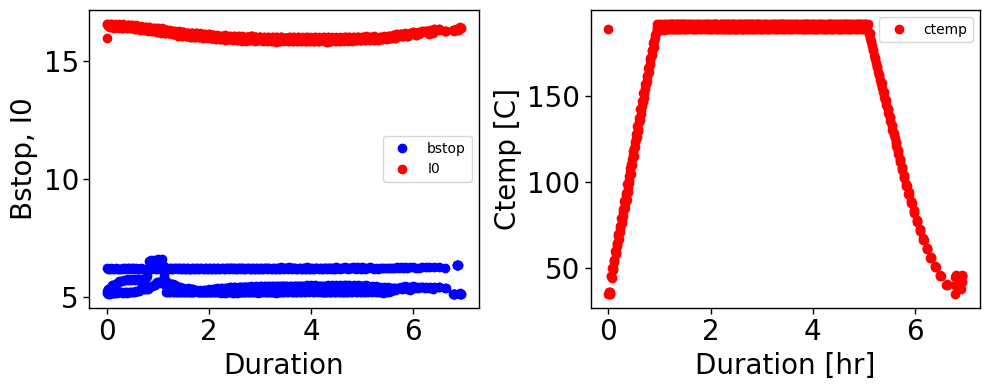

['Run26_Mix3_MeOH_DMEA_CoolingT190_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT190_ctr0/WAXS/*.raw [5.25921] [188.56841] [187954.17] [15.9906]
0.3288938501369555
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr0/WAXS/*.raw [5.12165] [35.501949] [194080.96] [16.32996]
0.3136351834297206
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr0/WAXS/*.raw [6.54226] [191.106] [173172.02] [16.23667]
0.40293114290060705
['Run26_Mix3_MeOH_DMEA_RampT30_ctr0_scan1'] Run26_Mix3_MeOH_DMEA_RampT30_ctr0/WAXS/*.raw [5.35831] [36.110989] [169699.21] [16.53712]
0.3240171202724537
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT190_ctr0_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT190_ctr0/WAXS/*.raw [5.50441] [189.9469] [187908.6] [16.04816]
0.34299321542158107
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr0_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr0/WAXS/*.raw [5.60702] [188.5009] [173126.59] [16.27106]
0.3446007820019102
['Run26_PET_BiaxFi

['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT170_ctr4_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT170_ctr4/WAXS/*.raw [5.4301] [171.4926] [188454.34] [15.87473]
0.3420593610096046
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr4_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr4/WAXS/*.raw [5.61814] [191.2229] [173422.97] [16.22285]
0.34631029689604476
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT50_ctr4_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT50_ctr4/WAXS/*.raw [5.16399] [55.139648] [170030.17] [16.51008]
0.31277801197813704
['Run26_PET_Fiber1_CoolingT170_ctr4_scan1'] Run26_PET_Fiber1_CoolingT170_ctr4/WAXS/*.raw [6.21177] [171.88451] [188476.9] [15.88267]
0.3911036368570272
['Run26_PET_Fiber1_HoldT190_ctr4_scan1'] Run26_PET_Fiber1_HoldT190_ctr4/WAXS/*.raw [6.19586] [188.354] [173445.62] [16.21718]
0.382055326511761
['Run26_PET_Fiber1_RampT50_ctr4_scan1'] Run26_PET_Fiber1_RampT50_ctr4/WAXS/*.raw [6.20307] [54.87439] [170052.81] [16.46589]
0.37672242435726216
['Run26_Mix3_MeOH_DMEA_CoolingT165_ctr5_sca

['Run26_PET_Fiber1_CoolingT155_ctr7_scan1'] Run26_PET_Fiber1_CoolingT155_ctr7/WAXS/*.raw [6.2431] [157.2357] [188910.63] [16.0176]
0.38976500849066026
['Run26_PET_Fiber1_HoldT190_ctr7_scan1'] Run26_PET_Fiber1_HoldT190_ctr7/WAXS/*.raw [6.19891] [191.774] [173668.28] [16.27024]
0.38099683839943355
['Run26_PET_Fiber1_RampT65_ctr7_scan1'] Run26_PET_Fiber1_RampT65_ctr7/WAXS/*.raw [6.20215] [68.91745] [170359.01] [16.48063]
0.3763296670090888
['Run26_Mix3_MeOH_DMEA_CoolingT150_ctr8_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT150_ctr8/WAXS/*.raw [5.19627] [149.47569] [189081.96] [15.95934]
0.32559429149325725
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr8_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr8/WAXS/*.raw [6.36683] [40.53302] [194371.4] [16.32002]
0.39012390916187606
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr8_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr8/WAXS/*.raw [5.52111] [188.6227] [173765.74] [16.1719]
0.34140144324414573
['Run26_Mix3_MeOH_DMEA_RampT70_ctr8_scan1'] Run26_Mix3_MeOH_DMEA_RampT70_ct

['Run26_PET_Fiber1_CoolingT135_ctr11_scan1'] Run26_PET_Fiber1_CoolingT135_ctr11/WAXS/*.raw [6.25088] [137.873] [189510.27] [16.04185]
0.3896607934870355
['Run26_PET_Fiber1_HoldT190_ctr11_scan1'] Run26_PET_Fiber1_HoldT190_ctr11/WAXS/*.raw [6.1947] [190.0979] [173965.23] [16.21416]
0.3820549445669711
['Run26_PET_Fiber1_RampT85_ctr11_scan1'] Run26_PET_Fiber1_RampT85_ctr11/WAXS/*.raw [6.23397] [87.471008] [170801.18] [16.5605]
0.37643609794390265
['Run26_Mix3_MeOH_DMEA_CoolingT130_ctr12_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT130_ctr12/WAXS/*.raw [5.25518] [130.3891] [189681.59] [15.99506]
0.3285501898711227
['Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr12_scan1'] Run26_Mix3_MeOH_DMEA_Hold40C_HoldT40_ctr12/WAXS/*.raw [5.15693] [45.423069] [194571.4] [16.4109]
0.31423809784959994
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr12_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr12/WAXS/*.raw [5.21087] [189.8736] [174061.7] [16.18417]
0.32197326152654104
['Run26_Mix3_MeOH_DMEA_RampT90_ctr12_scan1'] Run26_Mix3_MeOH_DMEA

['Run26_PET_Fiber1_CoolingT120_ctr14_scan1'] Run26_PET_Fiber1_CoolingT120_ctr14/WAXS/*.raw [6.21941] [123.3843] [189939.72] [15.97345]
0.38935921795228956
['Run26_PET_Fiber1_HoldT190_ctr14_scan1'] Run26_PET_Fiber1_HoldT190_ctr14/WAXS/*.raw [6.21942] [190.26579] [174185.47] [16.25521]
0.3826108675310869
['Run26_PET_Fiber1_RampT100_ctr14_scan1'] Run26_PET_Fiber1_RampT100_ctr14/WAXS/*.raw [6.23026] [101.4429] [171107.11] [16.51648]
0.3772147576239005
['Run26_Mix3_MeOH_DMEA_CoolingT115_ctr15_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT115_ctr15/WAXS/*.raw [5.34386] [116.5607] [190093.41] [16.11284]
0.3316522723492569
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr15_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr15/WAXS/*.raw [5.24118] [190.4566] [174281.65] [16.18351]
0.3238592863970795
['Run26_Mix3_MeOH_DMEA_RampT105_ctr15_scan1'] Run26_Mix3_MeOH_DMEA_RampT105_ctr15/WAXS/*.raw [5.74739] [104.8721] [171224.26] [16.46705]
0.34902365633188703
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT115_ctr15_scan1'] Run26_PET_BiaxFi

['Run26_PET_Fiber1_RampT120_ctr18_scan1'] Run26_PET_Fiber1_RampT120_ctr18/WAXS/*.raw [6.22166] [120.0988] [171508.26] [16.46445]
0.3778844723024456
['Run26_Mix3_MeOH_DMEA_CoolingT95_ctr19_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT95_ctr19/WAXS/*.raw [5.47373] [97.548027] [190683.91] [16.14797]
0.3389732579389236
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr19_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr19/WAXS/*.raw [5.23099] [188.6653] [174574.12] [16.16948]
0.3235100943258534
['Run26_Mix3_MeOH_DMEA_RampT125_ctr19_scan1'] Run26_Mix3_MeOH_DMEA_RampT125_ctr19/WAXS/*.raw [5.74687] [126.0023] [171639.0] [16.3765]
0.3509217476261717
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT95_ctr19_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT95_ctr19/WAXS/*.raw [5.37591] [98.006012] [190638.6] [16.15831]
0.33270249178286593
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr19_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr19/WAXS/*.raw [5.46763] [189.8817] [174529.49] [16.20343]
0.3374365797858848
['Run26_PET_BiaxFilm_MeOH_DMEA_R

['Run26_PET_Fiber1_CoolingT75_ctr23_scan1'] Run26_PET_Fiber1_CoolingT75_ctr23/WAXS/*.raw [6.24222] [78.211487] [191413.14] [16.11984]
0.38723833487181014
['Run26_PET_Fiber1_HoldT190_ctr23_scan1'] Run26_PET_Fiber1_HoldT190_ctr23/WAXS/*.raw [6.21281] [189.7928] [174844.88] [16.16651]
0.38430124992963854
['Run26_PET_Fiber1_RampT145_ctr23_scan1'] Run26_PET_Fiber1_RampT145_ctr23/WAXS/*.raw [6.22543] [144.1716] [172038.89] [16.45803]
0.37826094617642575
['Run26_Mix3_MeOH_DMEA_CoolingT70_ctr24_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT70_ctr24/WAXS/*.raw [5.4235] [71.940193] [191653.21] [16.16014]
0.3356097162524582
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr24_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr24/WAXS/*.raw [5.22292] [190.2511] [174941.71] [16.07577]
0.3248939242101623
['Run26_Mix3_MeOH_DMEA_RampT150_ctr24_scan1'] Run26_Mix3_MeOH_DMEA_RampT150_ctr24/WAXS/*.raw [5.74323] [151.7511] [172172.18] [16.35198]
0.35122535619539647
['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT70_ctr24_scan1'] Run26_PET_BiaxFilm_

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr27_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr27/WAXS/*.raw [5.36] [191.8573] [175116.2] [16.17102]
0.33145713752131906
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT165_ctr27_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT165_ctr27/WAXS/*.raw [5.34082] [166.3446] [172459.78] [16.35707]
0.3265144674443528
['Run26_PET_Fiber1_CoolingT55_ctr27_scan1'] Run26_PET_Fiber1_CoolingT55_ctr27/WAXS/*.raw [6.26326] [56.76379] [192384.19] [16.23116]
0.3858787665206923
['Run26_PET_Fiber1_HoldT190_ctr27_scan1'] Run26_PET_Fiber1_HoldT190_ctr27/WAXS/*.raw [6.20554] [188.9529] [175138.83] [16.14732]
0.3843077365160287
['Run26_PET_Fiber1_RampT165_ctr27_scan1'] Run26_PET_Fiber1_RampT165_ctr27/WAXS/*.raw [6.19305] [163.6673] [172482.44] [16.36879]
0.37834500900799634
['Run26_Mix3_MeOH_DMEA_CoolingT50_ctr28_scan1'] Run26_Mix3_MeOH_DMEA_CoolingT50_ctr28/WAXS/*.raw [5.43383] [51.058472] [192715.87] [16.36236]
0.33209329216567784
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr28_scan1'] Ru

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr32_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr32/WAXS/*.raw [5.34405] [190.91029] [175480.45] [16.07896]
0.3323629140193147
['Run26_PET_BiaxFilm_MeOH_DMEA_RampT190_ctr32_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_RampT190_ctr32/WAXS/*.raw [5.51919] [190.15331] [173051.97] [16.32902]
0.3379988511251747
['Run26_PET_Fiber1_HoldT190_ctr32_scan1'] Run26_PET_Fiber1_HoldT190_ctr32/WAXS/*.raw [6.1911] [191.13341] [175502.18] [16.06478]
0.385383428842474
['Run26_PET_Fiber1_RampT190_ctr32_scan1'] Run26_PET_Fiber1_RampT190_ctr32/WAXS/*.raw [6.19233] [188.46899] [173074.71] [16.30946]
0.37967719348157447
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr33_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr33/WAXS/*.raw [5.24111] [189.18159] [175597.24] [16.1931]
0.3236631651752907
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr33_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr33/WAXS/*.raw [5.33894] [191.83791] [175552.68] [16.03301]
0.33299673610881547
['Run26_PET_Fiber1_HoldT190

['Run26_PET_Fiber1_HoldT190_ctr44_scan1'] Run26_PET_Fiber1_HoldT190_ctr44/WAXS/*.raw [6.20892] [191.2202] [176384.96] [16.04893]
0.3868743897568249
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr45_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr45/WAXS/*.raw [5.22271] [189.77049] [176483.3] [16.04879]
0.325427025962705
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr45_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr45/WAXS/*.raw [5.26636] [191.89169] [176438.81] [15.97444]
0.32967415446175263
['Run26_PET_Fiber1_HoldT190_ctr45_scan1'] Run26_PET_Fiber1_HoldT190_ctr45/WAXS/*.raw [6.19316] [189.09399] [176460.6] [16.00104]
0.387047341922775
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr46_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr46/WAXS/*.raw [5.24095] [191.54829] [176557.15] [16.11551]
0.32521155086000997
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr46_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr46/WAXS/*.raw [5.29947] [191.09979] [176511.77] [16.13269]
0.32849264443809434
['Run26_PET_Fiber1_HoldT190_ctr46_scan1'] Ru

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr54_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr54/WAXS/*.raw [5.34178] [188.5407] [177101.73] [16.10778]
0.33162732542907836
['Run26_PET_Fiber1_HoldT190_ctr54_scan1'] Run26_PET_Fiber1_HoldT190_ctr54/WAXS/*.raw [6.24937] [191.564] [177124.37] [16.10801]
0.38796660791742743
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr55_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr55/WAXS/*.raw [5.234] [188.6788] [177221.36] [16.04454]
0.32621689372210105
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr55_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr55/WAXS/*.raw [5.34139] [189.6889] [177175.92] [16.06242]
0.33253955506081895
['Run26_PET_Fiber1_HoldT190_ctr55_scan1'] Run26_PET_Fiber1_HoldT190_ctr55/WAXS/*.raw [6.23101] [191.7531] [177198.66] [16.03347]
0.38862516972308553
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr56_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr56/WAXS/*.raw [5.20515] [188.69901] [177294.37] [15.96806]
0.32597259779835497
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr5

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr58_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr58/WAXS/*.raw [5.37571] [190.3231] [177399.39] [16.11068]
0.3336736872683214
['Run26_PET_Fiber1_HoldT190_ctr58_scan1'] Run26_PET_Fiber1_HoldT190_ctr58/WAXS/*.raw [6.2386] [190.6248] [177433.38] [16.06958]
0.38822420996690643
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr59_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr59/WAXS/*.raw [5.22739] [189.7182] [177529.05] [16.0146]
0.32641402220473814
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr59_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr59/WAXS/*.raw [5.35117] [188.83] [177484.05] [16.05025]
0.3334010373670192
['Run26_PET_Fiber1_HoldT190_ctr59_scan1'] Run26_PET_Fiber1_HoldT190_ctr59/WAXS/*.raw [6.23108] [191.85941] [177505.81] [16.04321]
0.3883935945487219
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr60_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr60/WAXS/*.raw [5.20826] [188.5154] [177601.48] [15.95687]
0.3263960914640528
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr60_sca

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr72_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr72/WAXS/*.raw [5.2123] [188.59801] [178482.42] [15.96024]
0.32658030205059574
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr72_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr72/WAXS/*.raw [5.40579] [189.8665] [178436.83] [15.99242]
0.33802201292862494


['Run26_PET_Fiber1_HoldT190_ctr72_scan1'] Run26_PET_Fiber1_HoldT190_ctr72/WAXS/*.raw [6.2217] [191.68559] [178459.49] [15.96147]
0.38979492490353335
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr73_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr73/WAXS/*.raw [5.19972] [188.96091] [178556.62] [15.91294]
0.32676048549168163
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr73_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr73/WAXS/*.raw [5.39045] [191.6422] [178511.07] [15.94917]
0.3379768351581932
['Run26_PET_Fiber1_HoldT190_ctr73_scan1'] Run26_PET_Fiber1_HoldT190_ctr73/WAXS/*.raw [6.18875] [190.2184] [178533.66] [15.91883]
0.38876914949151414
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr74_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr74/WAXS/*.raw [5.24817] [190.83299] [178630.92] [16.05268]
0.3269341941657094
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr74_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr74/WAXS/*.raw [5.41477] [191.6673] [178585.37] [15.98258]
0.33879198477342204
['Run26_PET_Fiber1_HoldT190_ctr74_scan1'] 

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr75_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr75/WAXS/*.raw [5.43328] [190.1689] [178658.8] [16.01248]
0.33931533403944925
['Run26_PET_Fiber1_HoldT190_ctr75_scan1'] Run26_PET_Fiber1_HoldT190_ctr75/WAXS/*.raw [6.2337] [188.8466] [178681.49] [16.01009]
0.3893607094026329


['Run26_Mix3_MeOH_DMEA_HoldT190_ctr76_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr76/WAXS/*.raw [5.2154] [191.2332] [178778.66] [15.92304]
0.32753795757594023


['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr76_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr76/WAXS/*.raw [5.41217] [188.6749] [178733.06] [15.97391]
0.33881310211463567
['Run26_PET_Fiber1_HoldT190_ctr76_scan1'] Run26_PET_Fiber1_HoldT190_ctr76/WAXS/*.raw [6.20237] [190.62219] [178755.66] [15.94234]
0.38905016453042657


['Run26_Mix3_MeOH_DMEA_HoldT190_ctr77_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr77/WAXS/*.raw [5.19831] [189.59689] [178850.98] [15.91172]
0.32669692528526145
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr77_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr77/WAXS/*.raw [5.40363] [188.8582] [178807.26] [15.92204]
0.33938050651800894
['Run26_PET_Fiber1_HoldT190_ctr77_scan1'] Run26_PET_Fiber1_HoldT190_ctr77/WAXS/*.raw [6.19795] [191.8911] [178828.97] [15.90626]
0.3896547648535859
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr78_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr78/WAXS/*.raw [5.24083] [188.5222] [178924.43] [16.04997]
0.32653207451478106
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr78_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr78/WAXS/*.raw [5.4035] [190.2849] [178879.65] [15.89809]
0.3398835960797807
['Run26_PET_Fiber1_HoldT190_ctr78_scan1'] Run26_PET_Fiber1_HoldT190_ctr78/WAXS/*.raw [6.25085] [191.4474] [178901.46] [16.05676]
0.3892970935605938
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr79_scan1']

['Run26_PET_Fiber1_HoldT190_ctr79_scan1'] Run26_PET_Fiber1_HoldT190_ctr79/WAXS/*.raw [6.2319] [190.0914] [178974.69] [15.99525]
0.3896094152951658


['Run26_Mix3_MeOH_DMEA_HoldT190_ctr80_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr80/WAXS/*.raw [5.22154] [190.743] [179070.78] [15.96017]
0.32716067560683876
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr80_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr80/WAXS/*.raw [5.44098] [191.7177] [179025.26] [15.98904]
0.34029435163086713
['Run26_PET_Fiber1_HoldT190_ctr80_scan1'] Run26_PET_Fiber1_HoldT190_ctr80/WAXS/*.raw [6.22503] [188.6481] [179047.95] [15.97827]
0.38959349166086193
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr81_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr81/WAXS/*.raw [5.20827] [191.8546] [179142.3] [15.8876]
0.32781980915934433
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr81_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr81/WAXS/*.raw [5.41871] [190.2943] [179098.47] [15.94424]
0.33985376537232254
['Run26_PET_Fiber1_HoldT190_ctr81_scan1'] Run26_PET_Fiber1_HoldT190_ctr81/WAXS/*.raw [6.20374] [188.79559] [179120.23] [15.90491]
0.3900518770618633
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr82_scan1']

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr94_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr94/WAXS/*.raw [5.2619] [191.37531] [180097.63] [16.03735]
0.328102834944676
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr94_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr94/WAXS/*.raw [5.41792] [188.7133] [180053.19] [15.89644]
0.340825996260798
['Run26_PET_Fiber1_HoldT190_ctr94_scan1'] Run26_PET_Fiber1_HoldT190_ctr94/WAXS/*.raw [6.18949] [190.56129] [180074.89] [15.86461]
0.39014447881164427
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr95_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr95/WAXS/*.raw [5.23711] [189.65221] [180171.81] [15.99102]
0.32750318616323415
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr95_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr95/WAXS/*.raw [5.47409] [188.7433] [180126.52] [16.02178]
0.3416655327934849
['Run26_PET_Fiber1_HoldT190_ctr95_scan1'] Run26_PET_Fiber1_HoldT190_ctr95/WAXS/*.raw [6.24136] [191.8506] [180149.09] [16.02447]
0.38948932476393916
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr96_scan1']

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr105_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr105/WAXS/*.raw [5.45259] [190.0986] [180860.22] [15.92816]
0.34232390935299495
['Run26_PET_Fiber1_HoldT190_ctr105_scan1'] Run26_PET_Fiber1_HoldT190_ctr105/WAXS/*.raw [6.21802] [189.01559] [180882.83] [15.94665]
0.38992641087626556
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr106_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr106/WAXS/*.raw [5.20669] [191.0511] [180979.79] [15.89764]
0.32751339192483914
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr106_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr106/WAXS/*.raw [5.44015] [188.58749] [180934.21] [15.90478]
0.34204497012847707
['Run26_PET_Fiber1_HoldT190_ctr106_scan1'] Run26_PET_Fiber1_HoldT190_ctr106/WAXS/*.raw [6.19234] [190.88029] [180956.94] [15.85637]
0.3905269617194856
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr107_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr107/WAXS/*.raw [5.24906] [189.19341] [181054.16] [15.9934]
0.32820163317368417
['Run26_PET_BiaxFilm_MeOH_DM

['Run26_PET_Fiber1_HoldT190_ctr119_scan1'] Run26_PET_Fiber1_HoldT190_ctr119/WAXS/*.raw [6.26462] [191.82561] [181912.64] [16.03245]
0.39074626772576865
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr120_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr120/WAXS/*.raw [5.23754] [188.6757] [182007.87] [15.96924]
0.3279767853698736
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr120_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr120/WAXS/*.raw [5.47579] [191.40311] [181963.42] [15.98664]
0.34252288160614114
['Run26_PET_Fiber1_HoldT190_ctr120_scan1'] Run26_PET_Fiber1_HoldT190_ctr120/WAXS/*.raw [6.24177] [190.7097] [181985.91] [15.95353]
0.3912469528687381
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr121_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr121/WAXS/*.raw [5.2254] [189.99339] [182081.48] [15.9223]
0.3281812300986666
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr121_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr121/WAXS/*.raw [5.4632] [191.87199] [182035.79] [15.93142]
0.34291984016490684
['Run26_PET_Fiber1_HoldT190_ctr1

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr132_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr132/WAXS/*.raw [5.2403] [188.5238] [182883.1] [15.97476]
0.32803622714832653
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr132_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr132/WAXS/*.raw [5.48439] [190.9406] [182838.49] [15.99338]
0.34291625660116876
['Run26_PET_Fiber1_HoldT190_ctr132_scan1'] Run26_PET_Fiber1_HoldT190_ctr132/WAXS/*.raw [6.23811] [191.1252] [182861.05] [15.99648]
0.3899676678869351
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr133_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr133/WAXS/*.raw [5.23106] [189.46021] [182955.51] [15.94428]
0.3280838018399075
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr133_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr133/WAXS/*.raw [5.47773] [191.888] [182910.95] [15.95144]
0.34340034504721834
['Run26_PET_Fiber1_HoldT190_ctr133_scan1'] Run26_PET_Fiber1_HoldT190_ctr133/WAXS/*.raw [6.2395] [189.59689] [182933.54] [15.93595]
0.39153611802245863
['Run26_Mix3_MeOH_DMEA_HoldT190_ct

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr142_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr142/WAXS/*.raw [5.45273] [188.73621] [183577.58] [15.8982]
0.3429778213885849
['Run26_PET_Fiber1_HoldT190_ctr142_scan1'] Run26_PET_Fiber1_HoldT190_ctr142/WAXS/*.raw [6.21267] [191.8335] [183600.19] [15.89088]
0.3909582099921465


['Run26_Mix3_MeOH_DMEA_HoldT190_ctr143_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr143/WAXS/*.raw [5.25595] [188.5069] [183696.65] [16.00948]
0.32830235585415646


['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr143_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr143/WAXS/*.raw [5.44579] [190.2919] [183651.05] [15.8369]
0.3438671709741174
['Run26_PET_Fiber1_HoldT190_ctr143_scan1'] Run26_PET_Fiber1_HoldT190_ctr143/WAXS/*.raw [6.1933] [191.4523] [183673.73] [15.85074]
0.39072623738702417
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr144_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr144/WAXS/*.raw [5.24966] [189.3497] [183771.06] [15.96903]
0.32874006749314144
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr144_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr144/WAXS/*.raw [5.50308] [191.83299] [183725.53] [15.99894]
0.34396528770031015
['Run26_PET_Fiber1_HoldT190_ctr144_scan1'] Run26_PET_Fiber1_HoldT190_ctr144/WAXS/*.raw [6.26031] [189.7323] [183748.1] [15.97937]
0.39177451927078477
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr145_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr145/WAXS/*.raw [5.24483] [191.3271] [183845.42] [15.92504]
0.32934485564871424
['Run26_PET_BiaxFilm_MeOH_DMEA_Ho

['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr153_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr153/WAXS/*.raw [5.48228] [188.7269] [184392.41] [15.95045]
0.3437069173596983
['Run26_PET_Fiber1_HoldT190_ctr153_scan1'] Run26_PET_Fiber1_HoldT190_ctr153/WAXS/*.raw [6.2409] [191.8374] [184414.98] [15.95296]
0.39120639680661146
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr154_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr154/WAXS/*.raw [5.21883] [188.4996] [184511.75] [15.86931]
0.3288630696608737
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr154_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr154/WAXS/*.raw [5.46264] [190.3278] [184466.12] [15.88976]
0.34378366948273603
['Run26_PET_Fiber1_HoldT190_ctr154_scan1'] Run26_PET_Fiber1_HoldT190_ctr154/WAXS/*.raw [6.22237] [191.409] [184488.74] [15.8848]
0.391718498186946
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr155_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr155/WAXS/*.raw [5.24383] [189.36929] [184585.86] [15.91481]
0.329493723142155
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT19

['Run26_PET_Fiber1_HoldT190_ctr166_scan1'] Run26_PET_Fiber1_HoldT190_ctr166/WAXS/*.raw [6.22116] [190.1749] [185375.0] [15.89284]
0.39144419751284226
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr167_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr167/WAXS/*.raw [5.20963] [190.9906] [185472.6] [15.83198]
0.32905738890524117
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr167_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr167/WAXS/*.raw [5.45964] [191.6234] [185426.87] [15.87846]
0.3438393899660295
['Run26_PET_Fiber1_HoldT190_ctr167_scan1'] Run26_PET_Fiber1_HoldT190_ctr167/WAXS/*.raw [6.20008] [188.5829] [185449.61] [15.84477]
0.39130135685150363
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr168_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr168/WAXS/*.raw [5.24855] [191.89999] [185546.41] [15.96786]
0.3286946403588208
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr168_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr168/WAXS/*.raw [5.50539] [189.98421] [185501.57] [16.02298]
0.34359338899505587
['Run26_PET_Fiber1_HoldT190_ctr1

['Run26_Mix3_MeOH_DMEA_HoldT190_ctr180_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr180/WAXS/*.raw [5.26765] [190.28889] [186439.58] [15.99218]
0.329389113929433
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr180_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr180/WAXS/*.raw [5.51055] [188.5222] [186393.81] [16.03148]
0.34373308016477583
['Run26_PET_Fiber1_HoldT190_ctr180_scan1'] Run26_PET_Fiber1_HoldT190_ctr180/WAXS/*.raw [6.2638] [191.5569] [186416.6] [16.00229]
0.3914314763699446
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr181_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr181/WAXS/*.raw [5.23737] [188.6123] [186514.04] [15.94405]
0.32848429351388136
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr181_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr181/WAXS/*.raw [5.50544] [189.79449] [186468.28] [16.00051]
0.3440790324808397
['Run26_PET_Fiber1_HoldT190_ctr181_scan1'] Run26_PET_Fiber1_HoldT190_ctr181/WAXS/*.raw [6.24718] [191.69431] [186491.08] [15.96412]
0.39132629922601436
['Run26_Mix3_MeOH_DMEA_HoldT190_c

['Run26_PET_Fiber1_HoldT190_ctr190_scan1'] Run26_PET_Fiber1_HoldT190_ctr190/WAXS/*.raw [6.23538] [190.01891] [187157.53] [15.94588]
0.3910339222419835
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr191_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr191/WAXS/*.raw [5.21745] [189.99651] [187255.1] [15.87669]
0.3286232835685524
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr191_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr191/WAXS/*.raw [5.47148] [188.5777] [187209.37] [15.89178]
0.34429623365035256
['Run26_PET_Fiber1_HoldT190_ctr191_scan1'] Run26_PET_Fiber1_HoldT190_ctr191/WAXS/*.raw [6.20986] [191.69749] [187232.07] [15.89025]
0.3907968722959047
['Run26_Mix3_MeOH_DMEA_HoldT190_ctr192_scan1'] Run26_Mix3_MeOH_DMEA_HoldT190_ctr192/WAXS/*.raw [5.25549] [188.5424] [187329.59] [16.01002]
0.3282625505777007
['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr192_scan1'] Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr192/WAXS/*.raw [5.47062] [190.0616] [187283.77] [15.92971]
0.343422447740731
['Run26_PET_Fiber1_HoldT190_ctr192

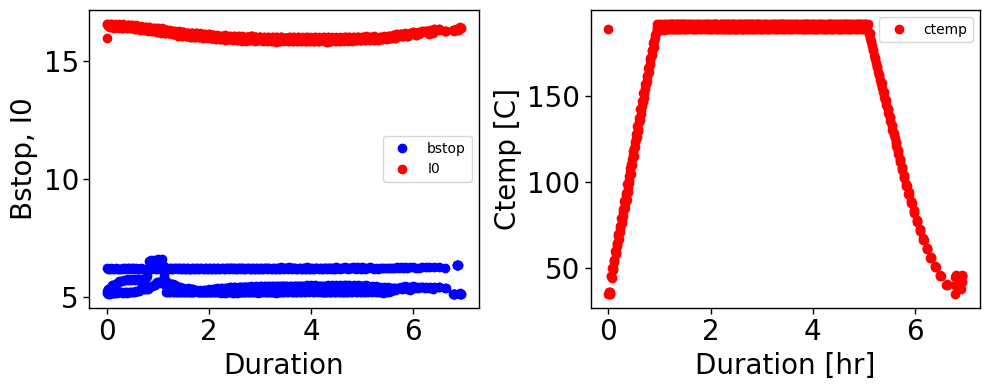

In [163]:
raw_dir_meth = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/May2024/'
# Run 23c
common_keyword = "Run23rep"  # folder name
keyword = "Run23r*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_meth, common_keyword, keyword)

    
#process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
#process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# Run 23rep
common_keyword = "Run23c"  # folder name
keyword = "Run23c*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_meth, common_keyword, keyword)

    
#process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
#process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run 24
common_keyword = "Run24"  # folder name
keyword = "Run24*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_meth, common_keyword, keyword)

    
#process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
#process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run 25
common_keyword = "Run25"  # folder name
keyword = "Run25*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_meth, common_keyword, keyword)

    
#process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
#process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)



# Run 25
common_keyword = "Run27"  # folder name
keyword = "Run27*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_meth, common_keyword, keyword)

    
#process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
#process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)

# Run 26
common_keyword = "Run26"  # folder name
keyword = "Run26*" # file name

keywords, SAXS_folder_name, WAXS_folder_name,data_folder = get_keywords(raw_dir_meth, common_keyword, keyword)

    
process_SAXS_data(SAXS_folder_name, keywords, data_folder, ai)
process_WAXS_data(WAXS_folder_name, keywords, data_folder, ai_w)


# plotting

['test_Nylon66_T*_all']


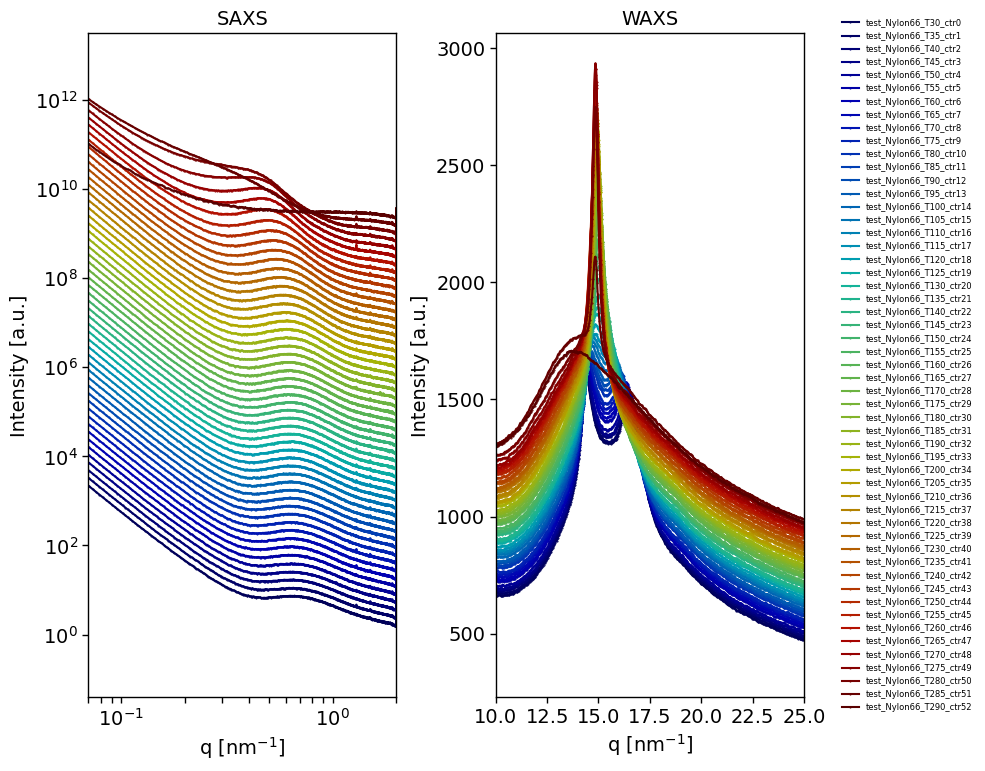

['Run6_Nylon66_AcOH_T*_all']


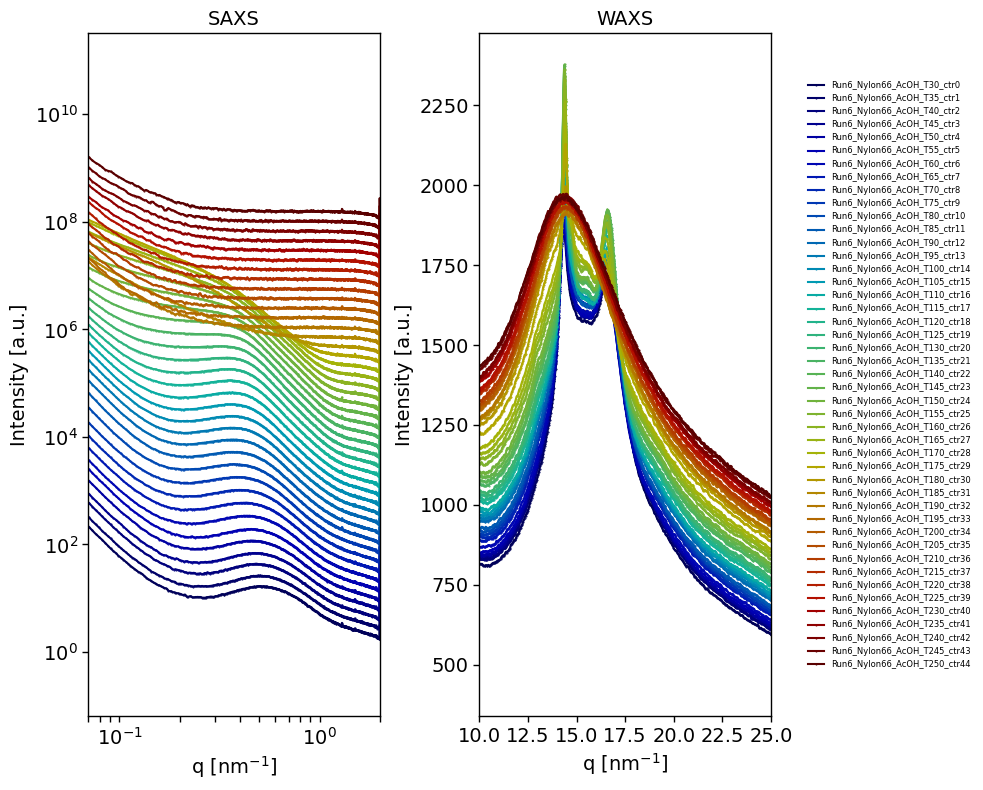

['Run7_PET_T*_all']


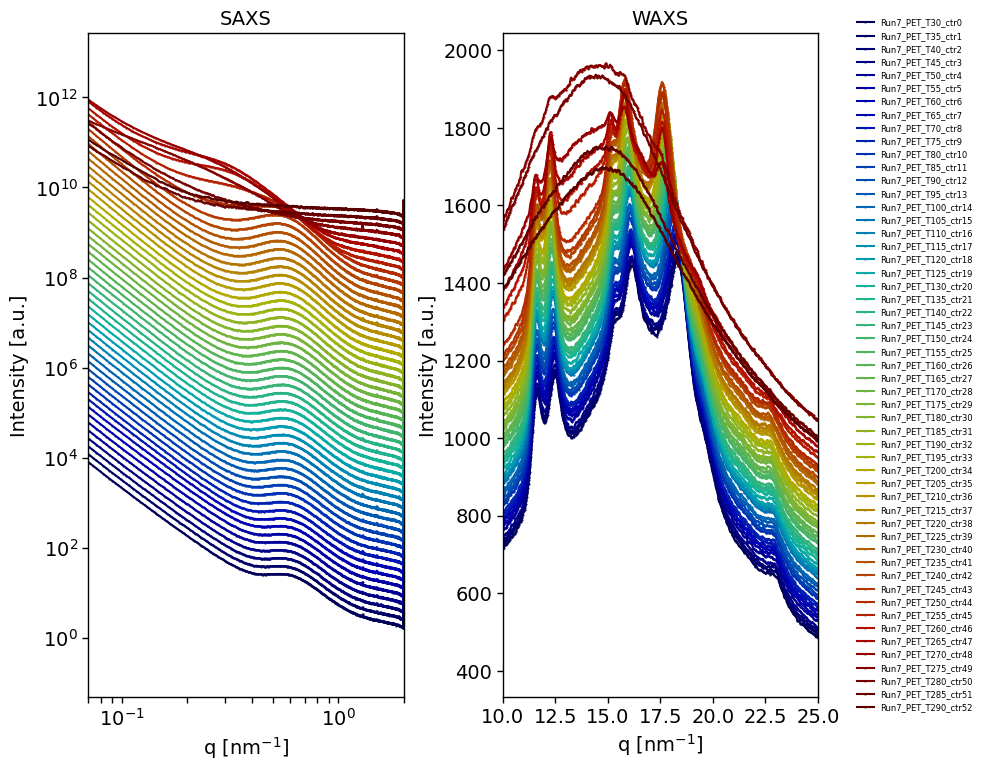

['Run8c_PET_AcOH_T*_all']


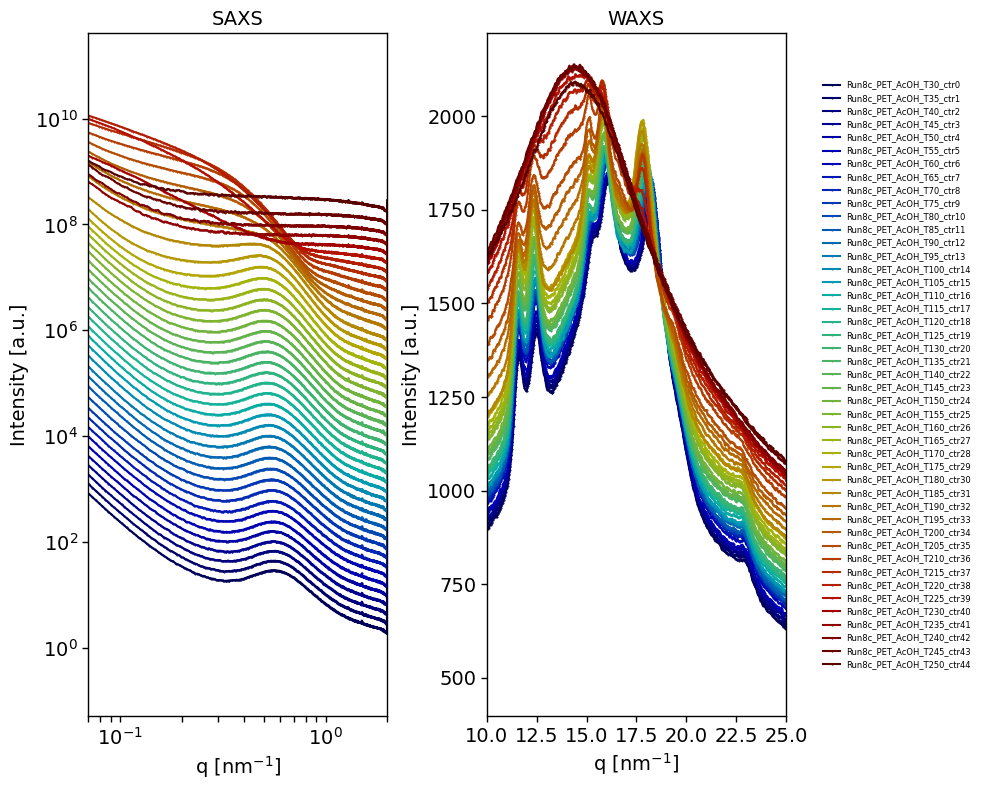

['Run11_Nylon66_T*_all']


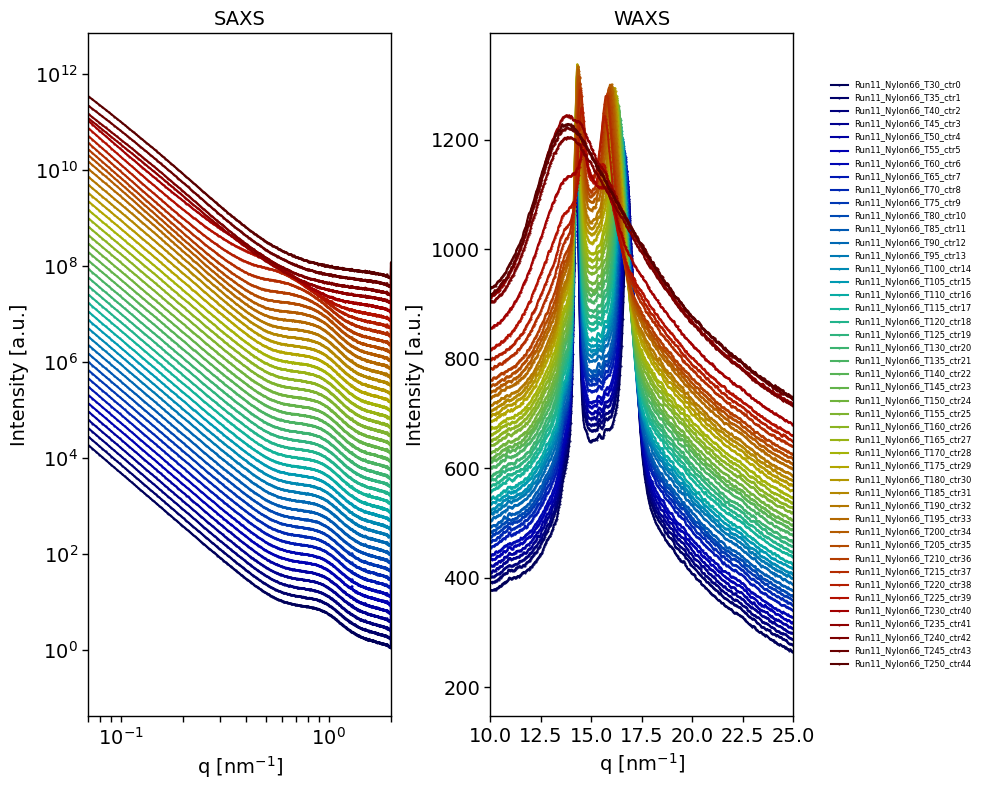

['Run12_Nylon6_AcOH_T*_all']


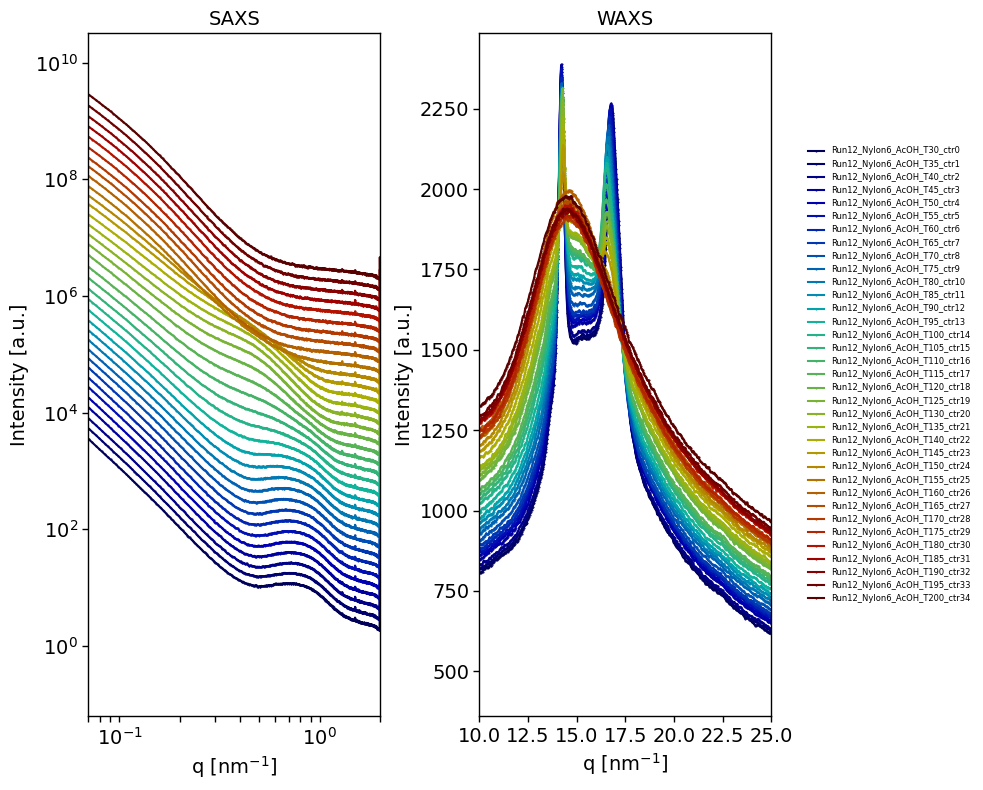

['Run15_Nylon6_AcOH_RampT*_all']


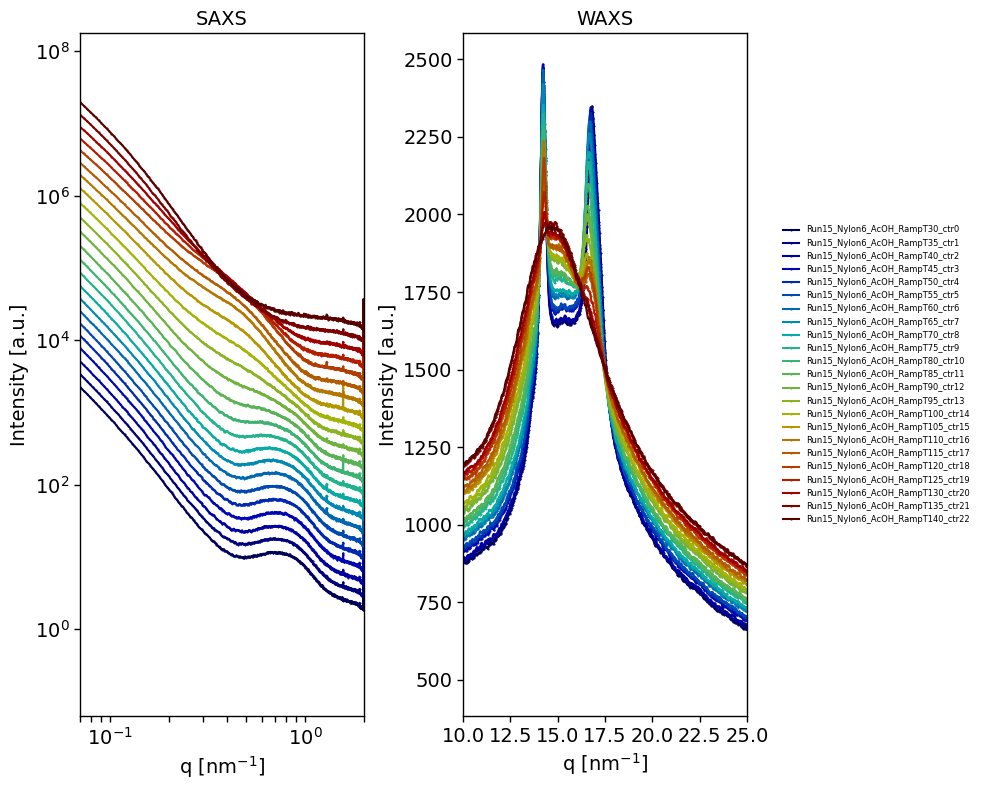

['Run13_Nylon6_AcOH_RampT*_all', 'Run13_Nylon6_AcOH_HoldT120_ctr0_all', 'Run13_Nylon6_AcOH_HoldT120_ctr20_all', 'Run13_Nylon6_AcOH_HoldT120_ctr40_all', 'Run13_Nylon6_AcOH_HoldT120_ctr60_all', 'Run13_Nylon6_AcOH_HoldT120_ctr80_all', 'Run13_Nylon6_AcOH_HoldT120_ctr100_all', 'Run13_Nylon6_AcOH_HoldT120_ctr120_all', 'Run13_Nylon6_AcOH_HoldT120_ctr140_all', 'Run13_Nylon6_AcOH_HoldT120_ctr160_all', 'Run13_Nylon6_AcOH_HoldT120_ctr180_all', 'Run13_Nylon6_AcOH_HoldT120_ctr200_all', 'Run13_Nylon6_AcOH_HoldT120_ctr220_all', 'Run13_Nylon6_AcOH_HoldT120_ctr240_all', 'Run13_Nylon6_AcOH_HoldT120_ctr260_all', 'Run13_Nylon6_AcOH_HoldT120_ctr280_all', 'Run13_Nylon6_AcOH_HoldT120_ctr300_all', 'Run13_Nylon6_AcOH_HoldT120_ctr320_all', 'Run13_Nylon6_AcOH_HoldT120_ctr399_all']


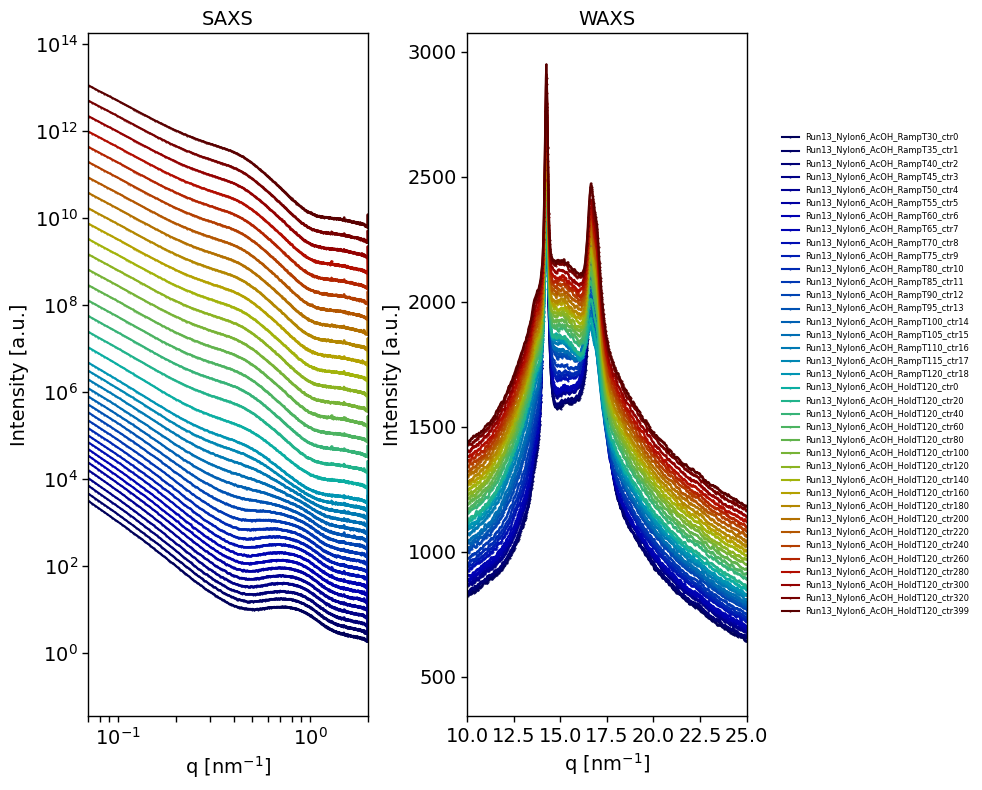

['Run13b_Nylon6_AcOH_RampT*_all', 'Run13b_Nylon6_AcOH_HoldT110*_ctr0_all', 'Run13b_Nylon6_AcOH_HoldT110_*ctr20_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr40_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr60_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr80_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr100_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr120_all', 'Run13b_Nylon6_AcOH_CoolingT*_all']


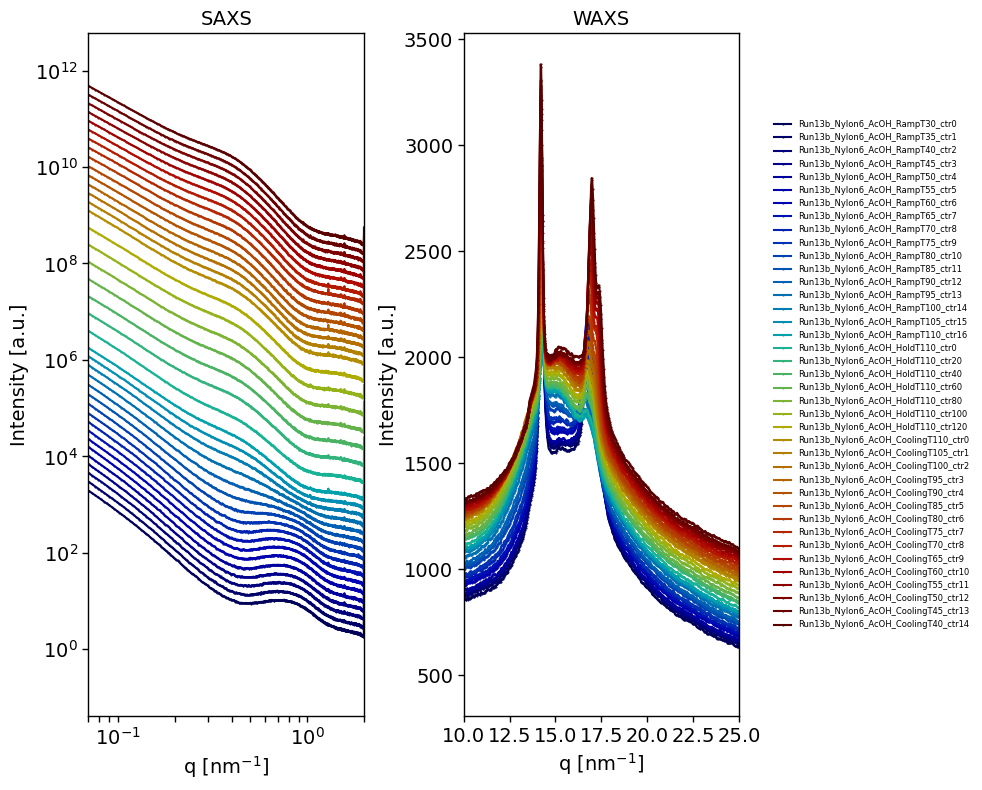

['Run17_Nylon66_AcOH_RampT*_all', 'Run17_Nylon66_AcOH_HoldT180_ctr0_all', 'Run17_Nylon66_AcOH_HoldT180_ctr20_all', 'Run17_Nylon66_AcOH_HoldT180_ctr40_all', 'Run17_Nylon66_AcOH_HoldT180_ctr60_all', 'Run17_Nylon66_AcOH_HoldT180_ctr80_all', 'Run17_Nylon66_AcOH_HoldT180_ctr100_all', 'Run17_Nylon66_AcOH_HoldT180_ctr120_all', 'Run17_Nylon66_AcOH_HoldT180_ctr140_all', 'Run17_Nylon66_AcOH_HoldT180_ctr160_all', 'Run17_Nylon66_AcOH_HoldT180_ctr180_all', 'Run17_Nylon66_AcOH_HoldT180_ctr200_all', 'Run17_Nylon66_AcOH_HoldT180_ctr220_all', 'Run17_Nylon66_AcOH_HoldT180_ctr240_all', 'Run17_Nylon66_AcOH_HoldT180_ctr260_all', 'Run17_Nylon66_AcOH_HoldT180_ctr280_all', 'Run17_Nylon66_AcOH_HoldT180_ctr300_all', 'Run17_Nylon66_AcOH_HoldT180_ctr320_all', 'Run17_Nylon66_AcOH_HoldT180_ctr399_all', 'Run17_Nylon66_AcOH_CoolingT*_all']


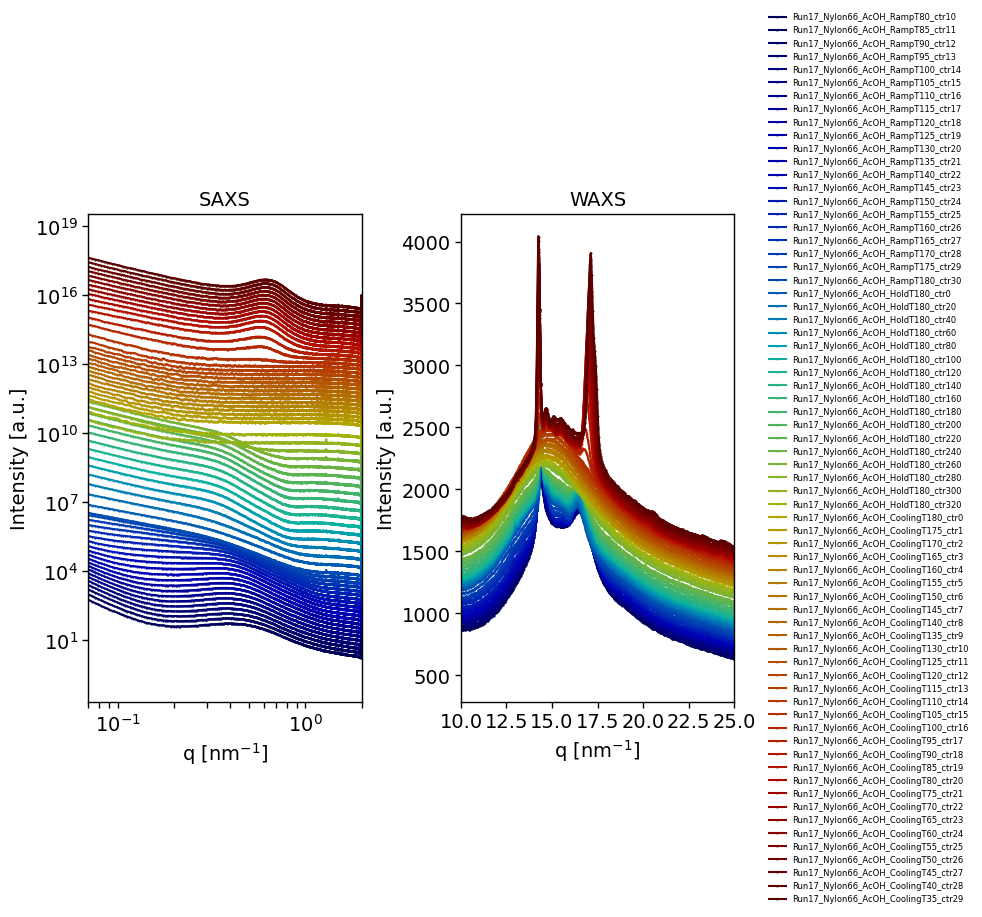

['Run24_PET_MeOH_RampT*_all', 'Run24_PET_MeOH_HoldT190*_ctr0_all', 'Run24_PET_MeOH_HoldT190_ctr20_all', 'Run24_PET_MeOH_HoldT190_ctr40_all', 'Run24_PET_MeOH_HoldT190_ctr60_all', 'Run24_PET_MeOH_HoldT190_ctr80_all', 'Run24_PET_MeOH_HoldT190_ctr100_all', 'Run24_PET_MeOH_HoldT190_ctr120_all', 'Run24_PET_MeOH_HoldT190_ctr140_all', 'Run24_PET_MeOH_HoldT190_ctr160_all', 'Run24_PET_MeOH_HoldT190_ctr180_all', 'Run24_PET_MeOH_HoldT190_ctr199_all', 'Run24_PET_MeOH_CoolingT*_all']


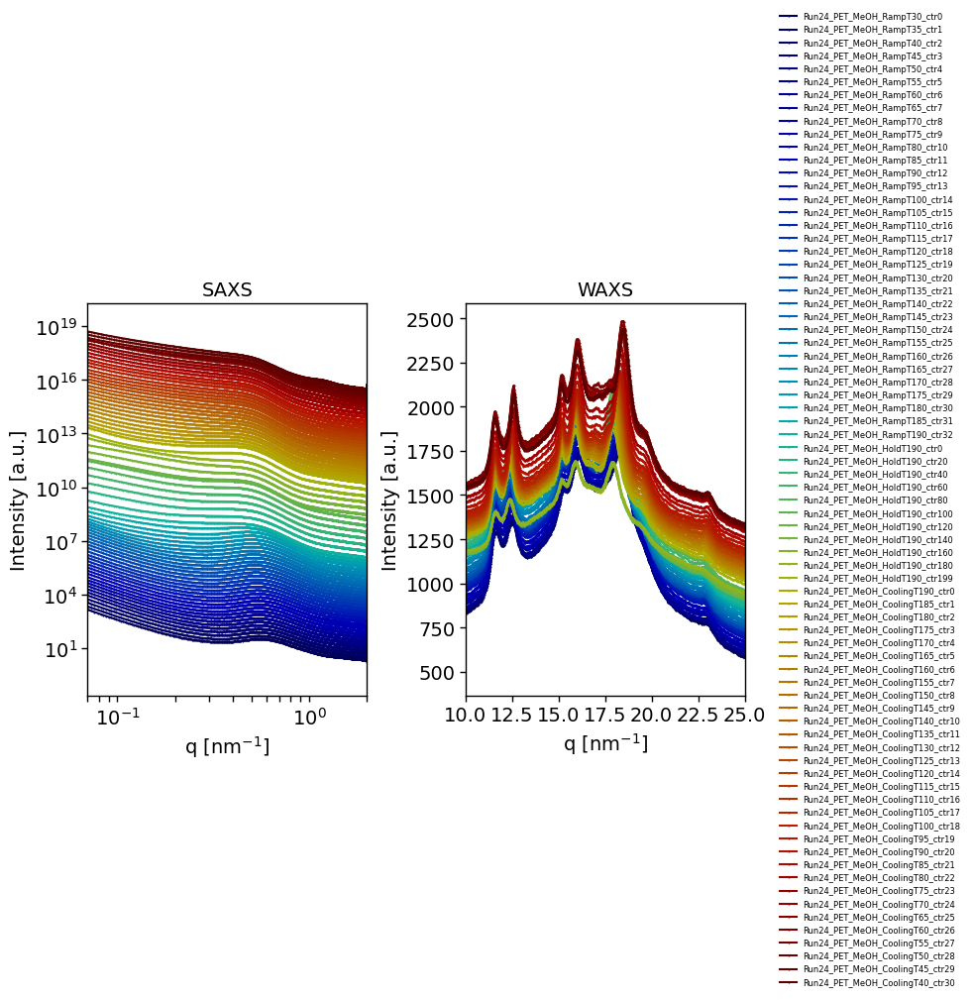

['Run24_PET_RampT*_all', 'Run24_PET_HoldT190_ctr0_all', 'Run24_PET_HoldT190_ctr20_all', 'Run24_PET_HoldT190_ctr40_all', 'Run24_PET_HoldT190_ctr60_all', 'Run24_PET_HoldT190_ctr80_all', 'Run24_PET_HoldT190_ctr100_all', 'Run24_PET_HoldT190_ctr120_all', 'Run24_PET_HoldT190_ctr140_all', 'Run24_PET_HoldT190_ctr160_all', 'Run24_PET_HoldT190_ctr180_all', 'Run24_PET_HoldT190_ctr199_all', 'Run24_PET_CoolingT*_all']


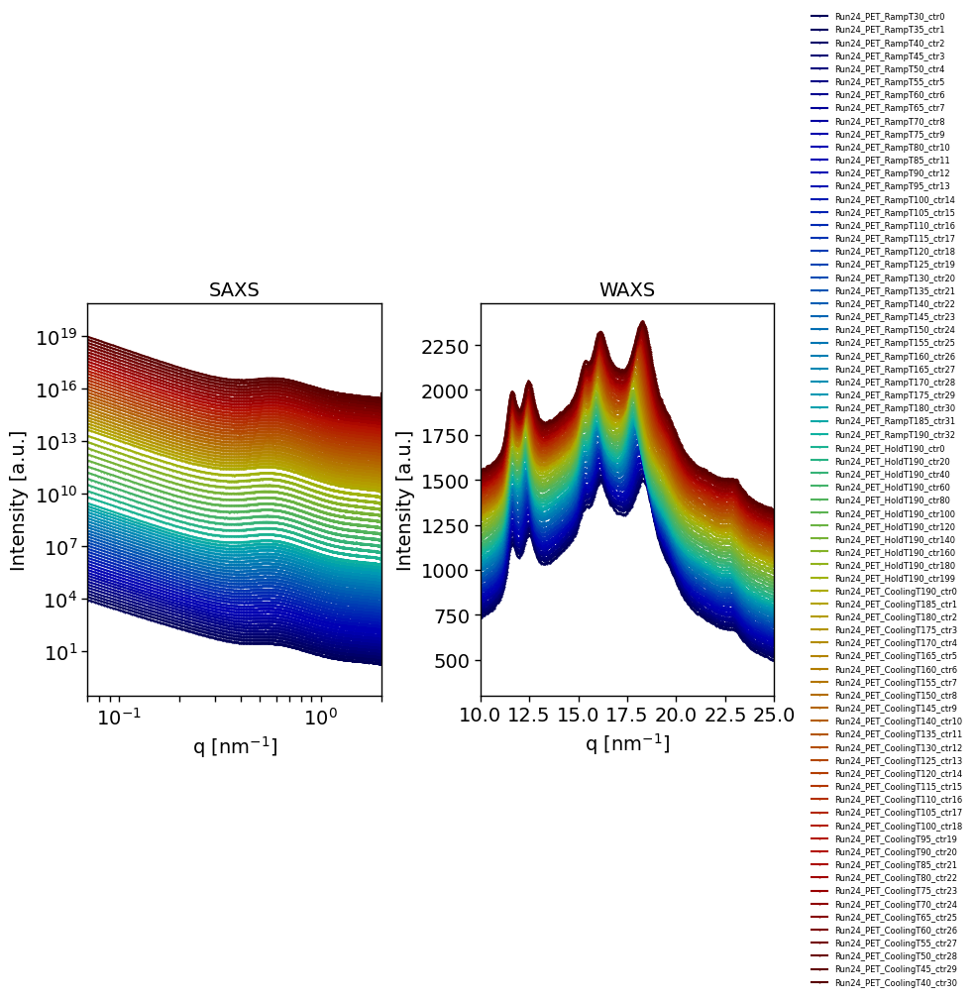

['Run23c_PET_MeOH_DMEA_RampT*_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr0_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr20_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr40_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr60_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr80_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr100_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr120_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr140_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr160_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr180_all', 'Run23c_PET_MeOH_DMEA_HoldT190_ctr199_all', 'Run23c_PET_MeOH_DMEA_CoolingT*_all']


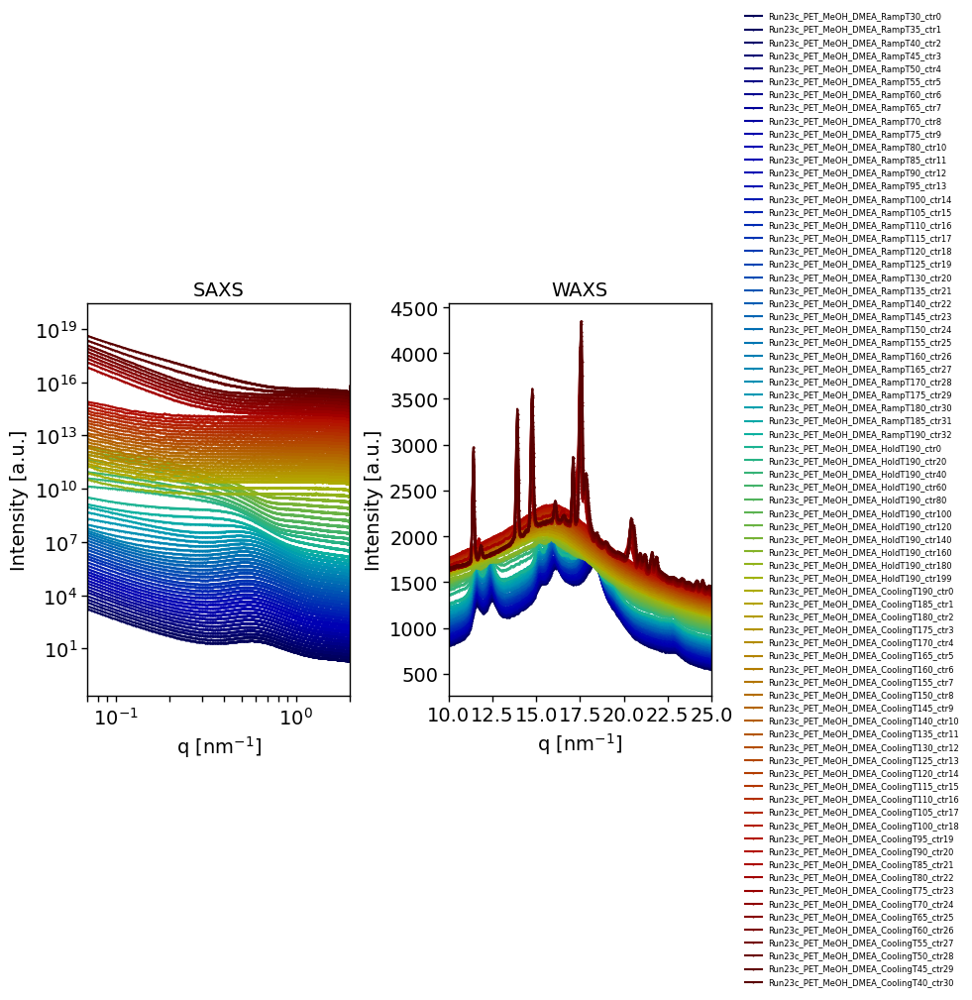

['Run25_PET_Fiber1_RampT*_all', 'Run25_PET_Fiber1_HoldT190*_ctr0_all', 'Run25_PET_Fiber1_HoldT190_ctr20_all', 'Run25_PET_Fiber1_HoldT190_ctr40_all', 'Run25_PET_Fiber1_HoldT190_ctr60_all', 'Run25_PET_Fiber1_HoldT190_ctr80_all', 'Run25_PET_Fiber1_HoldT190_ctr100_all', 'Run25_PET_Fiber1_HoldT190_ctr120_all', 'Run25_PET_Fiber1_HoldT190_ctr140_all', 'Run25_PET_Fiber1_HoldT190_ctr160_all', 'Run25_PET_Fiber1_HoldT190_ctr180_all', 'Run25_PET_Fiber1_HoldT190_ctr199_all', 'Run25_PET_Fiber1_CoolingT*_all']


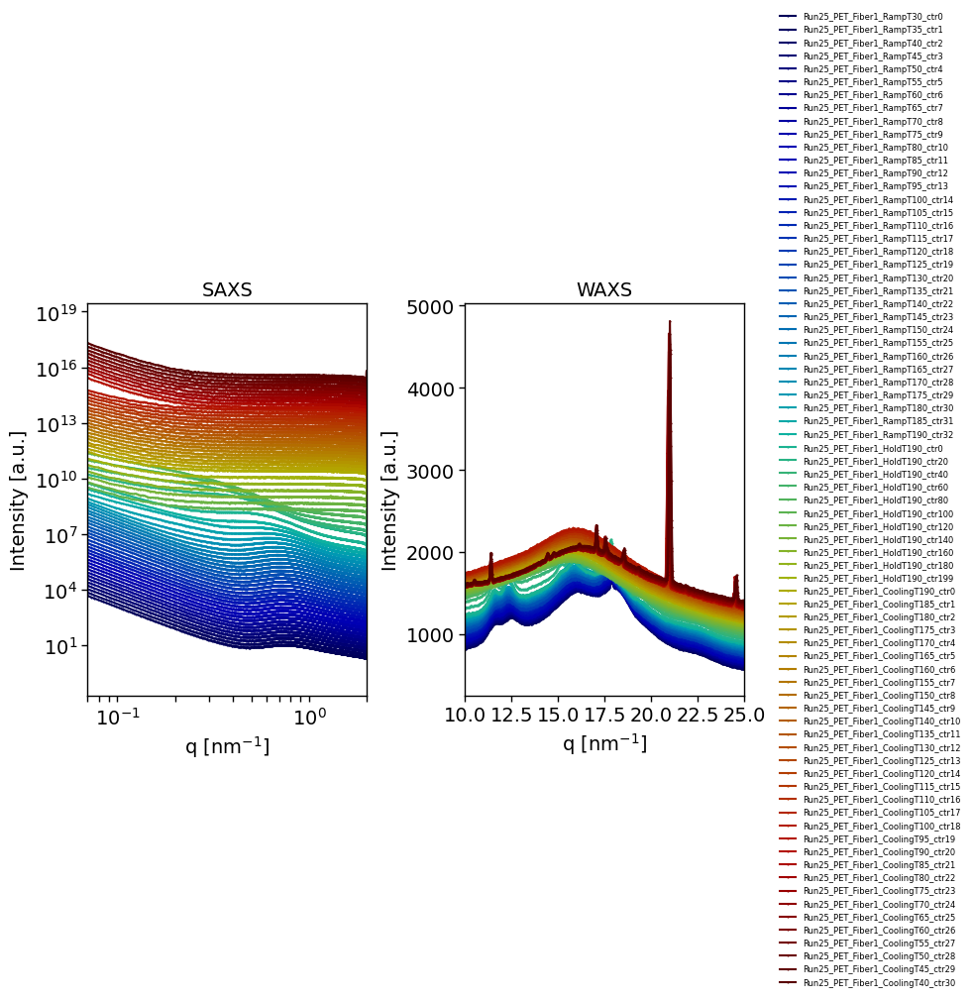

['Run26_PET_Fiber1_RampT*_all', 'Run26_PET_Fiber1_HoldT190*_ctr0_all', 'Run26_PET_Fiber1_HoldT190_ctr20_all', 'Run26_PET_Fiber1_HoldT190_ctr40_all', 'Run26_PET_Fiber1_HoldT190_ctr60_all', 'Run26_PET_Fiber1_HoldT190_ctr80_all', 'Run26_PET_Fiber1_HoldT190_ctr100_all', 'Run26_PET_Fiber1_HoldT190_ctr120_all', 'Run26_PET_Fiber1_HoldT190_ctr140_all', 'Run26_PET_Fiber1_HoldT190_ctr160_all', 'Run26_PET_Fiber1_HoldT190_ctr180_all', 'Run26_PET_Fiber1_HoldT190_ctr199_all', 'Run26_PET_Fiber1_CoolingT*_all']


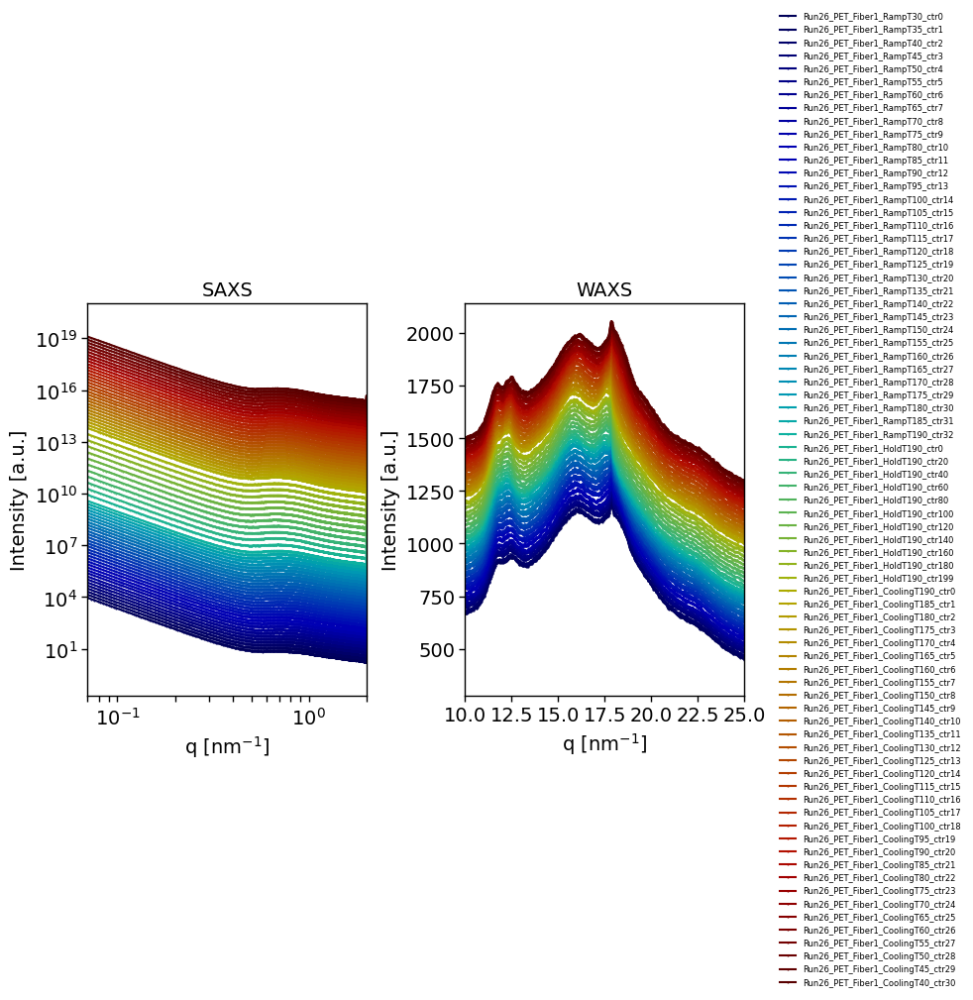

['Run26_PET_BiaxFilm_MeOH_DMEA_RampT*_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr0_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr20_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr40_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr60_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr80_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr100_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr120_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr140_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr160_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr180_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr199_all', 'Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT*_all']


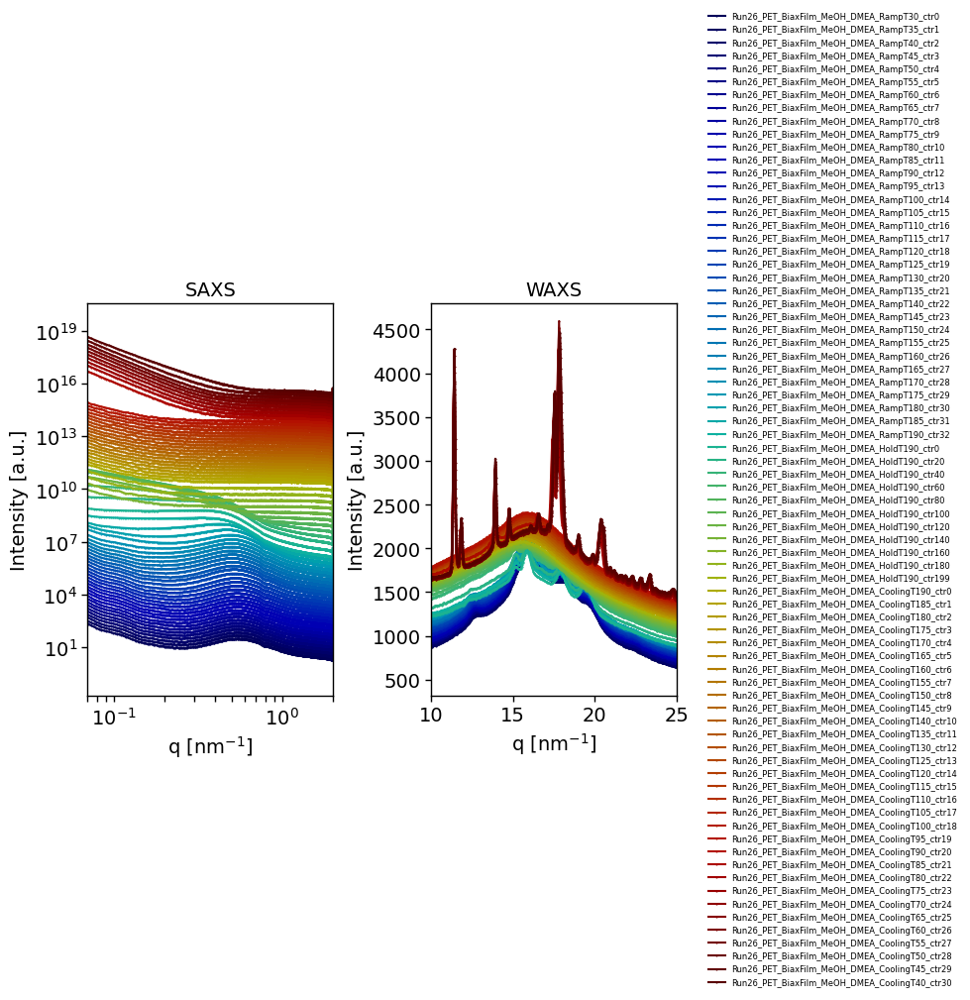

['Run26_Mix3_MeOH_DMEA_RampT*_all', 'Run26_Mix3_MeOH_DMEA_HoldT190*_ctr0_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr20_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr40_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr60_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr80_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr100_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr120_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr140_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr160_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr180_all', 'Run26_Mix3_MeOH_DMEA_HoldT190_ctr199_all', 'Run26_Mix3_MeOH_DMEA_CoolingT*_all']


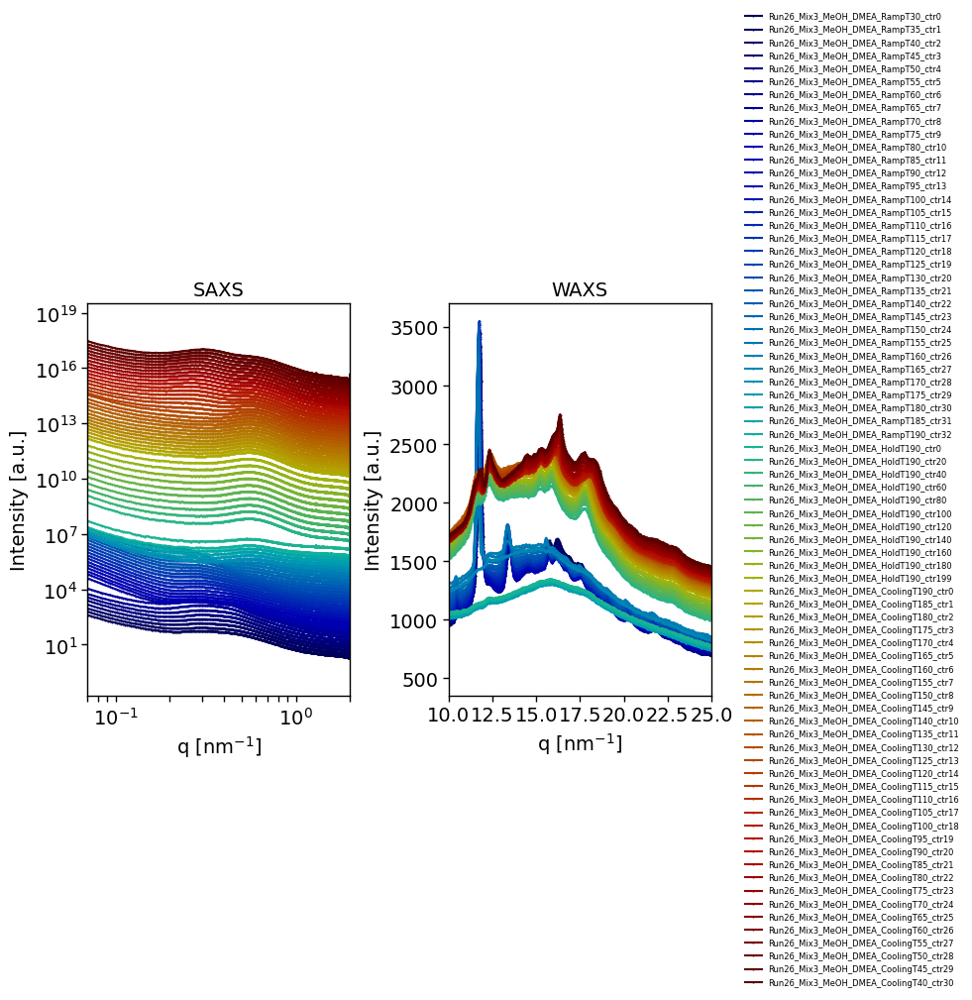

['Run27_Mix3_MeOH_RampT*_all', 'Run27_Mix3_MeOH_HoldT190*_ctr0_all', 'Run27_Mix3_MeOH_HoldT190_ctr20_all', 'Run27_Mix3_MeOH_HoldT190_ctr40_all', 'Run27_Mix3_MeOH_HoldT190_ctr60_all', 'Run27_Mix3_MeOH_HoldT190_ctr80_all', 'Run27_Mix3_MeOH_HoldT190_ctr100_all', 'Run27_Mix3_MeOH_HoldT190_ctr120_all', 'Run27_Mix3_MeOH_HoldT190_ctr140_all', 'Run27_Mix3_MeOH_HoldT190_ctr160_all', 'Run27_Mix3_MeOH_HoldT190_ctr180_all', 'Run27_Mix3_MeOH_HoldT190_ctr199_all', 'Run27_Mix3_MeOH_CoolingT*_all']


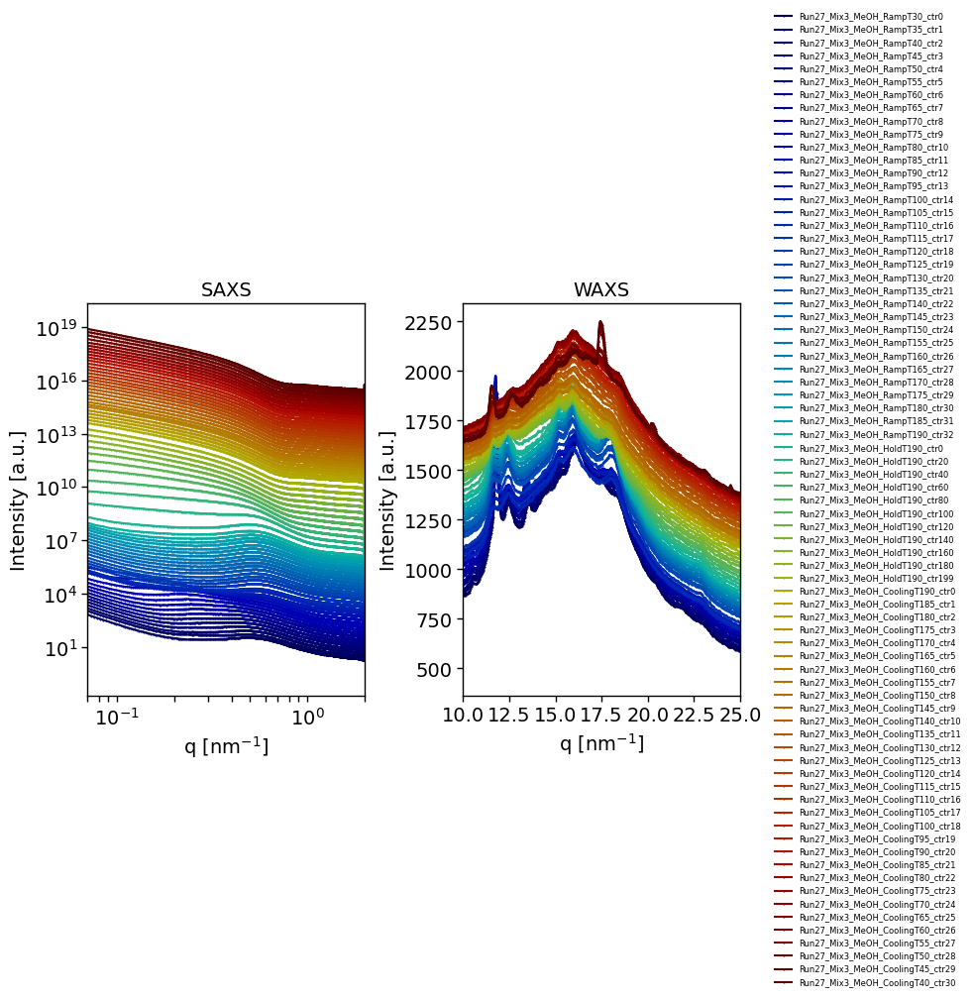

['Run27_Mix3_RampT*_all', 'Run27_Mix3_HoldT190*_ctr0_all', 'Run27_Mix3_HoldT190_ctr20_all', 'Run27_Mix3_HoldT190_ctr40_all', 'Run27_Mix3_HoldT190_ctr60_all', 'Run27_Mix3_HoldT190_ctr80_all', 'Run27_Mix3_HoldT190_ctr100_all', 'Run27_Mix3_HoldT190_ctr120_all', 'Run27_Mix3_HoldT190_ctr140_all', 'Run27_Mix3_HoldT190_ctr160_all', 'Run27_Mix3_HoldT190_ctr180_all', 'Run27_Mix3_HoldT190_ctr199_all', 'Run27_Mix3_CoolingT*_all']


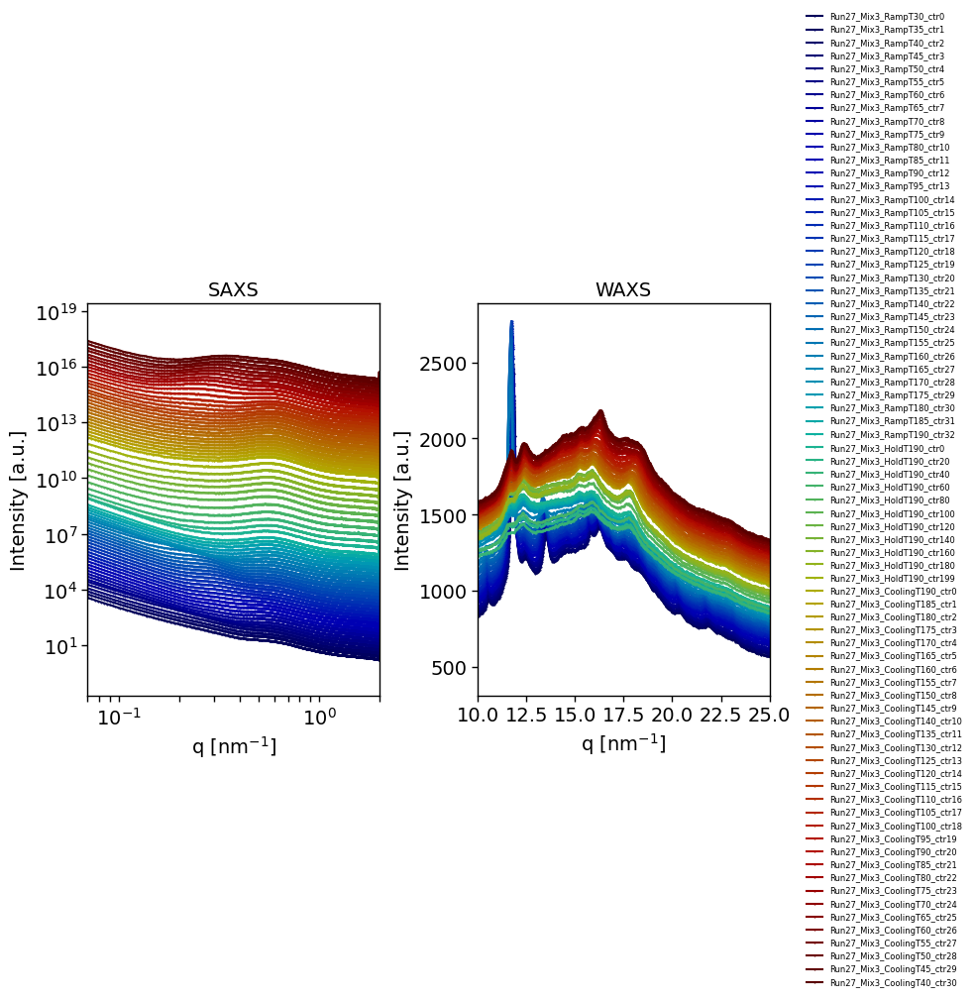

['Run27_Mix3_MeOH_DMEA_RampT*_all', 'Run27_Mix3_MeOH_DMEA_HoldT190*_ctr0_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr20_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr40_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr60_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr80_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr100_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr120_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr140_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr160_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr180_all', 'Run27_Mix3_MeOH_DMEA_HoldT190_ctr199_all', 'Run27_Mix3_MeOH_DMEA_CoolingT*_all']


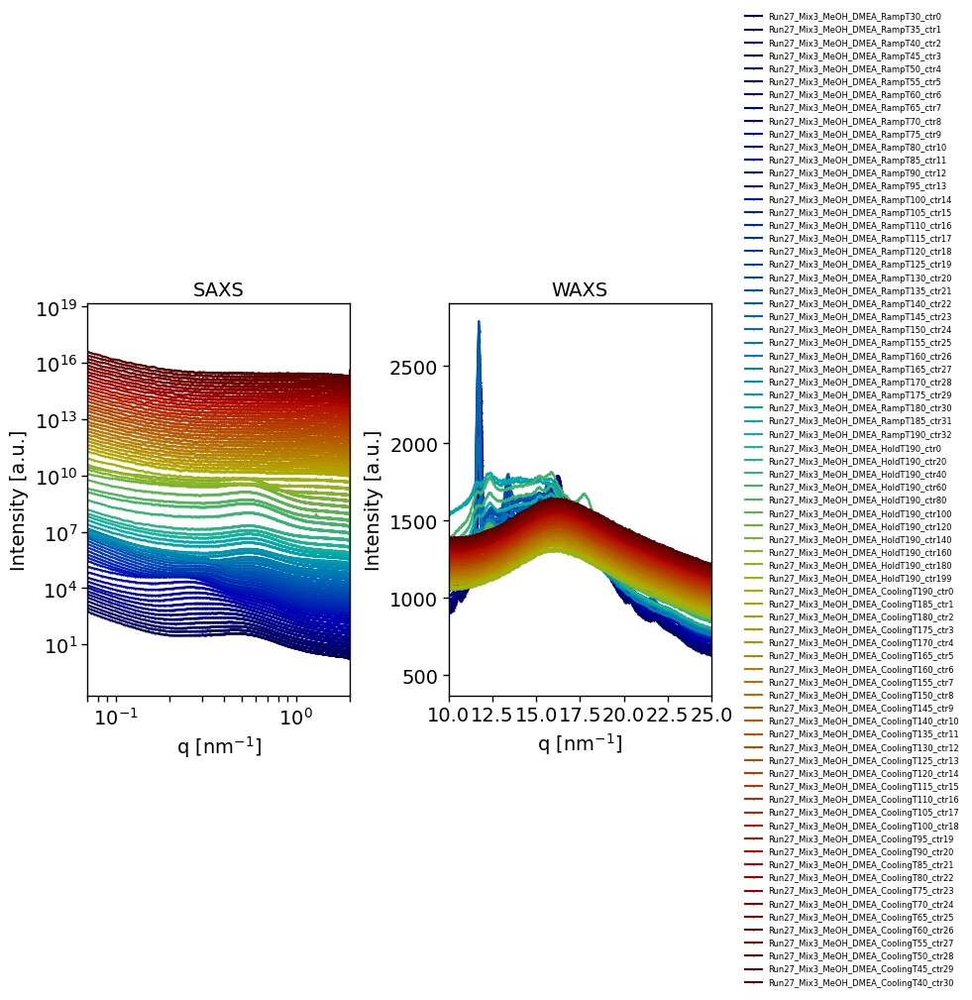

In [164]:
# Run 5
#''' 
all_keywords = [['test_Nylon66_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="5")
all_keywords = [['Run6_Nylon66_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="6")


all_keywords = [['Run7_PET_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="7")
all_keywords = [['Run8c_PET_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="8c")


#Run 11 typo in file name NYlon66 is actaully Nylon6
all_keywords = [['Run11_Nylon66_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="11")
all_keywords = [['Run12_Nylon6_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="12")


all_keywords = [['Run15_Nylon6_AcOH_RampT*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="15")



all_keywords = [
    ['Run13_Nylon6_AcOH_RampT*_all',
    'Run13_Nylon6_AcOH_HoldT120_ctr0_all', 'Run13_Nylon6_AcOH_HoldT120_ctr20_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr40_all', 'Run13_Nylon6_AcOH_HoldT120_ctr60_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr80_all', 'Run13_Nylon6_AcOH_HoldT120_ctr100_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr120_all', 'Run13_Nylon6_AcOH_HoldT120_ctr140_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr160_all', 'Run13_Nylon6_AcOH_HoldT120_ctr180_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr200_all', 'Run13_Nylon6_AcOH_HoldT120_ctr220_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr240_all', 'Run13_Nylon6_AcOH_HoldT120_ctr260_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr280_all', 'Run13_Nylon6_AcOH_HoldT120_ctr300_all',
     'Run13_Nylon6_AcOH_HoldT120_ctr320_all', 'Run13_Nylon6_AcOH_HoldT120_ctr399_all'],
    #['Run13_Nylon6_AcOH_CoolingT*_all']
]

plot_saxs_waxs_data(all_keywords, Run_number="13")


all_keywords = [
    ['Run13b_Nylon6_AcOH_RampT*_all',
    'Run13b_Nylon6_AcOH_HoldT110*_ctr0_all', 'Run13b_Nylon6_AcOH_HoldT110_*ctr20_all',
     'Run13b_Nylon6_AcOH_HoldT110_ctr40_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr60_all',
     'Run13b_Nylon6_AcOH_HoldT110_ctr80_all', 'Run13b_Nylon6_AcOH_HoldT110_ctr100_all',
     'Run13b_Nylon6_AcOH_HoldT110_ctr120_all'
     , 'Run13b_Nylon6_AcOH_CoolingT*_all']
]

plot_saxs_waxs_data(all_keywords, Run_number="13b")


all_keywords = [
    ['Run17_Nylon66_AcOH_RampT*_all',
    'Run17_Nylon66_AcOH_HoldT180_ctr0_all', 'Run17_Nylon66_AcOH_HoldT180_ctr20_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr40_all', 'Run17_Nylon66_AcOH_HoldT180_ctr60_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr80_all', 'Run17_Nylon66_AcOH_HoldT180_ctr100_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr120_all', 'Run17_Nylon66_AcOH_HoldT180_ctr140_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr160_all', 'Run17_Nylon66_AcOH_HoldT180_ctr180_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr200_all', 'Run17_Nylon66_AcOH_HoldT180_ctr220_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr240_all', 'Run17_Nylon66_AcOH_HoldT180_ctr260_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr280_all', 'Run17_Nylon66_AcOH_HoldT180_ctr300_all',
     'Run17_Nylon66_AcOH_HoldT180_ctr320_all', 'Run17_Nylon66_AcOH_HoldT180_ctr399_all',
    'Run17_Nylon66_AcOH_CoolingT*_all']
]

plot_saxs_waxs_data(all_keywords, Run_number="17")
 




all_keywords = [
    ['Run24_PET_MeOH_RampT*_all',
    'Run24_PET_MeOH_HoldT190*_ctr0_all', 'Run24_PET_MeOH_HoldT190_ctr20_all',
     'Run24_PET_MeOH_HoldT190_ctr40_all', 'Run24_PET_MeOH_HoldT190_ctr60_all',
     'Run24_PET_MeOH_HoldT190_ctr80_all', 'Run24_PET_MeOH_HoldT190_ctr100_all',
     'Run24_PET_MeOH_HoldT190_ctr120_all', 'Run24_PET_MeOH_HoldT190_ctr140_all',
     'Run24_PET_MeOH_HoldT190_ctr160_all', 'Run24_PET_MeOH_HoldT190_ctr180_all',
     'Run24_PET_MeOH_HoldT190_ctr199_all',
    'Run24_PET_MeOH_CoolingT*_all']
]

plot_saxs_waxs_data_meth(all_keywords, Run_number="24")



all_keywords = [
    ['Run24_PET_RampT*_all',
    'Run24_PET_HoldT190_ctr0_all', 
    'Run24_PET_HoldT190_ctr20_all', 
    'Run24_PET_HoldT190_ctr40_all', 
    'Run24_PET_HoldT190_ctr60_all',
    'Run24_PET_HoldT190_ctr80_all', 
    'Run24_PET_HoldT190_ctr100_all',
    'Run24_PET_HoldT190_ctr120_all', 
    'Run24_PET_HoldT190_ctr140_all',
    'Run24_PET_HoldT190_ctr160_all', 
    'Run24_PET_HoldT190_ctr180_all',
    'Run24_PET_HoldT190_ctr199_all',
    'Run24_PET_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "_MeOH" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="24")

all_keywords = [
    ['Run23c_PET_MeOH_DMEA_RampT*_all',
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr0_all', 
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr20_all', 
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr40_all', 
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr60_all',
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr80_all', 
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr100_all',
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr120_all', 
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr140_all',
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr160_all', 
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr180_all',
    'Run23c_PET_MeOH_DMEA_HoldT190_ctr199_all',
    'Run23c_PET_MeOH_DMEA_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "_MeOH" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="23c")


all_keywords = [
    ['Run25_PET_Fiber1_RampT*_all',
    'Run25_PET_Fiber1_HoldT190*_ctr0_all', 
    'Run25_PET_Fiber1_HoldT190_ctr20_all', 
    'Run25_PET_Fiber1_HoldT190_ctr40_all', 
    'Run25_PET_Fiber1_HoldT190_ctr60_all',
    'Run25_PET_Fiber1_HoldT190_ctr80_all', 
    'Run25_PET_Fiber1_HoldT190_ctr100_all',
    'Run25_PET_Fiber1_HoldT190_ctr120_all', 
    'Run25_PET_Fiber1_HoldT190_ctr140_all',
    'Run25_PET_Fiber1_HoldT190_ctr160_all', 
    'Run25_PET_Fiber1_HoldT190_ctr180_all',
    'Run25_PET_Fiber1_HoldT190_ctr199_all',
    'Run25_PET_Fiber1_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "_MeOH" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="25")


all_keywords = [
    ['Run26_PET_Fiber1_RampT*_all',
    'Run26_PET_Fiber1_HoldT190*_ctr0_all', 
    'Run26_PET_Fiber1_HoldT190_ctr20_all', 
    'Run26_PET_Fiber1_HoldT190_ctr40_all', 
    'Run26_PET_Fiber1_HoldT190_ctr60_all',
    'Run26_PET_Fiber1_HoldT190_ctr80_all', 
    'Run26_PET_Fiber1_HoldT190_ctr100_all',
    'Run26_PET_Fiber1_HoldT190_ctr120_all', 
    'Run26_PET_Fiber1_HoldT190_ctr140_all',
    'Run26_PET_Fiber1_HoldT190_ctr160_all', 
    'Run26_PET_Fiber1_HoldT190_ctr180_all',
    'Run26_PET_Fiber1_HoldT190_ctr199_all',
    'Run26_PET_Fiber1_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "_MeOH_DMEA" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="26")




all_keywords = [
    ['Run26_PET_BiaxFilm_MeOH_DMEA_RampT*_all',
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr0_all', 
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr20_all', 
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr40_all', 
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr60_all',
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr80_all', 
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr100_all',
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr120_all', 
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr140_all',
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr160_all', 
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr180_all',
    'Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190_ctr199_all',
    'Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "_MeOH_DMEA" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="26")


all_keywords = [
    ['Run26_Mix3_MeOH_DMEA_RampT*_all'],
    ['Run26_Mix3_MeOH_DMEA_HoldT190*_ctr0_all', 
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr20_all', 
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr40_all', 
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr60_all',
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr80_all', 
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr100_all',
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr120_all', 
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr140_all',
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr160_all', 
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr180_all',
    'Run26_Mix3_MeOH_DMEA_HoldT190_ctr199_all'],
    ['Run26_Mix3_MeOH_DMEA_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "_MeOH_DMEA" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="26")


all_keywords = [
    ['Run27_Mix3_MeOH_RampT*_all',
    'Run27_Mix3_MeOH_HoldT190*_ctr0_all', 
    'Run27_Mix3_MeOH_HoldT190_ctr20_all', 
    'Run27_Mix3_MeOH_HoldT190_ctr40_all', 
    'Run27_Mix3_MeOH_HoldT190_ctr60_all',
    'Run27_Mix3_MeOH_HoldT190_ctr80_all', 
    'Run27_Mix3_MeOH_HoldT190_ctr100_all',
    'Run27_Mix3_MeOH_HoldT190_ctr120_all', 
    'Run27_Mix3_MeOH_HoldT190_ctr140_all',
    'Run27_Mix3_MeOH_HoldT190_ctr160_all', 
    'Run27_Mix3_MeOH_HoldT190_ctr180_all',
    'Run27_Mix3_MeOH_HoldT190_ctr199_all',
    'Run27_Mix3_MeOH_CoolingT*_all']
]

#all_keywords = [keyword for keyword in all_keywords if "DMEA" not in keyword]

plot_saxs_waxs_data_meth(all_keywords, Run_number="27")



all_keywords = [
    ['Run27_Mix3_RampT*_all',
    'Run27_Mix3_HoldT190*_ctr0_all', 
    'Run27_Mix3_HoldT190_ctr20_all', 
    'Run27_Mix3_HoldT190_ctr40_all', 
    'Run27_Mix3_HoldT190_ctr60_all',
    'Run27_Mix3_HoldT190_ctr80_all', 
    'Run27_Mix3_HoldT190_ctr100_all',
    'Run27_Mix3_HoldT190_ctr120_all', 
    'Run27_Mix3_HoldT190_ctr140_all',
    'Run27_Mix3_HoldT190_ctr160_all', 
    'Run27_Mix3_HoldT190_ctr180_all',
    'Run27_Mix3_HoldT190_ctr199_all',
    'Run27_Mix3_CoolingT*_all']
]

plot_saxs_waxs_data_meth(all_keywords, Run_number="27")


all_keywords = [
    ['Run27_Mix3_MeOH_DMEA_RampT*_all',
    'Run27_Mix3_MeOH_DMEA_HoldT190*_ctr0_all', 
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr20_all', 
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr40_all', 
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr60_all',
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr80_all', 
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr100_all',
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr120_all', 
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr140_all',
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr160_all', 
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr180_all',
    'Run27_Mix3_MeOH_DMEA_HoldT190_ctr199_all',
    'Run27_Mix3_MeOH_DMEA_CoolingT*_all']
]

plot_saxs_waxs_data_meth(all_keywords, Run_number="27")
#'''

## create ppt from figs

In [167]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Sat Feb 11 13:12:28 2023

@author: akmaurya
"""

import os
from pptx import Presentation
from pptx.util import Inches
from pptx.dml.color import RGBColor

#path = os.getcwd()

path = "/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/May2024/OneD_integrated_SAXS_01/Reduction/Figure_saxs_waxs_Reduced/"
#path = "/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Acetolysis/May2024/OneD_integrated_SAXS_01/Reduction/Figure_saxs_waxs_Reduced/"

files = sorted(os.listdir(path))


# Create a presentation object
prs = Presentation()

# Change the slide size to 16:9 aspect ratio
width = Inches(9)
height = Inches(5)
prs.slide_width = width
prs.slide_height = height

# Loop through all the files in the folder
for filename in files:
    if filename.endswith(".png"):
        slide = prs.slides.add_slide(prs.slide_layouts[6])
        left = top = Inches(1)
        height = Inches(4)

        pic = slide.shapes.add_picture(os.path.join(path, filename), left, top, height=height)
        
        # Calculate the aspect ratio of the image
        aspect_ratio = pic.width/pic.height
        
        # Calculate the width based on the height and aspect ratio
        width = int(height * aspect_ratio)
        
        # Update the picture object with the new width
        pic.width = width
        
        # Center the image on the slide
        pic.left = int((prs.slide_width - pic.width) / 2)
        pic.top = int((prs.slide_height - pic.height) / 2)
        
        
        # Add a title to the slide
       # Add a title to the slide
        title_shape = slide.shapes.add_textbox(Inches(0), Inches(0), Inches(9), Inches(1))
        title_text_frame = title_shape.text_frame
        title_text = title_text_frame.text = filename.split(".")[0]
        
        # Set the font size to 32
        title_text_frame.paragraphs[0].font.size = Inches(32/72)
        
        # Set the font color to maroon
        title_text_frame.paragraphs[0].font.color.rgb = RGBColor(0x80, 0x00, 0x00)

        # Set the font to bold
        title_text_frame.paragraphs[0].font.bold = True
# Save the PowerPoint presentation
prs.save(os.path.join(path, "Report_final01.pptx"))
print("PPTX file created successfully!")


PPTX file created successfully!


## plotting during the beamtime

In [ ]:

'''
all_keywords = [['Run1_Nylon6_RampT_ctr*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="1")

all_keywords = [['Run2_Nylon6_AcOH_RampT_ctr*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="2")


all_keywords = [['Run3_AcOH_RampT*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="3")

all_keywords = [['test_Nylon66_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="5")


all_keywords = [['Run6_Nylon66_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="6")

all_keywords = [['Run7_PET_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="7")

#all_keywords = [['Run8a_PET_AcOH_T*_all']]
#plot_saxs_waxs_data(all_keywords, Run_number="8a")

#all_keywords = [['Run9_AcOH_T*_all']]
#plot_saxs_waxs_data(all_keywords, Run_number="9")

all_keywords = [['Run11_Nylon66_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="11")

all_keywords = [['Run12_Nylon6_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="12")


all_keywords = [['Run13_Nylon6_AcOH_RampT*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="13")

all_keywords = [['Run13_Nylon6_AcOH_HoldT120_ctr0_all','Run13_Nylon6_AcOH_HoldT120_ctr20_all',
                 'Run13_Nylon6_AcOH_HoldT120_ctr40_all','Run13_Nylon6_AcOH_HoldT120_ctr60_all',
                'Run13_Nylon6_AcOH_HoldT120_ctr80_all','Run13_Nylon6_AcOH_HoldT120_ctr100_all',
                'Run13_Nylon6_AcOH_HoldT120_ctr120_all','Run13_Nylon6_AcOH_HoldT120_ctr140_all'
                'Run13_Nylon6_AcOH_HoldT120_ctr160_all','Run13_Nylon6_AcOH_HoldT120_ctr180_all',
                'Run13_Nylon6_AcOH_HoldT120_ctr200_all','Run13_Nylon6_AcOH_HoldT120_ctr220_all',
                'Run13_Nylon6_AcOH_HoldT120_ctr240_all','Run13_Nylon6_AcOH_HoldT120_ctr260_all',
                'Run13_Nylon6_AcOH_HoldT120_ctr280_all','Run13_Nylon6_AcOH_HoldT120_ctr300_all',
                'Run13_Nylon6_AcOH_HoldT120_ctr320_all','Run13_Nylon6_AcOH_HoldT120_ctr399_all']]
plot_saxs_waxs_data(all_keywords, Run_number="13")

all_keywords = [['Run13_AcOH_RampT*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="13")

all_keywords = [['Run17_Nylon66_AcOH_RampT*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="17")

all_keywords = [['Run17_Nylon66_AcOH_RampT*_all'],['Run17_Nylon66_AcOH_RampT*_all','Run17_Nylon66_AcOH_HoldT180*_ctr0_all','Run17_Nylon66_AcOH_HoldT180*_ctr50_all',
                'Run17_Nylon66_AcOH_HoldT180*_ctr100_all', 'Run17_Nylon66_AcOH_HoldT180*_ctr150_all',
                'Run17_Nylon66_AcOH_HoldT180*_ctr200_all','Run17_Nylon66_AcOH_HoldT180*_ctr250_all',
                'Run17_Nylon66_AcOH_HoldT180*_ctr300_all','Run17_Nylon66_AcOH_HoldT180*_ctr305_all',
                'Run17_Nylon66_AcOH_HoldT180*_ctr306_all','Run17_Nylon66_AcOH_HoldT180*_ctr348_all','Run17_Nylon66_AcOH_CoolingT*_ctr15_all'],['Run17_Nylon66_AcOH_CoolingT*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="17")



all_keywords = [['Run8b_PET_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="8b")

all_keywords = [['Run8c_PET_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="8c")


all_keywords = [['Run8c_PET_AcOH_T*_all']]
plot_saxs_waxs_data(all_keywords, Run_number="8c")

#Run23c

all_keywords = [['Run23c_PET_MeOH_DMEA_RampT*_all'],
                ['Run23c_PET_MeOH_DMEA_HoldT190*_all'],
                ['Run23c_PET_MeOH_DMEA_CoolingT*_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="23c")


# Run 24

all_keywords = [['Run24_PET_RampT*_all'],['Run24_PET_HoldT190*_ctr0_all',
                                                     'Run24_PET_HoldT190*_ctr25_all',
                                                     'Run24_PET_HoldT190*_ctr50_all',
                                                     'Run24_PET_HoldT190*_ctr75_all',
                                                     'Run24_PET_HoldT190*_ctr100_all',
                                                    'Run24_PETA_HoldT190*_ctr125_all',
                                                    'Run24_PET_HoldT190*_ctr150_all',
                                                    'Run24_PET_HoldT190*_ctr175_all',
                                                    'Run24_PET_HoldT190*_ctr199_all'],
                ['Run24_PET_CoolingT*_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="24")

all_keywords = [['Run24_PET_MeOH_RampT*_all'],['Run24_PET_MeOH_HoldT190*_ctr0_all',
                                                     'Run24_PET_MeOH_HoldT190*_ctr25_all',
                                                     'Run24_PET_MeOH_HoldT190*_ctr50_all',
                                                     'Run24_PET_MeOH_HoldT190*_ctr75_all',
                                                     'Run24_PET_MeOH_HoldT190*_ctr100_all',
                                                    'Run24_PET_MeOH_HoldT190*_ctr125_all',
                                                    'Run24_PET_MeOH_HoldT190*_ctr150_all',
                                                    'Run24_PET_MeOH_HoldT190*_ctr175_all',
                                                    'Run24_PET_MeOH_HoldT190*_ctr199_all'],
                ['Run24_PET_MeOH_CoolingT*_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="24")


#Run 25

all_keywords = [['Run25_PET_Fiber1_RampT*_all'],['Run25_PET_Fiber1_HoldT190*_all'],
                ['Run25_PET_Fiber1_CoolingT*_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="25")


all_keywords = [['Run25_PET_BiaxFilm_RampT*_all'],
                ['Run25_PET_BiaxFilm_HoldT190*_all'],
                ['Run25_PET_BiaxFilm_CoolingT*_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="25")


# Run27

all_keywords = [['Run27_Mix3_MeOH_DMEA_RampT*_all'],['Run27_Mix3_RampT*_all'],['Run27_Mix3_MeOH_RampT*_all'],
                ['Run27_Mix3_MeOH_DMEA_HoldT190*_all'],['Run27_Mix3_HoldT190*_all'],['Run27_Mix3_MeOH_HoldT190*_all'],
                ['Run27_Mix3_MeOH_DMEA_CoolingT*_all'],['Run27_Mix3_CoolingT*_all'],['Run27_Mix3_CoolingT*_all']] 
plot_saxs_waxs_data_meth(all_keywords, Run_number="27") 


# Run26
all_keywords = [['Run26_PET_BiaxFilm_MeOH_DMEA_RampT*_all'],['Run26_PET_Fiber1_RampT*_all'],['Run26_Mix3_MeOH_DMEA_RampT*_all'],
               ['Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr0_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr20_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr40_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr60_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr80_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr100_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr120_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr140_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr160_all','Run26_PET_BiaxFilm_MeOH_DMEA_HoldT190*_ctr180_all'],
               ['Run26_PET_Fiber1_HoldT190*_ctr0_all','Run26_PET_Fiber1_HoldT190*_ctr20_all','Run26_PET_Fiber1_HoldT190*_ctr40_all','Run26_PET_Fiber1_HoldT190*_ctr60_all','Run26_PET_Fiber1_HoldT190*_ctr80_all','Run26_PET_Fiber1_HoldT190*_ctr100_all','Run26_PET_Fiber1_HoldT190*_ctr120_all','Run26_PET_Fiber1_HoldT190*_ctr140_all','Run26_PET_Fiber1_HoldT190*_ctr160_all','Run26_PET_Fiber1_HoldT190*_ctr180_all'],
               ['Run26_Mix3_MeOH_DMEA_HoldT190*_ctr0_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr20_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr40_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr60_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr80_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr100_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr120_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr140_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr160_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr180_all'],
               ['Run26_PET_BiaxFilm_MeOH_DMEA_CoolingT*_all'],['Run26_PET_Fiber1_CoolingT*_all'],['Run26_Mix3_MeOH_DMEA_CoolingT*_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="26")


all_keywords = [['Run26_Mix3_MeOH_DMEA_RampT*_all',
                'Run26_Mix3_MeOH_DMEA_HoldT190*_ctr0_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr20_all',
                 'Run26_Mix3_MeOH_DMEA_HoldT190*_ctr40_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr60_all',
                 'Run26_Mix3_MeOH_DMEA_HoldT190*_ctr80_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr100_all',
                  'Run26_Mix3_MeOH_DMEA_HoldT190*_ctr120_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr140_all',
                  'Run26_Mix3_MeOH_DMEA_HoldT190*_ctr160_all','Run26_Mix3_MeOH_DMEA_HoldT190*_ctr180_all']]
plot_saxs_waxs_data_meth(all_keywords, Run_number="26")
'''